# Oman dike orientation

This notebook compiles field data from January 2023 and January 2024 fieldwork to determine the orientations of Shaat dikes that were studied in the Mirbat region of southern Oman.

Fisher means are calculated from the poles to planes of individual dikes to get a mean orientation for each studied dike.

The notebook uses the  `oman_dikes` environment documented in the `oman_dikes.yml` file within the repository that hosts this notebook.

## Import scientific Python packages

PmagPy can be installed using pip:
```
pip install pmagpy
```
mplstereonet can be installed using pip:
```
pip install mplstereonet
```

In [1]:
import sys
import pmagpy.pmag as pmag
import pmagpy.pmagplotlib as pmagplotlib
import pmagpy.ipmag as ipmag
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', None)
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

import mplstereonet

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## make function to calculate orientations of poles to planes

In [2]:
def calc_pole_from_plane(planes):
    # planes is a pandas dataframe with columns: strike, dip, dipAzimuth
    planes['pole_trend'] = (planes[' dipAzimuth']+180)%360
    planes['pole_plunge'] = 90-planes[' dip']
    return planes

## make function to calculate mean dike orientation (pole to plane)

In [3]:
def calc_plot_dike_mean(dike_name, pole_trends, pole_plunges):
    """
    Calculate and plot the mean dike plane pole, and compute the dike's strike and dip.

    Parameters:
    dike_name (str): Name of the dike for labeling the plot.
    pole_trends (pandas.Series): Series containing the trends of the poles.
    pole_plunges (pandas.Series): Series containing the plunges of the poles.

    Returns:
    tuple: A tuple containing:
        - dike_plane_pole_mean (dict): Dictionary with the mean pole direction parameters.
        - dike_strike (float): Calculated strike of the dike.
        - dike_dip (float): Calculated dip of the dike.
    """
      
    pole_trends_list = pole_trends.to_list()
    pole_plunges_list = pole_plunges.to_list()
    
    fignum = 1
    plt.figure(num=fignum,figsize=(3,3))
    ipmag.plot_net(fignum)
    ipmag.plot_di(pole_trends_list,pole_plunges_list,alpha=0.5)
    plt.title(dike_name+"\npoles to dike orientation\nplanes", fontsize=16)
    plt.show()
    pole_di_block = ipmag.make_di_block(pole_trends_list,
                                        pole_plunges_list)
    flipped_poles = pmag.flip(pole_di_block)
    flipped_poles_merged = flipped_poles[0]+flipped_poles[1]
    
    # make empty dictionary to store mean dike plane pole
    dike_plane_pole_mean = {}

    # in case there is only one plane measurement
    if len(pole_trends_list)<=1:
        dike_plane_pole_mean['dec'] = pole_trends_list[0]
        dike_plane_pole_mean['inc'] = pole_plunges_list[0]
        dike_plane_pole_mean['alpha95'] = 0 
        dike_plane_pole_mean['n'] = 1
        dike_plane_pole_mean['k'] = 0
    # otherwise calculate mean pole
    else:
        dike_plane_pole_mean = ipmag.fisher_mean(di_block=flipped_poles_merged)
        print('The mean dike plane pole is:')
        ipmag.print_direction_mean(dike_plane_pole_mean)
        
        fignum = 1
        plt.figure(num=fignum,figsize=(3,3))
        ipmag.plot_net(fignum)
        ipmag.plot_di(di_block=flipped_poles_merged,alpha=0.5)
        ipmag.plot_di_mean(dike_plane_pole_mean['dec'],dike_plane_pole_mean['inc'],
                        dike_plane_pole_mean['alpha95'],color='red')
        plt.title(dike_name+"\npoles to dike orientations\n(in single 'polarity')\nwith mean", fontsize=16)
        plt.show()
    
    dike_strike = dike_plane_pole_mean['dec'] + 90
    dike_dip = 90 - dike_plane_pole_mean['inc']

    return dike_plane_pole_mean, dike_strike, dike_dip

## import dike orientation data collected by Nick, Adrian, and Yiming

In [4]:
Nick_planes_2023 = pd.read_csv('../data/field_data/Nick_csv/dike_orientations.csv')
Nick_planes_2023[' unitId'].unique()

array([' Ayn Formation', ' SD01', ' SD02', ' SD03', ' SD04', ' SD05',
       ' SD06', ' SD07', ' SD08', ' SD09', ' SD10', ' SD11', ' SD12',
       ' SD13', ' SD14', ' SD15', ' SD16', ' SD17', ' SD18', ' SD19',
       ' SD20', ' SD21', ' SD22', ' SD23', ' SD24', ' SD25', ' SD26',
       ' SD27', ' SD28', ' SD29', ' SD30', ' SD31', ' SD32', ' SD33',
       ' SD34', ' SD35', ' SD36', ' SD37', ' SD38', ' SD39', ' SD40',
       ' SD42', ' SD43', ' SD44', ' SD45', ' SD46', ' SD47', ' SD48',
       ' SD49', ' SD51', ' SD52'], dtype=object)

In [5]:
Adrian_planes = pd.read_csv('../data/field_data/Adrian_csv/plane.csv')
Adrian_planes_SD = Adrian_planes[Adrian_planes[' rockUnit']!=' Fault'].sort_values(by=' rockUnit').reset_index(drop=True)

Nick_planes_2023 = pd.read_csv('../data/field_data/Nick_csv/dike_orientations.csv')
Yiming_planes = pd.read_csv('../data/field_data/Yiming_csv/plane.csv')
Nick_planes_2024 = pd.read_csv('../data/field_data/Nick_csv/plane_2024.csv')
# unify column names
Nick_planes_2023[' rockUnit'] = Nick_planes_2023[' unitId']
Nick_planes_2024[' rockUnit'] = Nick_planes_2024[' unitId']
Yiming_planes[' rockUnit'] = Yiming_planes[' unitId']

exclude_units = [
    ' Marsham ',
    ' Cenozoic Eur limestone',
    ' Sadah mafic dike',
    ' Arkawahl',
    ' Marsham',
    ' Juffa Gneiss',
    ' Mesozoic sedimentary rocks',
    ' Ayn Formation', ' Shareef',
    ' Shaat Dike'
]

# Filter out the specified units
Yiming_planes_SD = Yiming_planes[~Yiming_planes[' unitId'].isin(exclude_units)].reset_index(drop=True)
Nick_planes_2023_SD = Nick_planes_2023[~Nick_planes_2023[' unitId'].isin(exclude_units)].reset_index(drop=True)
Nick_planes_2024_SD = Nick_planes_2024[~Nick_planes_2024[' unitId'].isin(exclude_units)].reset_index(drop=True)

# combine all Shaat dike planes
all_SD_planes = pd.concat([Adrian_planes_SD, Nick_planes_2023_SD, Nick_planes_2024_SD, Yiming_planes_SD], ignore_index=True)
all_SD_planes = calc_pole_from_plane(all_SD_planes)

In [6]:
all_SD_planes.tail(1)

,localityId,localityName,dataId,x,y,latitude,longitude,zone,altitude,horiz_precision,...,dip,dipAzimuth,strike,declination,rockUnit,timedate,notes,unitId,pole_trend,pole_plunge
1711,538fbc90fbc153786f843de7319bc904,Locality 1,44a1df3efba3fd0e3b093ea67859527b,281678.071086,1.894568e+06,17.125297,54.947932,40Q,3.567136,4.593482,...,74.019821,233.913055,143.913055,1.002502,SD53,Fri Jan 12 21:26:49 2024,,SD53,53.913055,15.980179


In [7]:
all_SD_planes[' rockUnit'].unique()

array([' SD01', ' SD02', ' SD03', ' SD04', ' SD05', ' SD06', ' SD07',
       ' SD08', ' SD09', ' SD10', ' SD11', ' SD12', ' SD13', ' SD14',
       ' SD15', ' SD16', ' SD17', ' SD18', ' SD19', ' SD20', ' SD21',
       ' SD22', ' SD23', ' SD24', ' SD25', ' SD26', ' SD27', ' SD28',
       ' SD29', ' SD30', ' SD31', ' SD32', ' SD33', ' SD34', ' SD35',
       ' SD36', ' SD37', ' SD38', ' SD39', ' SD40', ' SD42', ' SD43',
       ' SD44', ' SD45', ' SD46', ' SD47', ' SD48', ' SD49', ' SD51',
       ' SD52', ' SD106', ' SD104', ' SD105', ' SD102', ' SD100', ' SD98',
       ' SD94', ' SD92', ' SD90', ' SD89', ' SD88', ' SD86', ' SD85',
       ' SD81', ' SD83', ' SD84', ' SD82', ' SD78', ' SD76', ' SD74',
       ' SD75', ' SD73', ' SD72', ' SD71', ' SD69', ' SD68', ' SD66',
       ' SD63', ' SD60', ' SD58', ' SD57', ' SD56', ' SD55', ' SD54',
       ' SD53'], dtype=object)

In [8]:
all_SD_planes[' planeType'].unique()

array([' Dike Margin', ' Dike orientation', ' Fault', ' dike plane'],
      dtype=object)

In [9]:
all_dike_planes = all_SD_planes[(all_SD_planes[' planeType'] != ' Fault')]

## Example dike orientation

Here we will plot up the data for a single dike and calculate the mean from the poles. Let's use SD02 as an example.

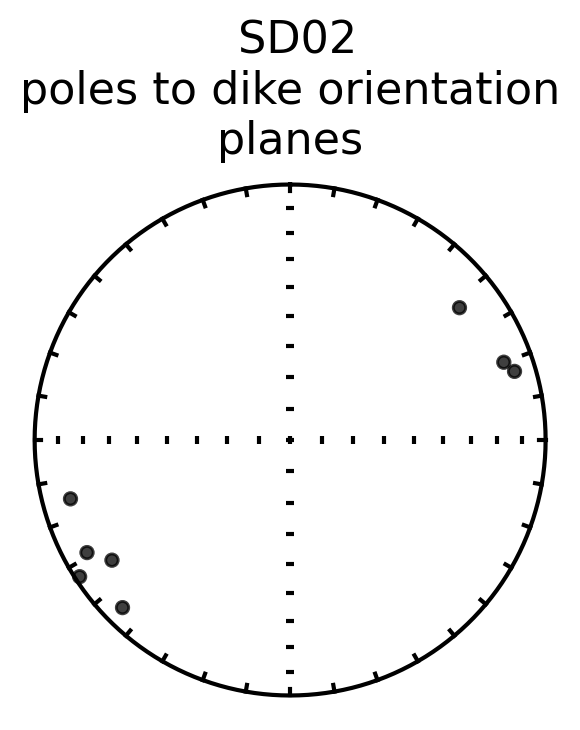

The mean dike plane pole is:
Dec: 241.1  Inc: 1.4
Number of directions in mean (n): 16
Angular radius of 95% confidence (a_95): 7.3
Precision parameter (k) estimate: 26.3


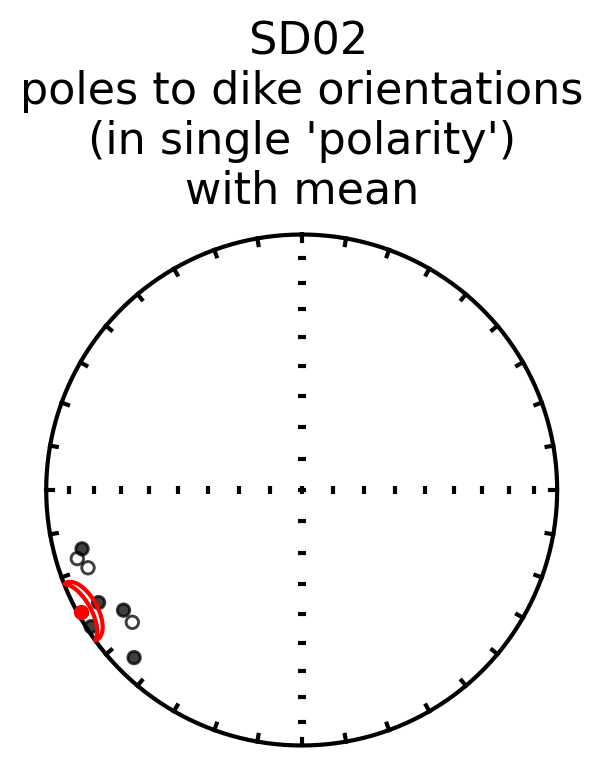

In [10]:
SD02_planes = all_dike_planes[all_dike_planes[' rockUnit'] == ' SD02']
SD02_pole_mean, SD02_strike, SD02_dip = calc_plot_dike_mean(' SD02', SD02_planes['pole_trend'], SD02_planes['pole_plunge'])

In [11]:
all_dike_planes[' rockUnit'].unique()

array([' SD01', ' SD02', ' SD03', ' SD04', ' SD05', ' SD06', ' SD07',
       ' SD08', ' SD09', ' SD10', ' SD11', ' SD12', ' SD13', ' SD14',
       ' SD15', ' SD16', ' SD17', ' SD18', ' SD19', ' SD20', ' SD21',
       ' SD22', ' SD23', ' SD24', ' SD25', ' SD26', ' SD27', ' SD28',
       ' SD29', ' SD30', ' SD31', ' SD32', ' SD33', ' SD34', ' SD35',
       ' SD36', ' SD37', ' SD38', ' SD39', ' SD40', ' SD42', ' SD43',
       ' SD44', ' SD45', ' SD46', ' SD47', ' SD48', ' SD49', ' SD51',
       ' SD52', ' SD106', ' SD104', ' SD105', ' SD102', ' SD100', ' SD94',
       ' SD92', ' SD90', ' SD89', ' SD88', ' SD86', ' SD85', ' SD81',
       ' SD83', ' SD84', ' SD82', ' SD78', ' SD76', ' SD74', ' SD75',
       ' SD73', ' SD72', ' SD71', ' SD69', ' SD68', ' SD66', ' SD98',
       ' SD63', ' SD60', ' SD58', ' SD57', ' SD56', ' SD55', ' SD54',
       ' SD53'], dtype=object)

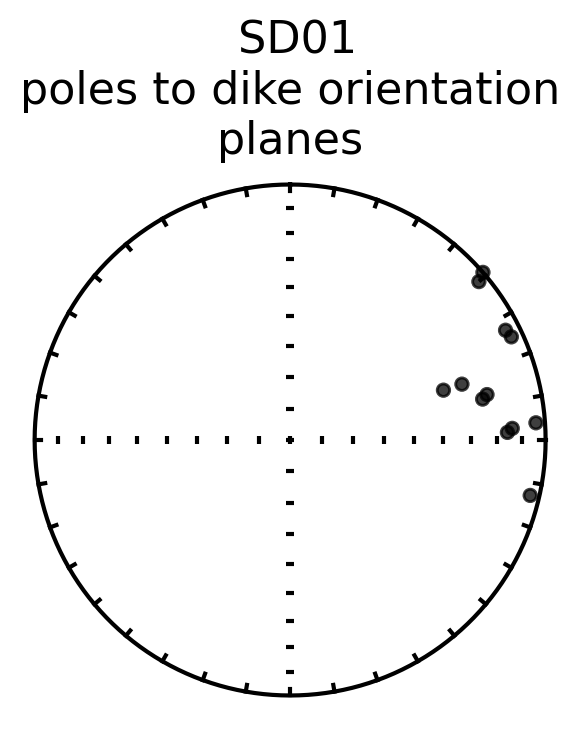

The mean dike plane pole is:
Dec: 74.1  Inc: 14.3
Number of directions in mean (n): 24
Angular radius of 95% confidence (a_95): 7.2
Precision parameter (k) estimate: 17.9


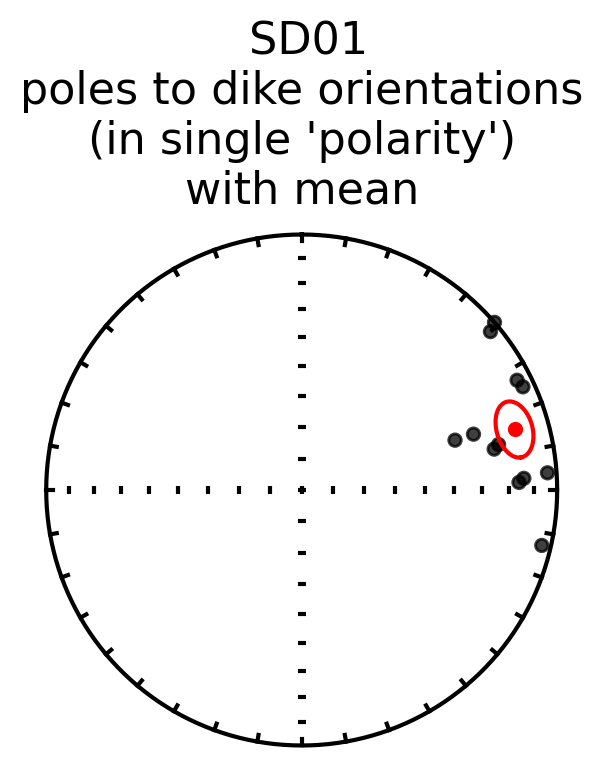

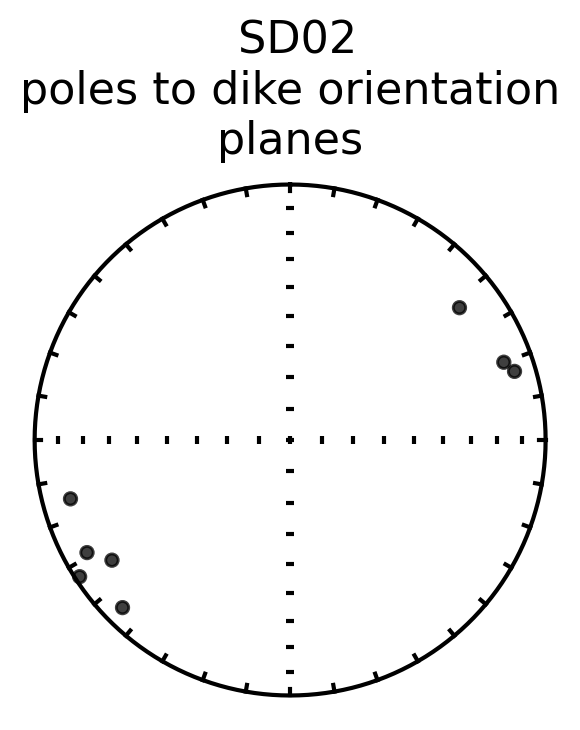

The mean dike plane pole is:
Dec: 241.1  Inc: 1.4
Number of directions in mean (n): 16
Angular radius of 95% confidence (a_95): 7.3
Precision parameter (k) estimate: 26.3


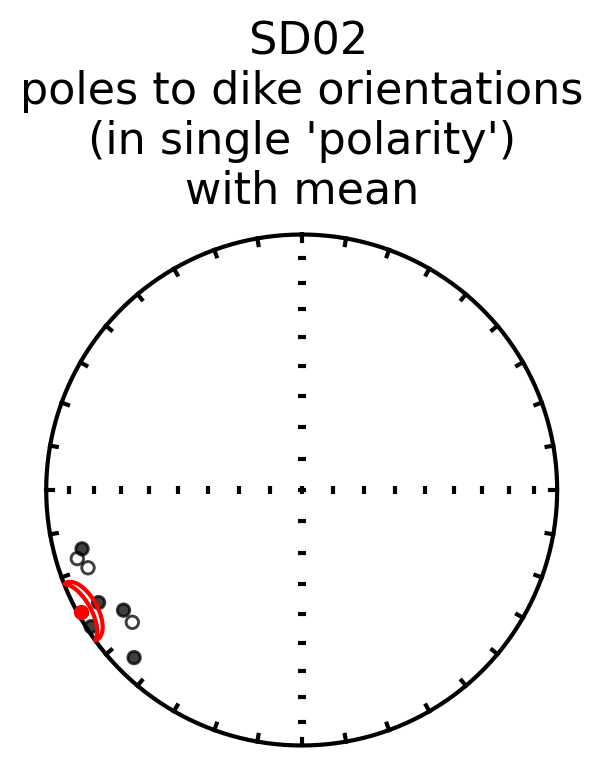

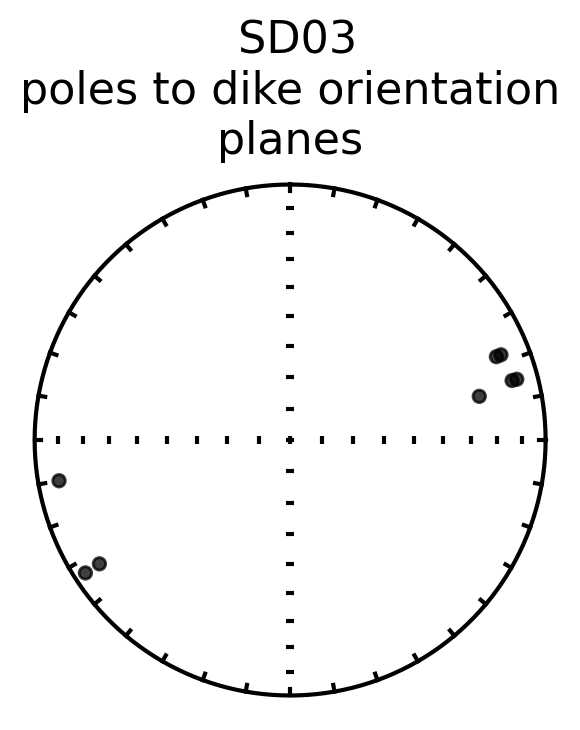

The mean dike plane pole is:
Dec: 69.6  Inc: 5.7
Number of directions in mean (n): 16
Angular radius of 95% confidence (a_95): 6.9
Precision parameter (k) estimate: 29.2


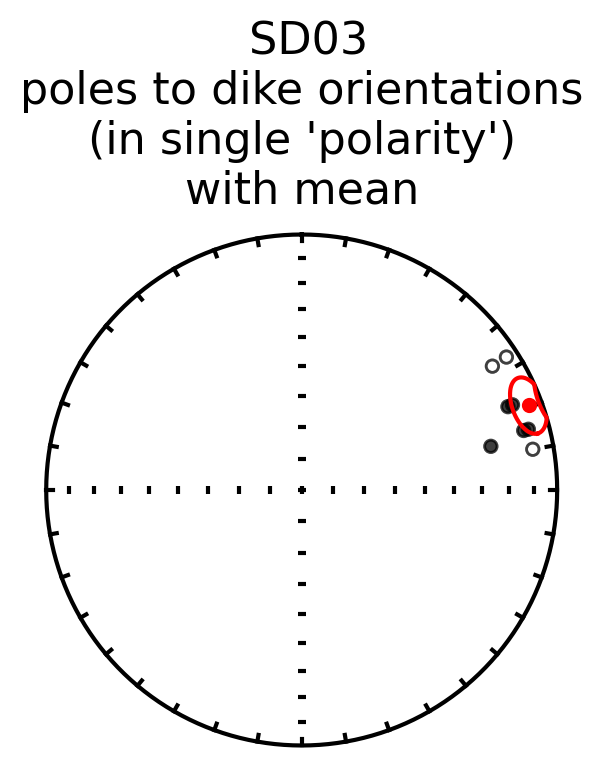

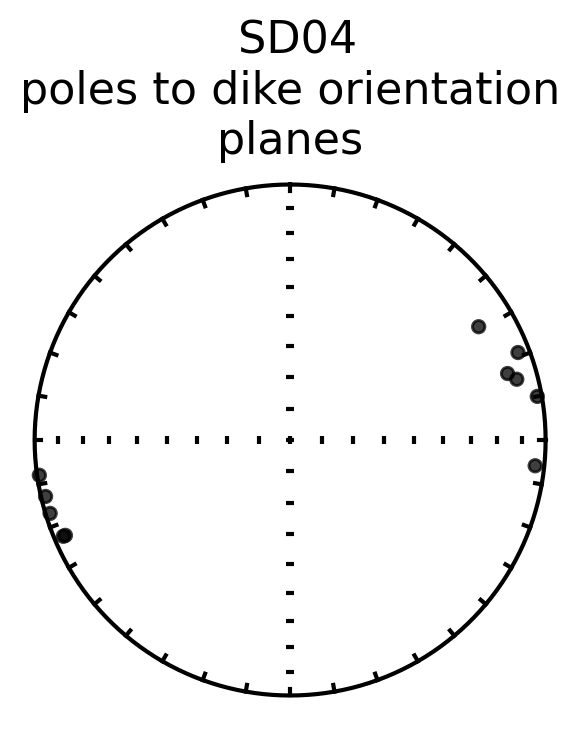

The mean dike plane pole is:
Dec: 74.4  Inc: 3.0
Number of directions in mean (n): 22
Angular radius of 95% confidence (a_95): 4.4
Precision parameter (k) estimate: 50.3


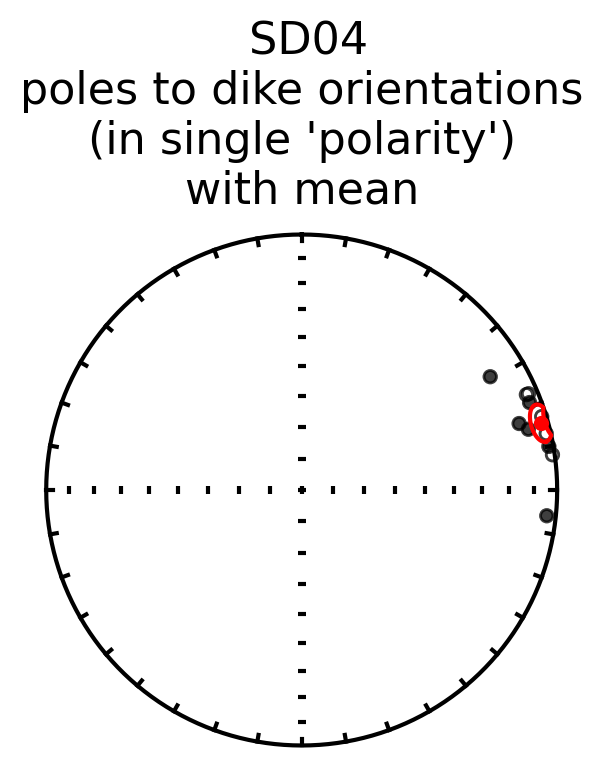

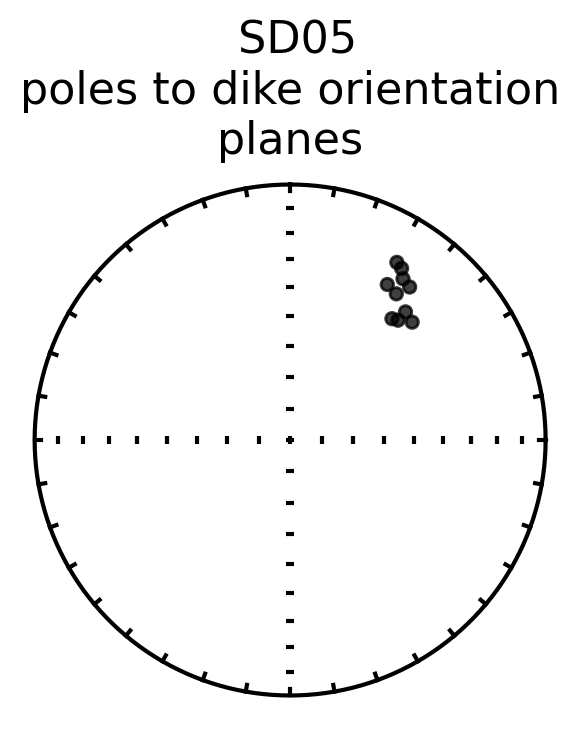

The mean dike plane pole is:
Dec: 37.3  Inc: 29.2
Number of directions in mean (n): 20
Angular radius of 95% confidence (a_95): 3.0
Precision parameter (k) estimate: 115.8


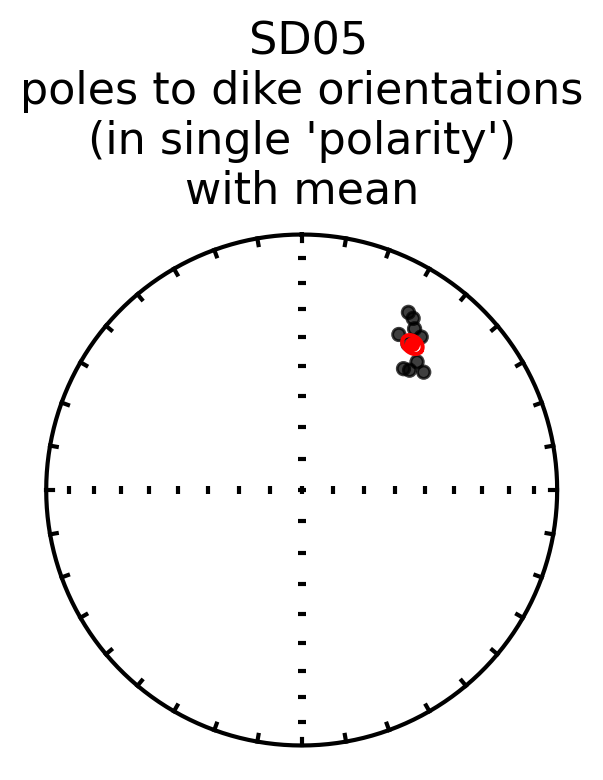

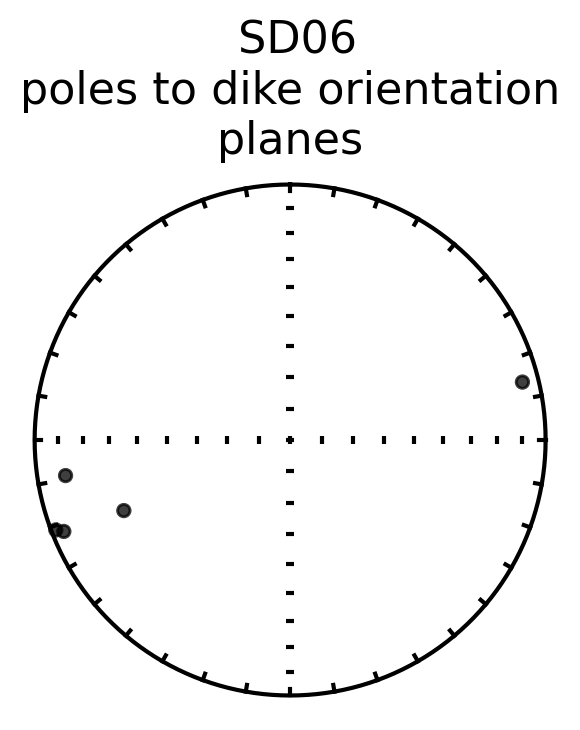

The mean dike plane pole is:
Dec: 252.3  Inc: 8.4
Number of directions in mean (n): 10
Angular radius of 95% confidence (a_95): 8.6
Precision parameter (k) estimate: 32.8


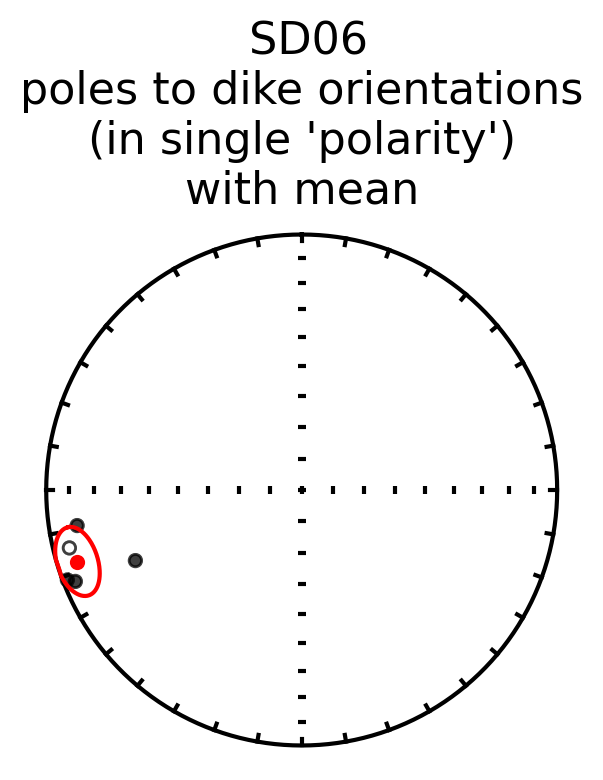

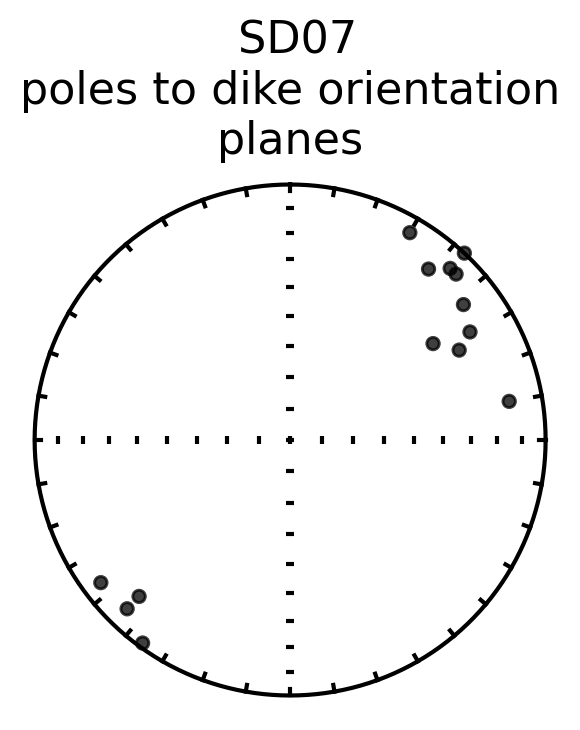

The mean dike plane pole is:
Dec: 48.7  Inc: 8.2
Number of directions in mean (n): 28
Angular radius of 95% confidence (a_95): 6.2
Precision parameter (k) estimate: 20.0


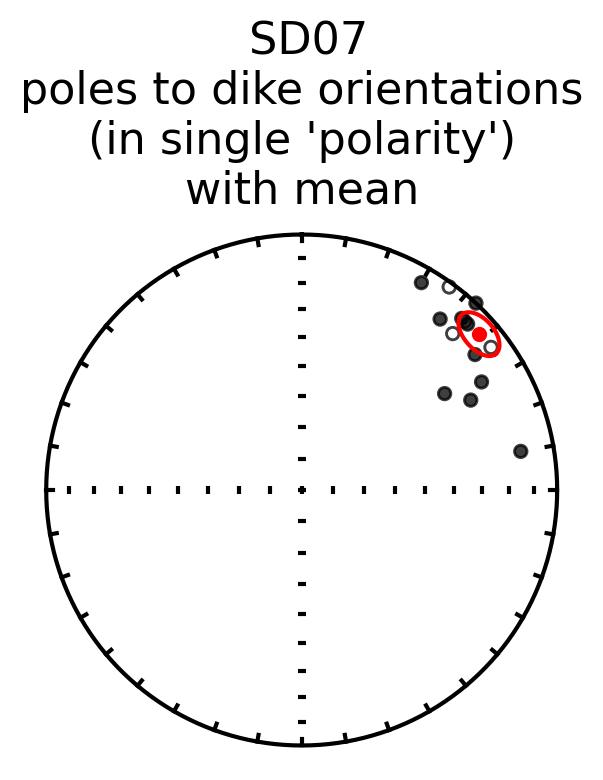

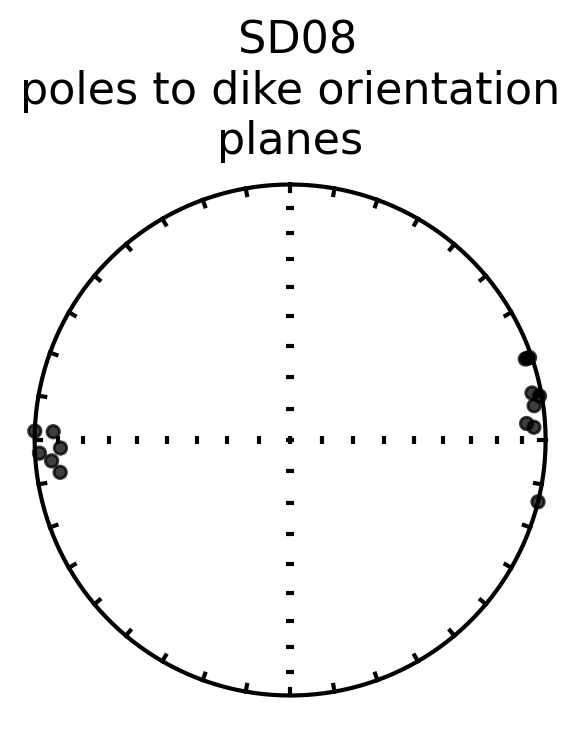

The mean dike plane pole is:
Dec: 263.8  Inc: 0.7
Number of directions in mean (n): 30
Angular radius of 95% confidence (a_95): 3.4
Precision parameter (k) estimate: 60.2


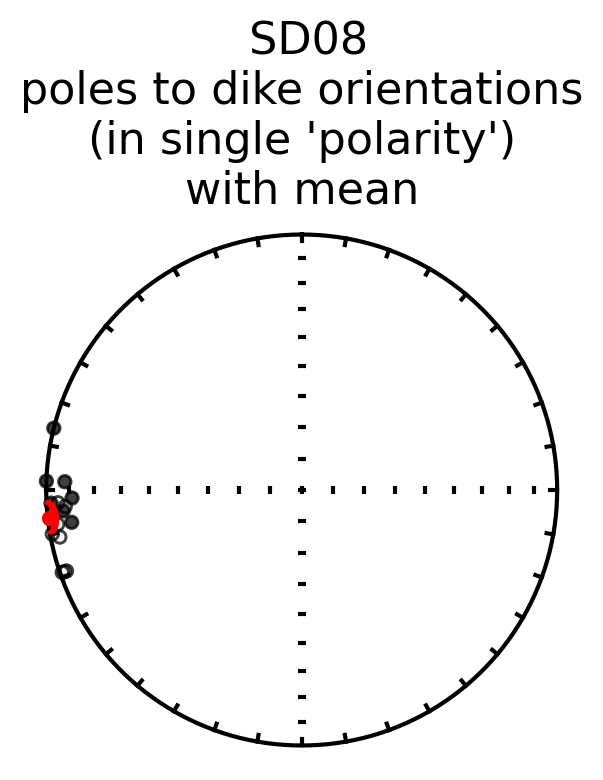

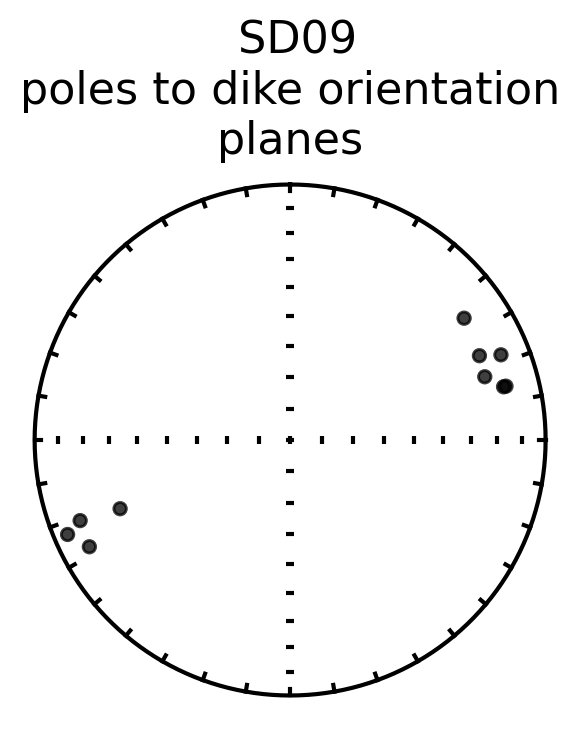

The mean dike plane pole is:
Dec: 67.9  Inc: 4.2
Number of directions in mean (n): 20
Angular radius of 95% confidence (a_95): 7.4
Precision parameter (k) estimate: 20.4


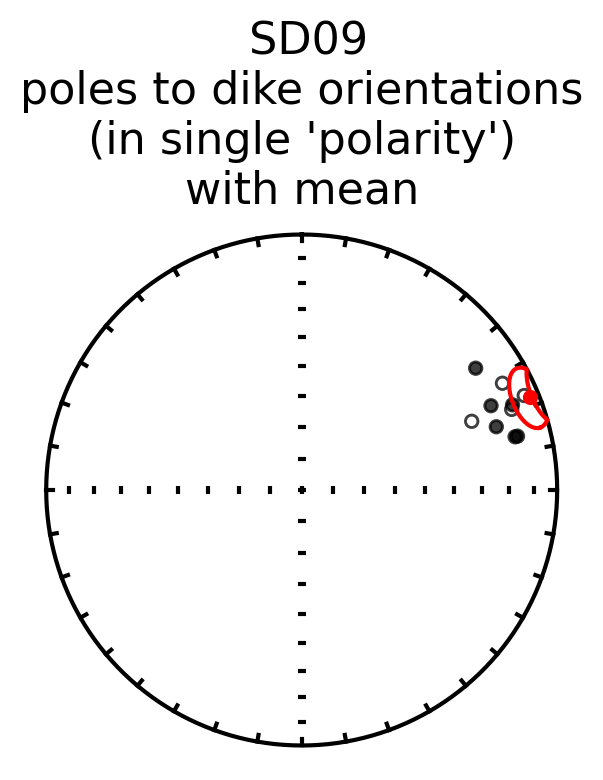

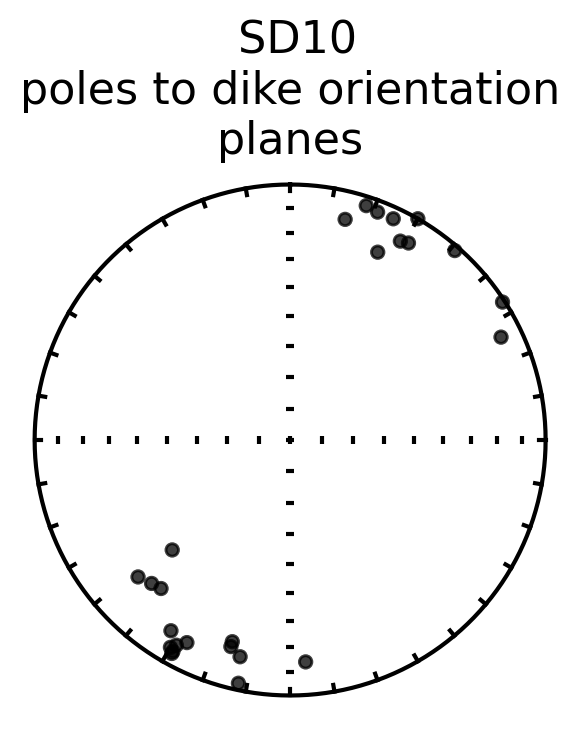

The mean dike plane pole is:
Dec: 209.2  Inc: 5.7
Number of directions in mean (n): 52
Angular radius of 95% confidence (a_95): 4.9
Precision parameter (k) estimate: 16.9


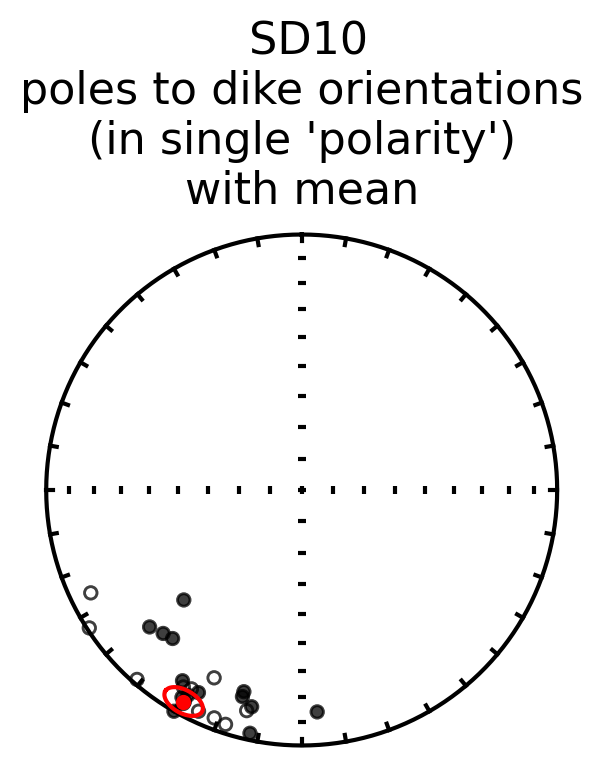

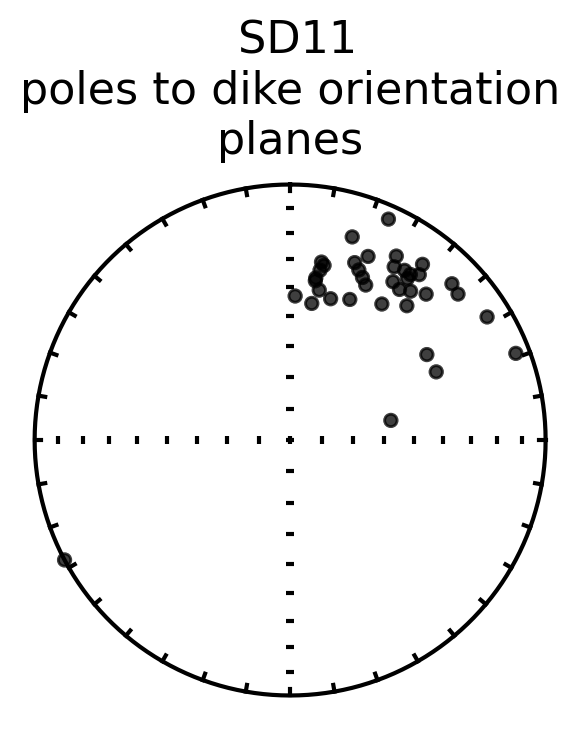

The mean dike plane pole is:
Dec: 32.3  Inc: 28.2
Number of directions in mean (n): 76
Angular radius of 95% confidence (a_95): 4.1
Precision parameter (k) estimate: 16.8


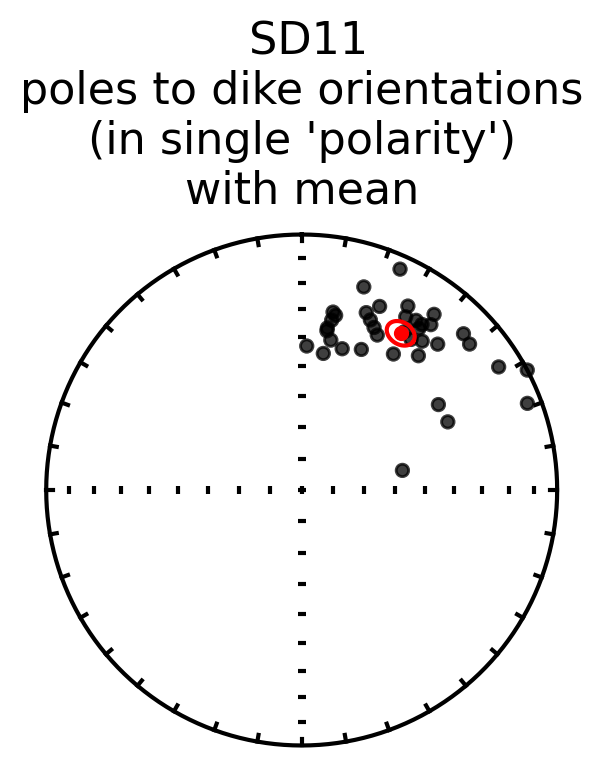

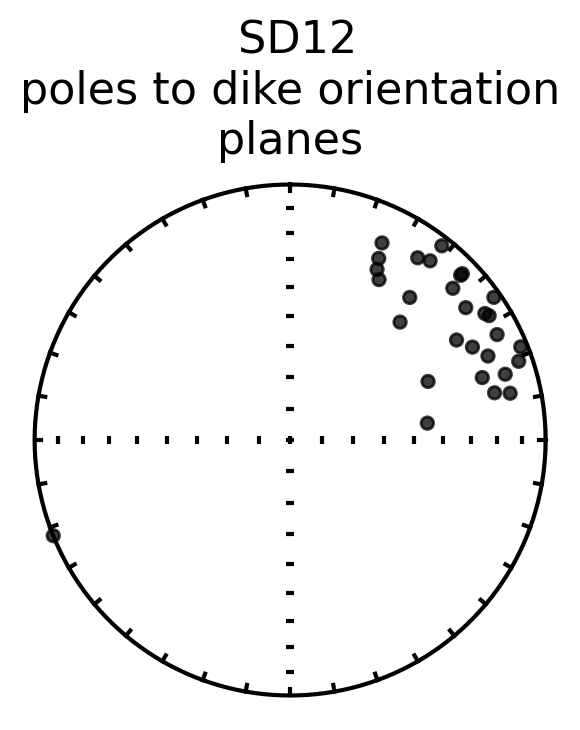

The mean dike plane pole is:
Dec: 54.2  Inc: 17.5
Number of directions in mean (n): 58
Angular radius of 95% confidence (a_95): 4.6
Precision parameter (k) estimate: 17.5


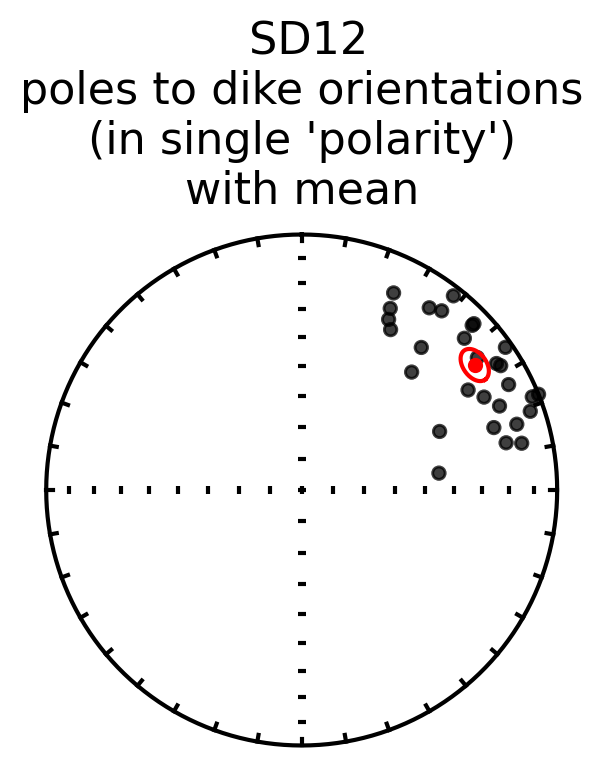

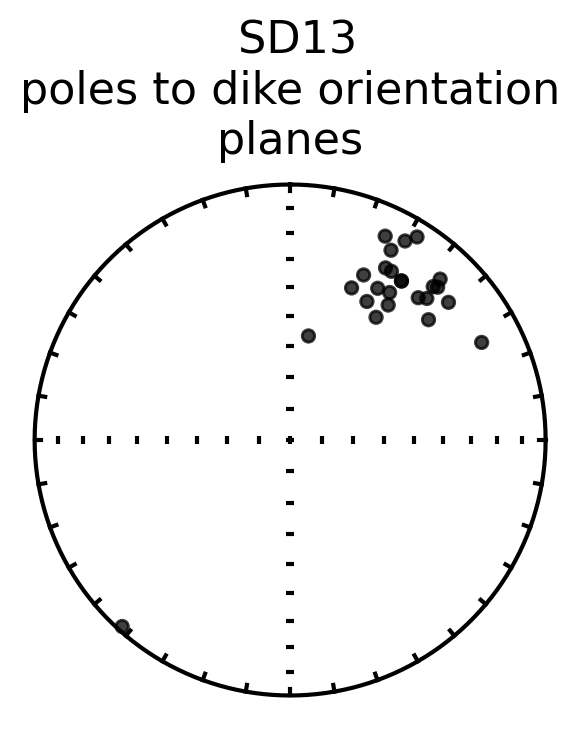

The mean dike plane pole is:
Dec: 35.9  Inc: 24.7
Number of directions in mean (n): 50
Angular radius of 95% confidence (a_95): 3.8
Precision parameter (k) estimate: 29.2


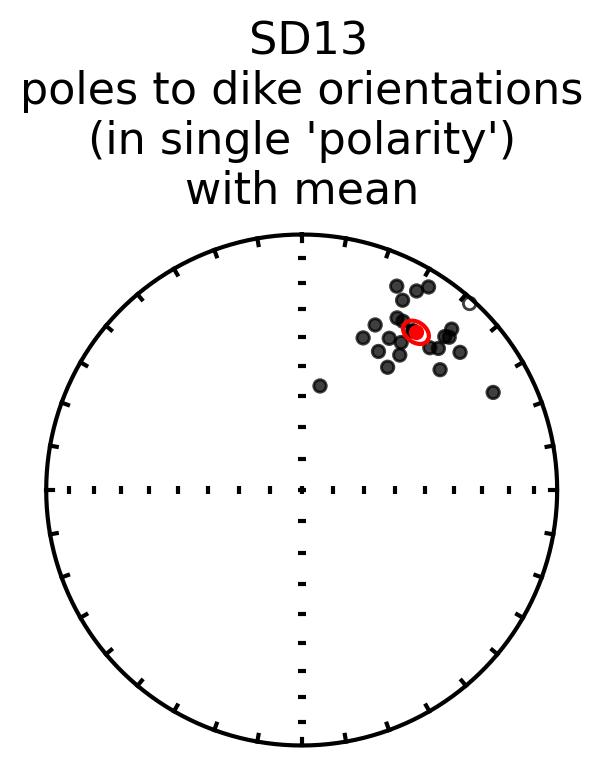

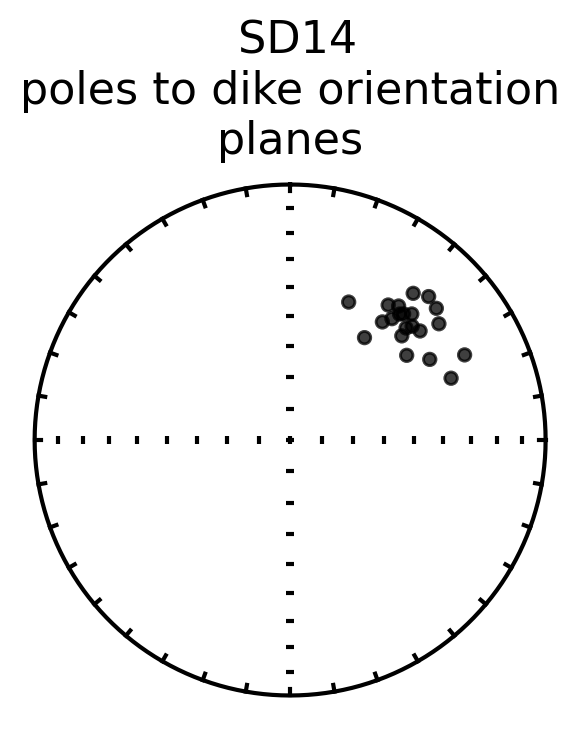

The mean dike plane pole is:
Dec: 46.0  Inc: 34.8
Number of directions in mean (n): 42
Angular radius of 95% confidence (a_95): 2.9
Precision parameter (k) estimate: 58.4


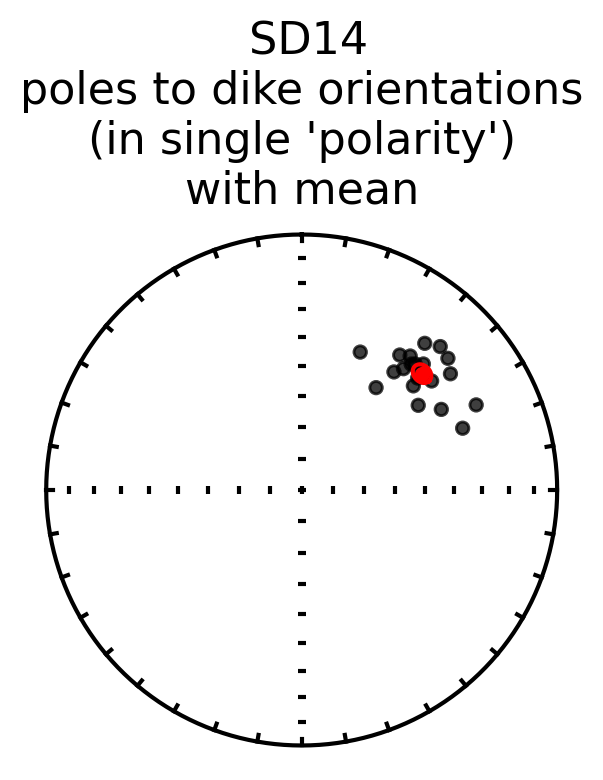

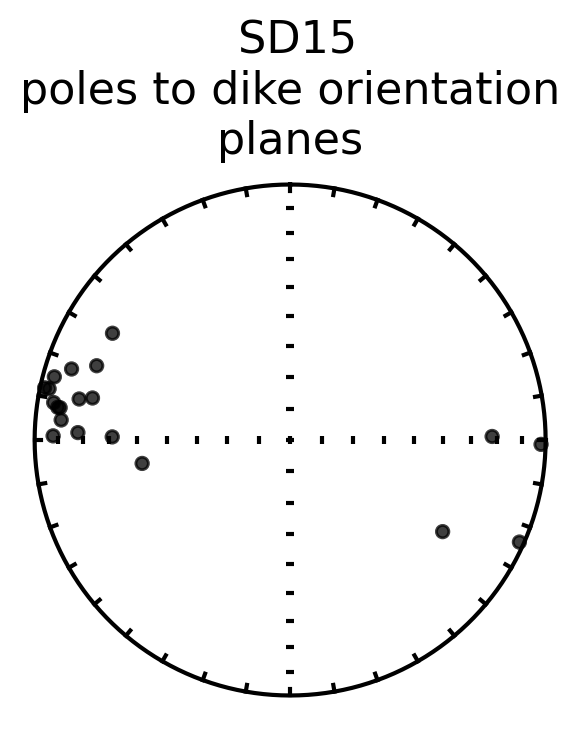

The mean dike plane pole is:
Dec: 280.7  Inc: 9.2
Number of directions in mean (n): 40
Angular radius of 95% confidence (a_95): 5.3
Precision parameter (k) estimate: 19.1


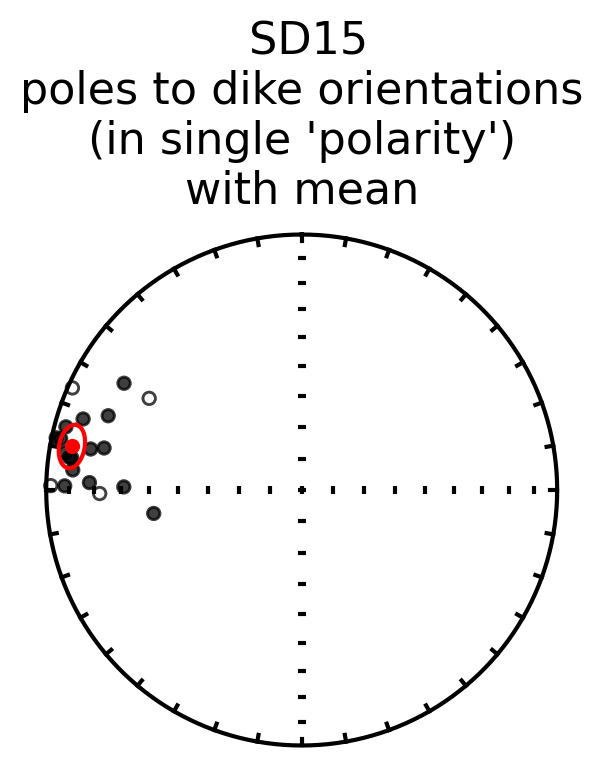

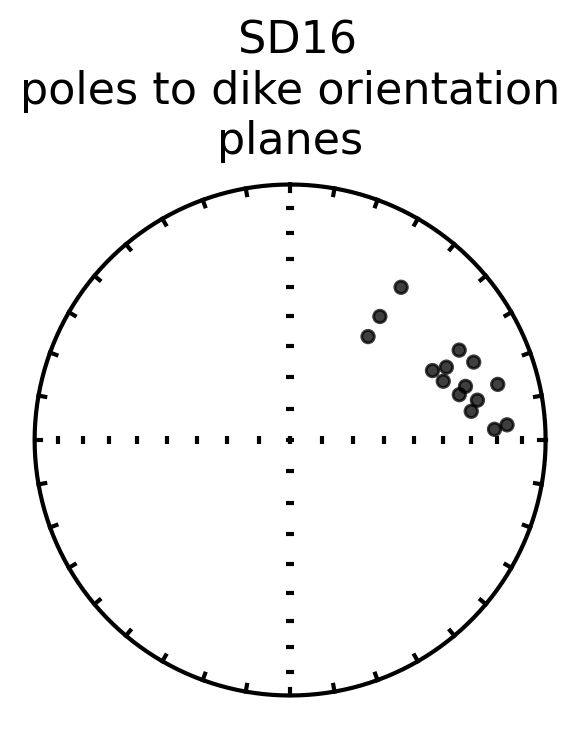

The mean dike plane pole is:
Dec: 67.2  Inc: 30.4
Number of directions in mean (n): 30
Angular radius of 95% confidence (a_95): 5.5
Precision parameter (k) estimate: 24.2


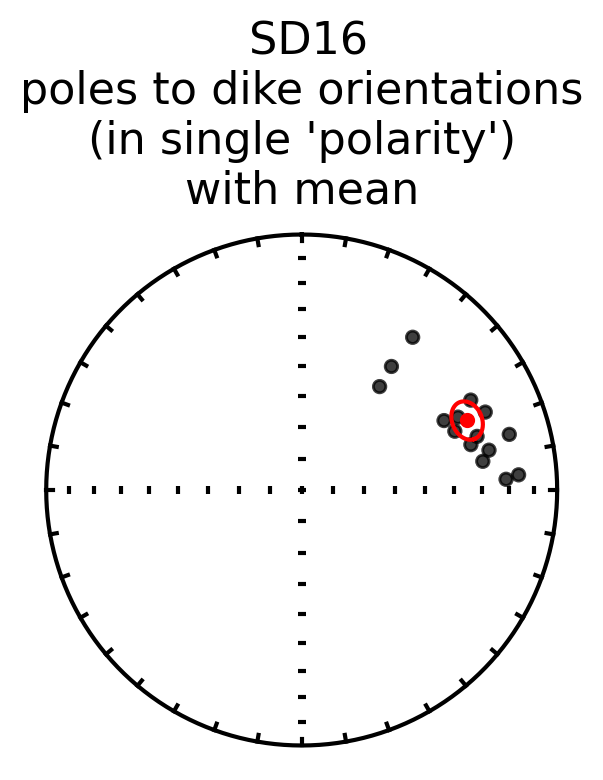

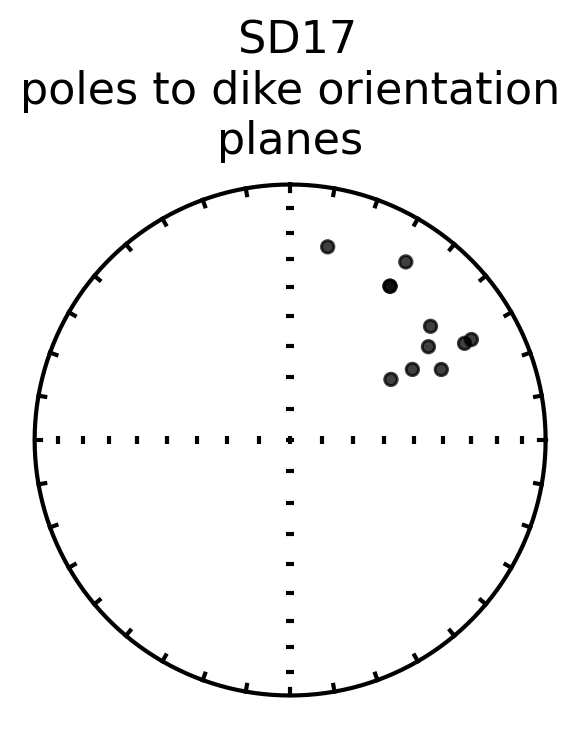

The mean dike plane pole is:
Dec: 46.9  Inc: 31.9
Number of directions in mean (n): 22
Angular radius of 95% confidence (a_95): 6.9
Precision parameter (k) estimate: 21.2


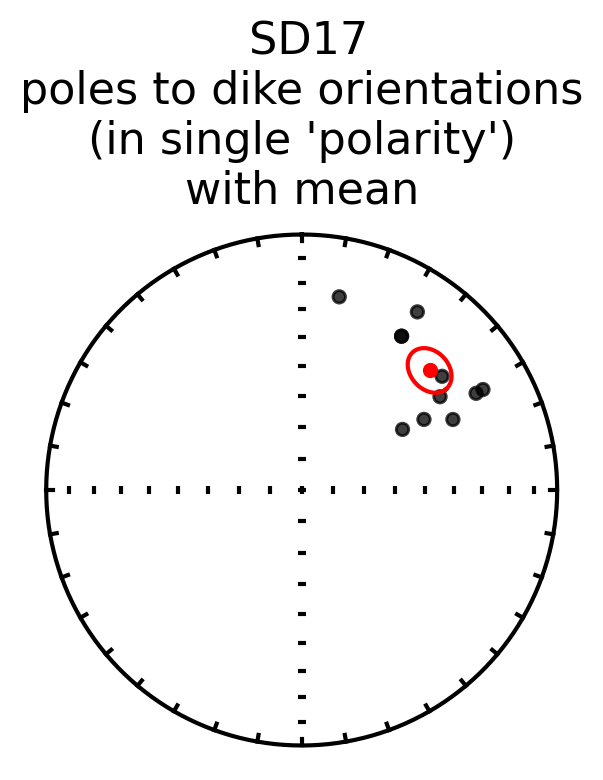

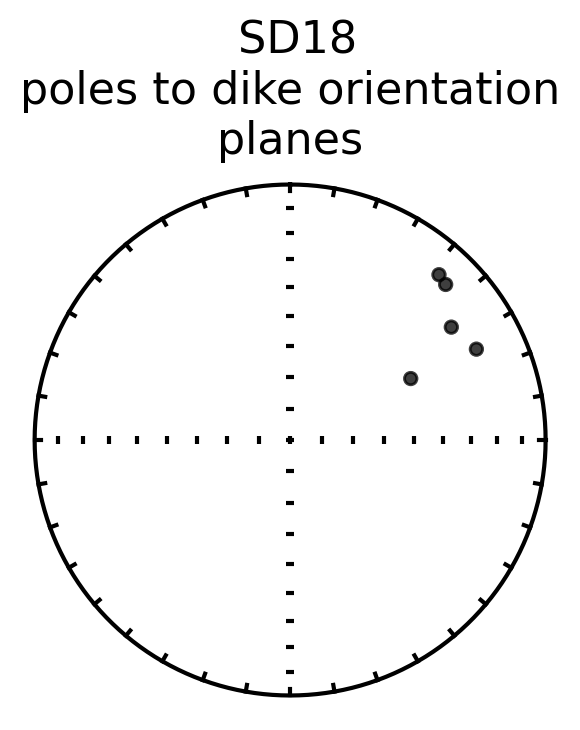

The mean dike plane pole is:
Dec: 53.2  Inc: 24.0
Number of directions in mean (n): 10
Angular radius of 95% confidence (a_95): 9.1
Precision parameter (k) estimate: 29.3


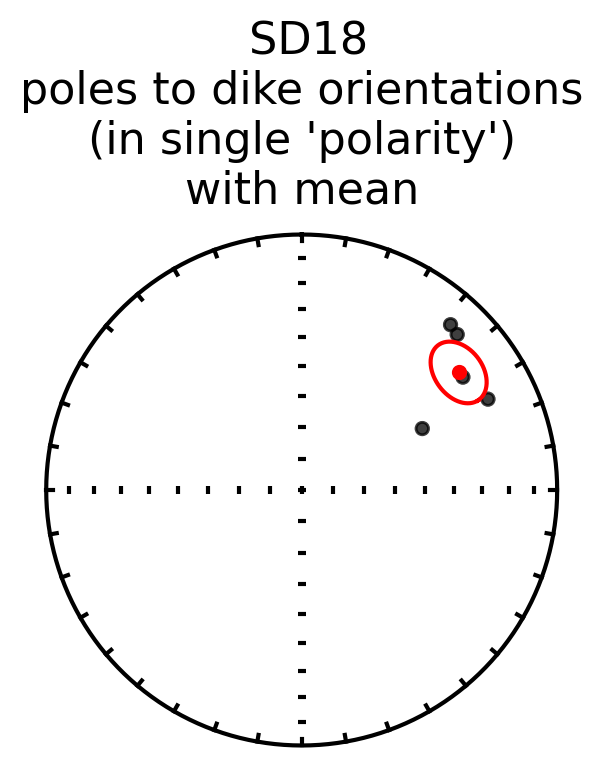

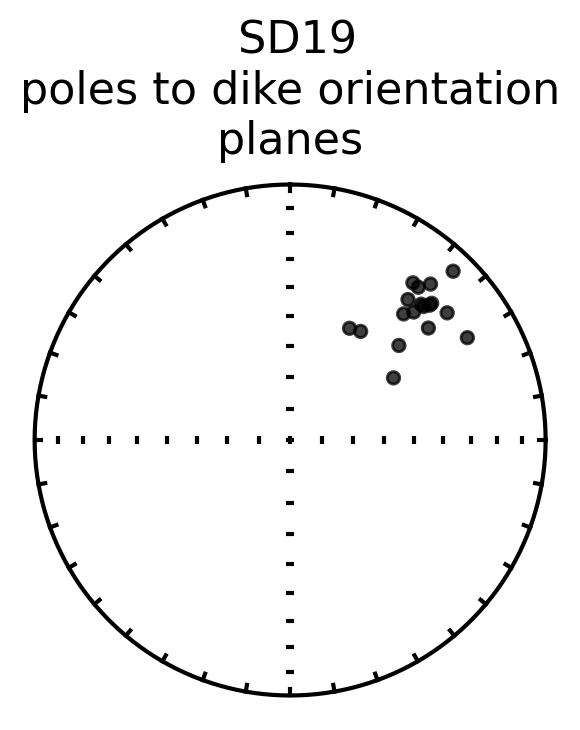

The mean dike plane pole is:
Dec: 44.7  Inc: 29.9
Number of directions in mean (n): 36
Angular radius of 95% confidence (a_95): 3.8
Precision parameter (k) estimate: 40.0


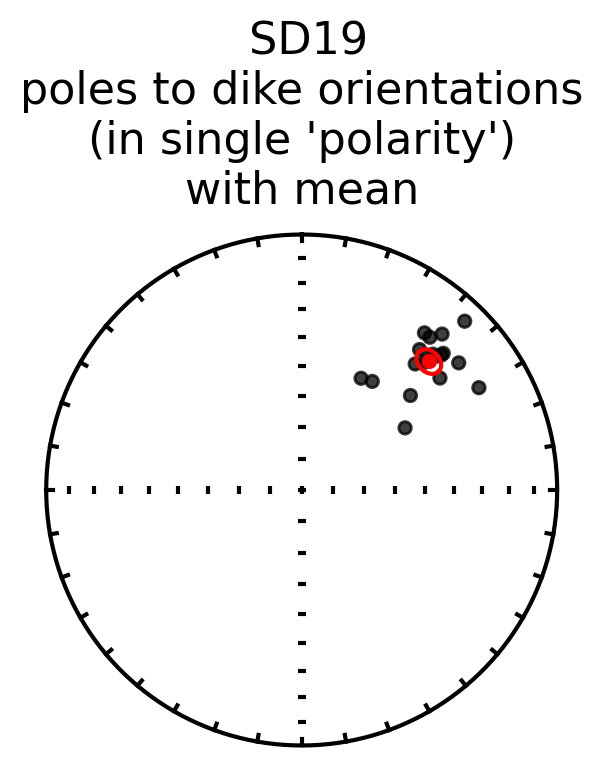

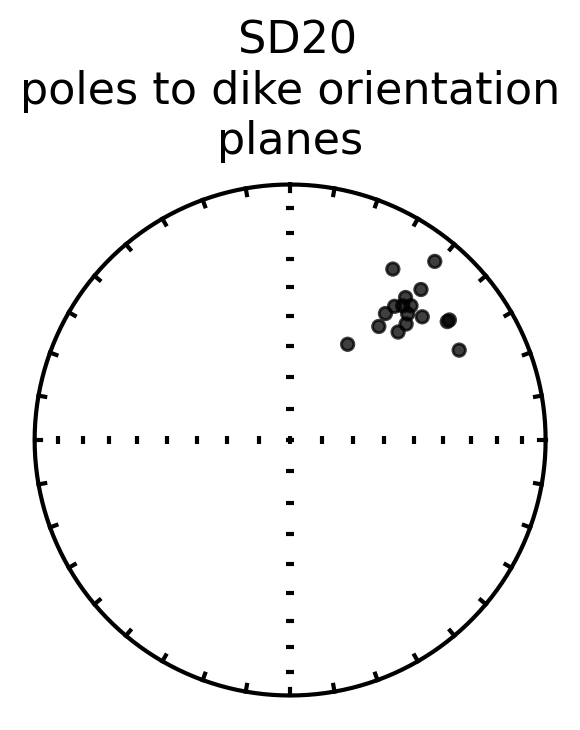

The mean dike plane pole is:
Dec: 42.9  Inc: 31.3
Number of directions in mean (n): 34
Angular radius of 95% confidence (a_95): 3.6
Precision parameter (k) estimate: 48.6


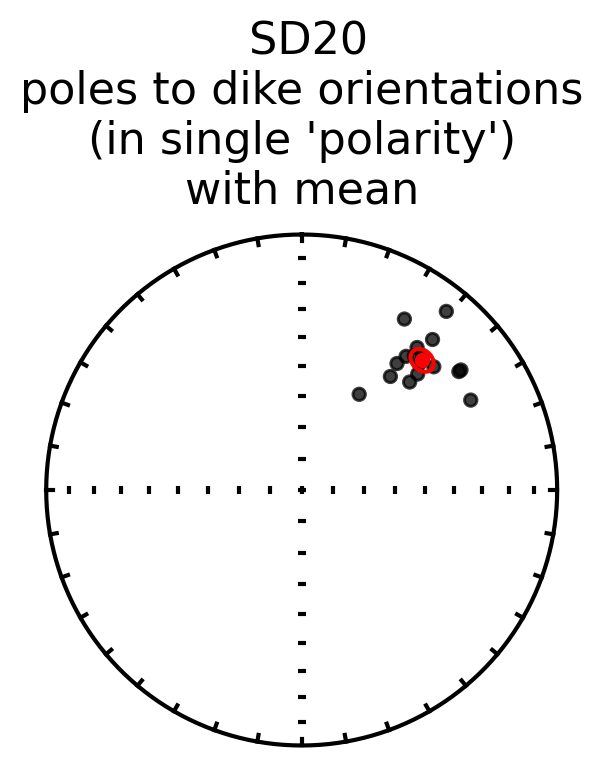

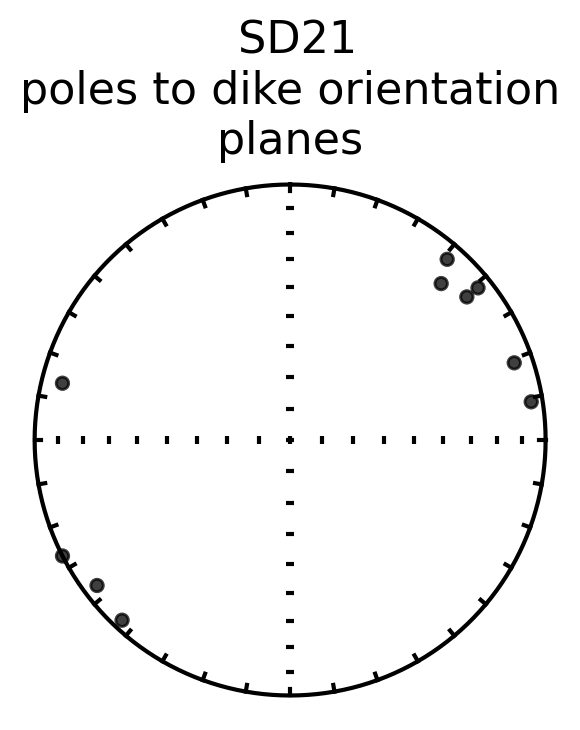

The mean dike plane pole is:
Dec: 59.8  Inc: 3.7
Number of directions in mean (n): 20
Angular radius of 95% confidence (a_95): 8.6
Precision parameter (k) estimate: 15.4


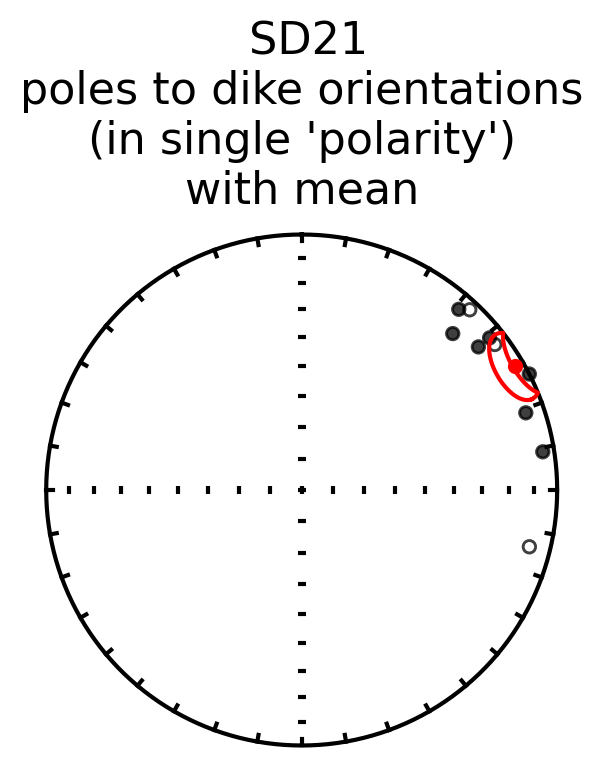

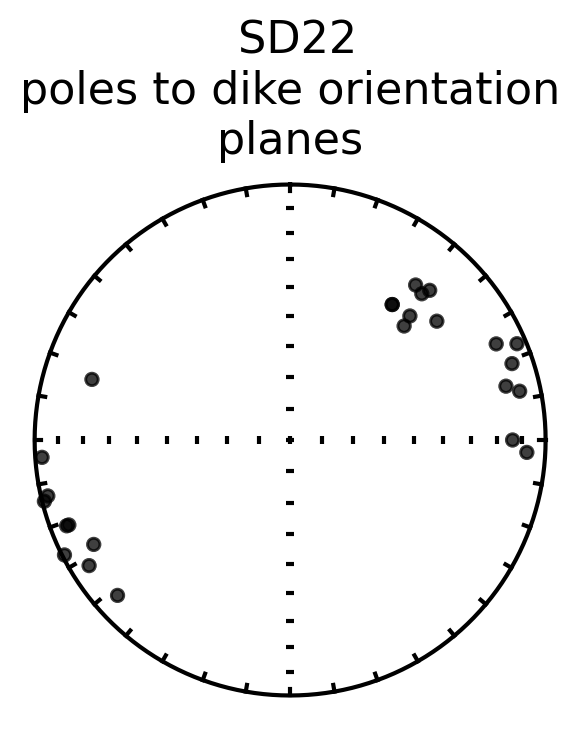

The mean dike plane pole is:
Dec: 64.4  Inc: 9.6
Number of directions in mean (n): 50
Angular radius of 95% confidence (a_95): 6.3
Precision parameter (k) estimate: 11.1


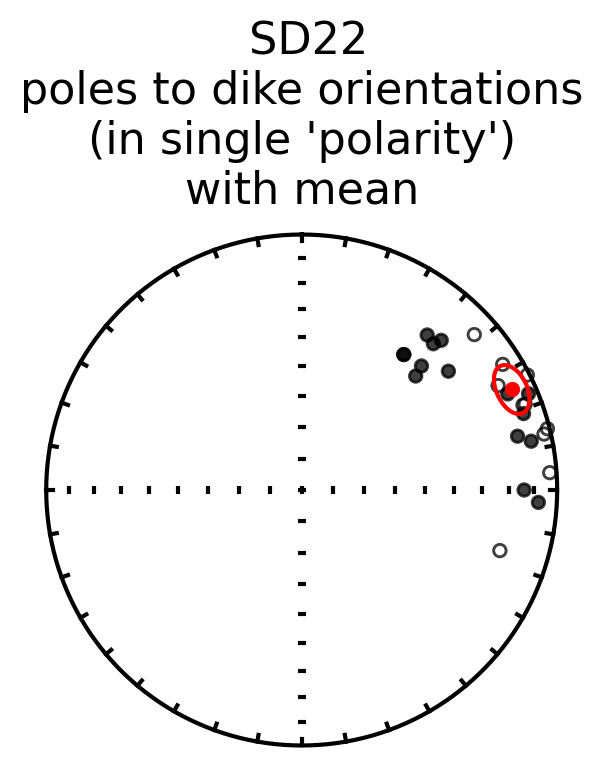

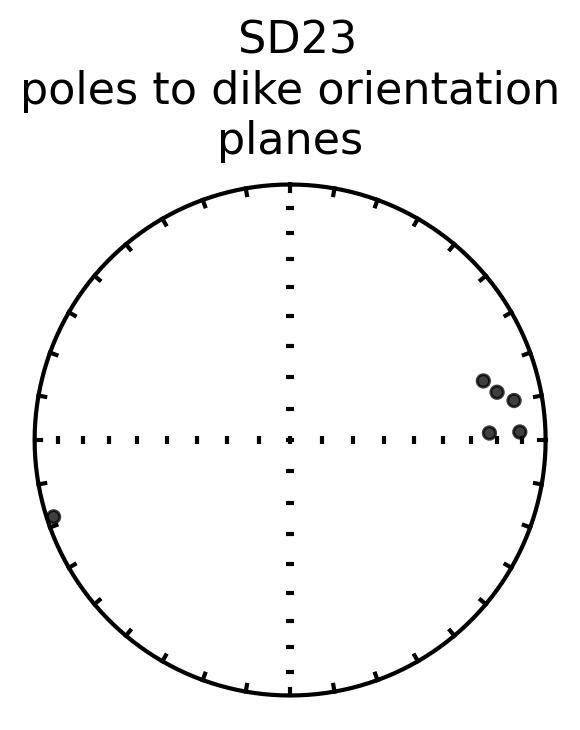

The mean dike plane pole is:
Dec: 79.6  Inc: 13.9
Number of directions in mean (n): 12
Angular radius of 95% confidence (a_95): 6.1
Precision parameter (k) estimate: 52.2


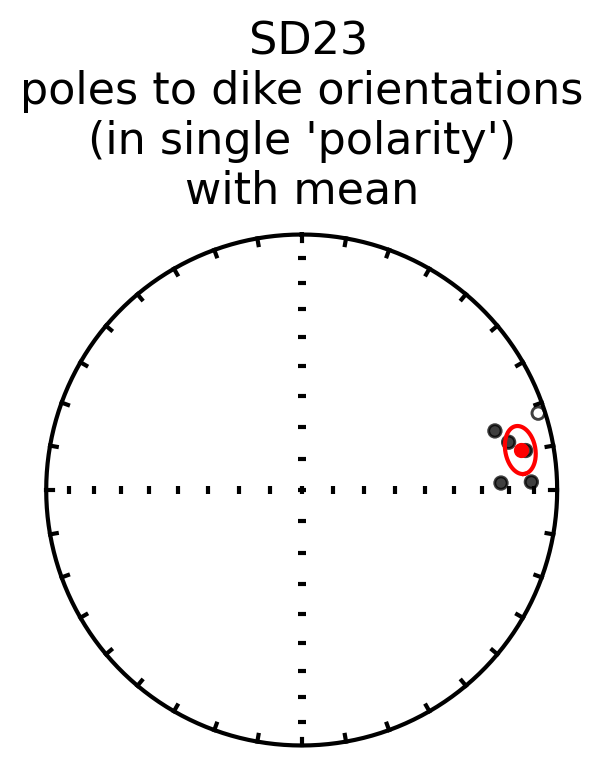

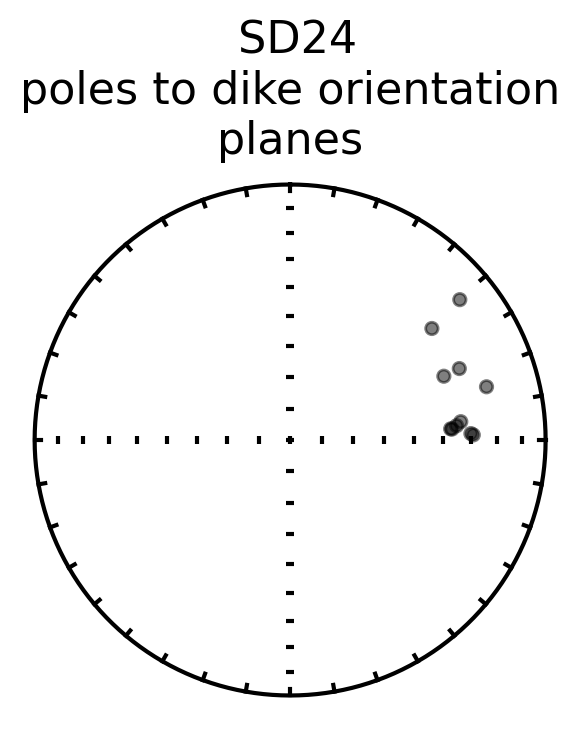

The mean dike plane pole is:
Dec: 75.0  Inc: 30.9
Number of directions in mean (n): 11
Angular radius of 95% confidence (a_95): 8.1
Precision parameter (k) estimate: 33.0


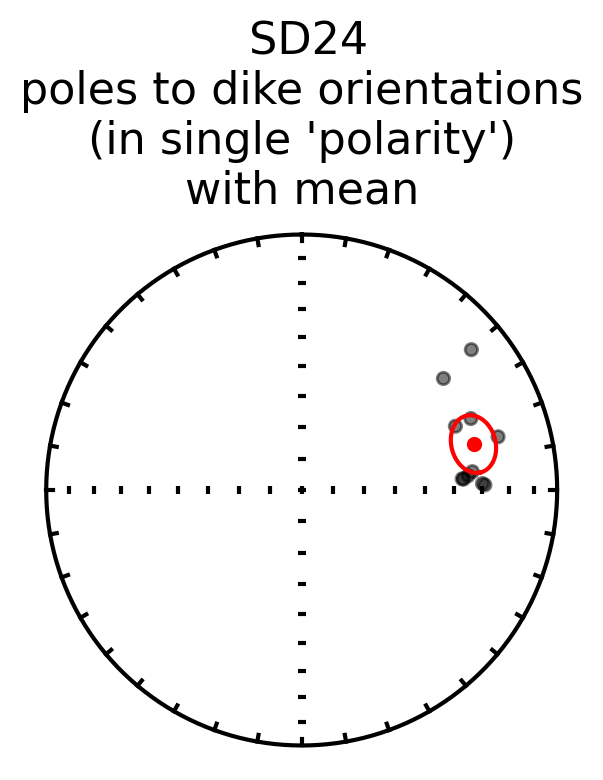

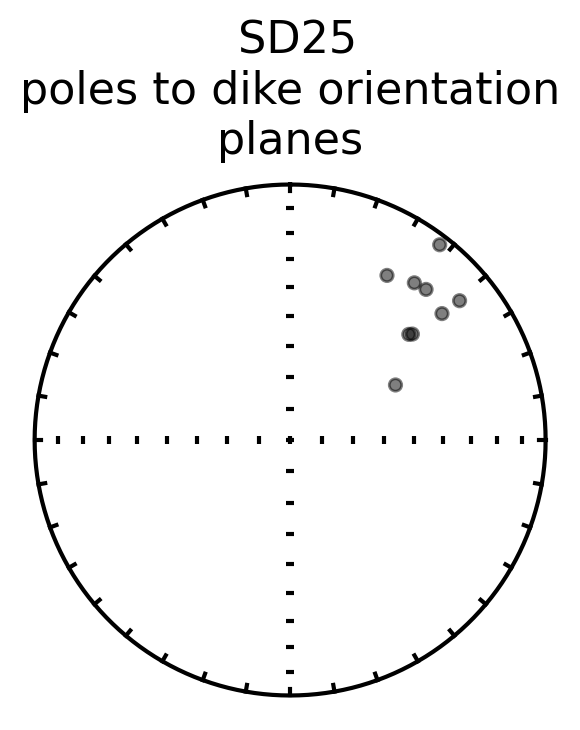

The mean dike plane pole is:
Dec: 44.7  Inc: 26.9
Number of directions in mean (n): 9
Angular radius of 95% confidence (a_95): 10.3
Precision parameter (k) estimate: 26.1


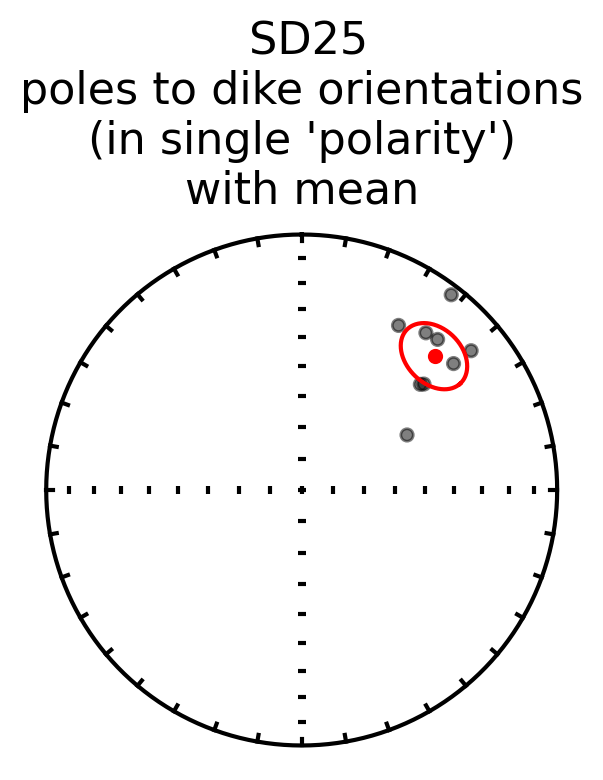

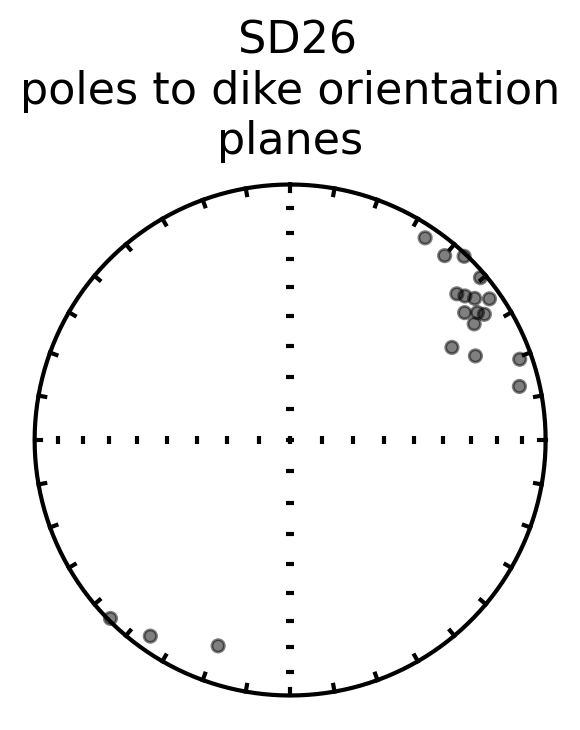

The mean dike plane pole is:
Dec: 51.1  Inc: 8.2
Number of directions in mean (n): 19
Angular radius of 95% confidence (a_95): 6.9
Precision parameter (k) estimate: 24.5


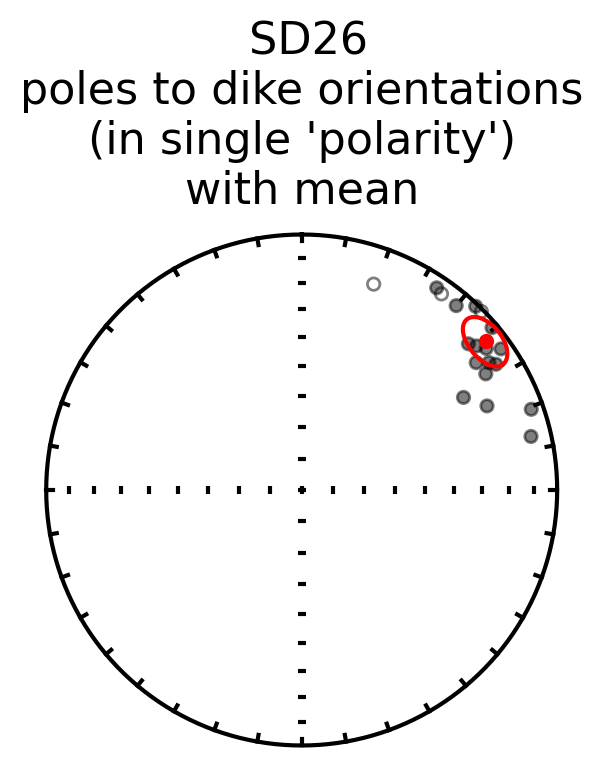

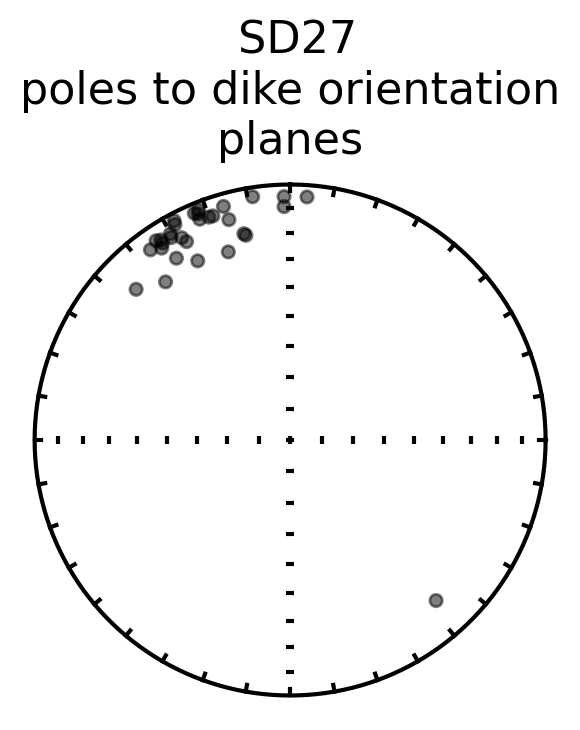

The mean dike plane pole is:
Dec: 336.2  Inc: 9.6
Number of directions in mean (n): 31
Angular radius of 95% confidence (a_95): 4.5
Precision parameter (k) estimate: 34.1


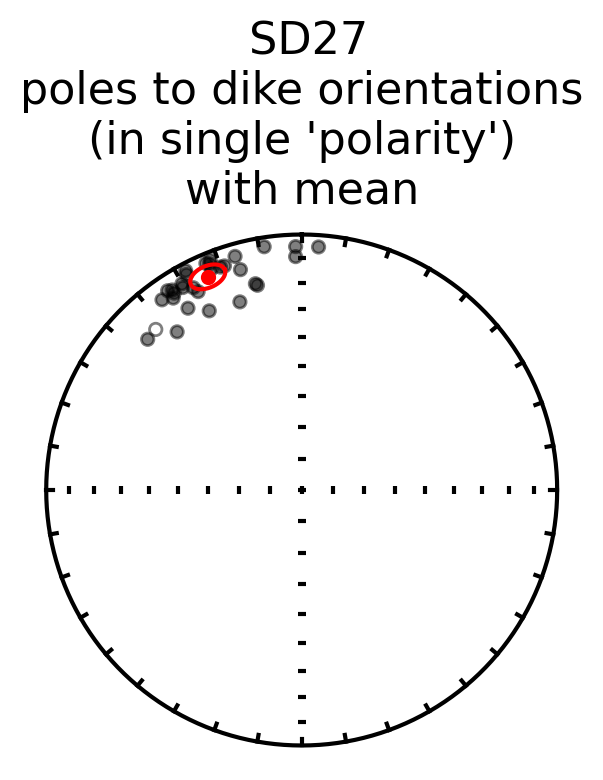

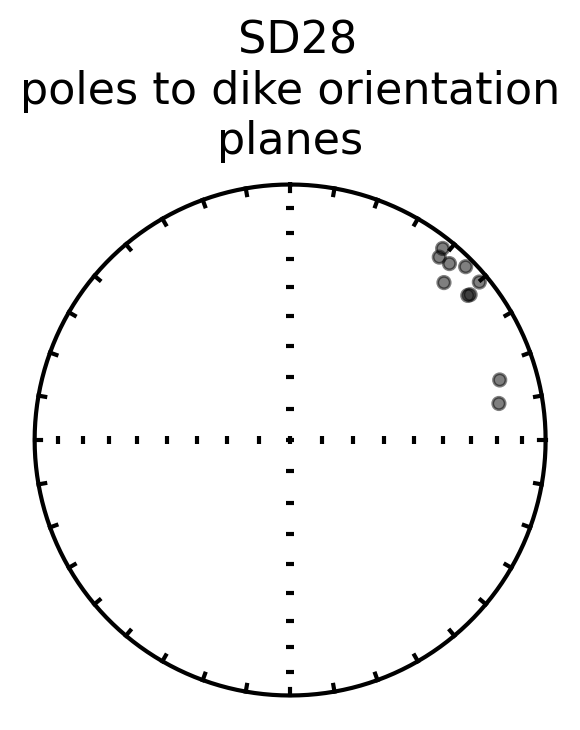

The mean dike plane pole is:
Dec: 51.2  Inc: 10.2
Number of directions in mean (n): 10
Angular radius of 95% confidence (a_95): 8.9
Precision parameter (k) estimate: 30.4


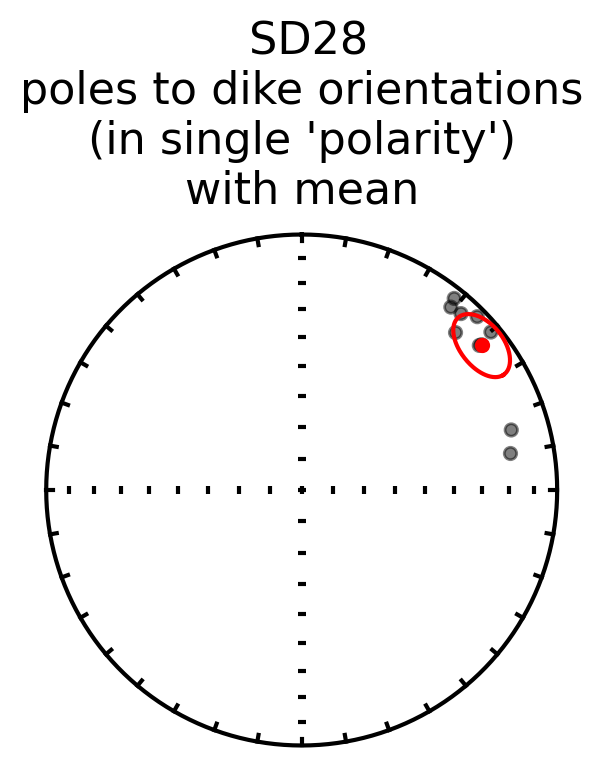

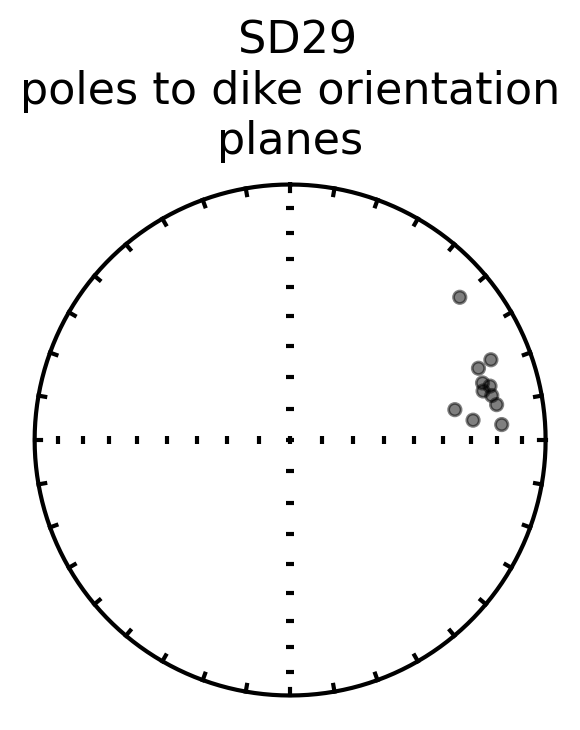

The mean dike plane pole is:
Dec: 74.3  Inc: 22.1
Number of directions in mean (n): 11
Angular radius of 95% confidence (a_95): 6.1
Precision parameter (k) estimate: 56.4


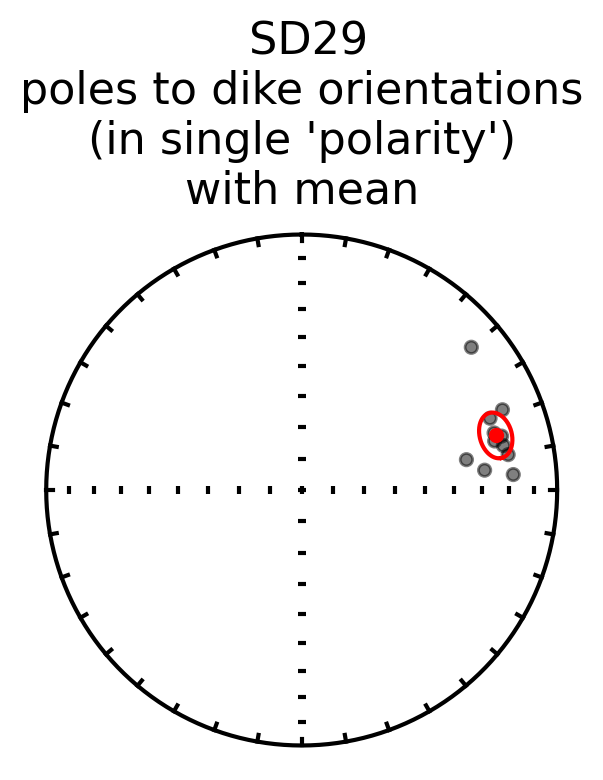

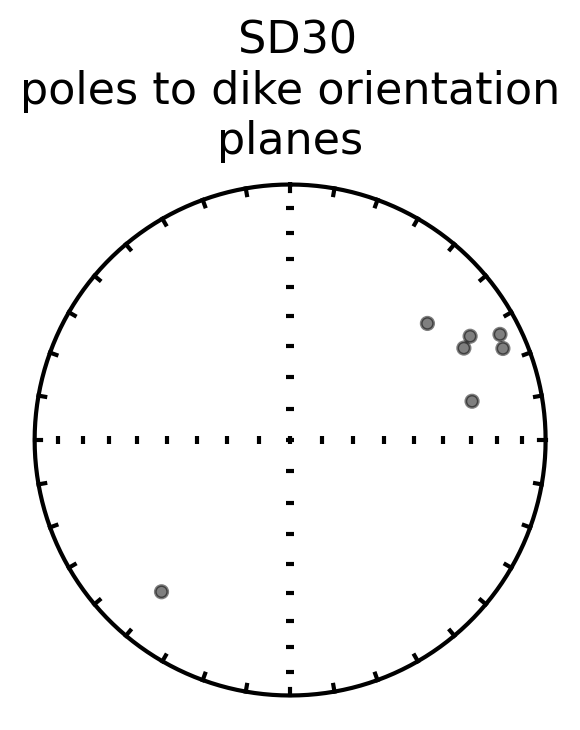

The mean dike plane pole is:
Dec: 60.1  Inc: 14.6
Number of directions in mean (n): 7
Angular radius of 95% confidence (a_95): 16.4
Precision parameter (k) estimate: 14.4


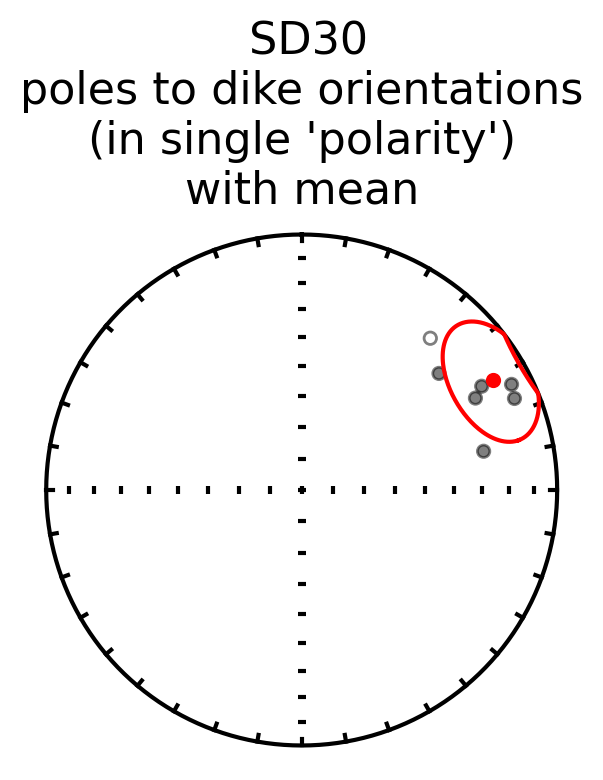

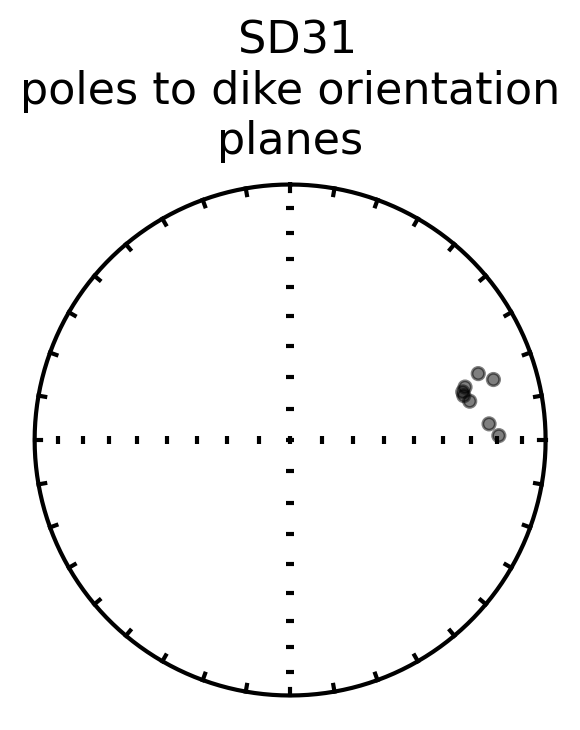

The mean dike plane pole is:
Dec: 77.5  Inc: 25.5
Number of directions in mean (n): 8
Angular radius of 95% confidence (a_95): 5.3
Precision parameter (k) estimate: 109.7


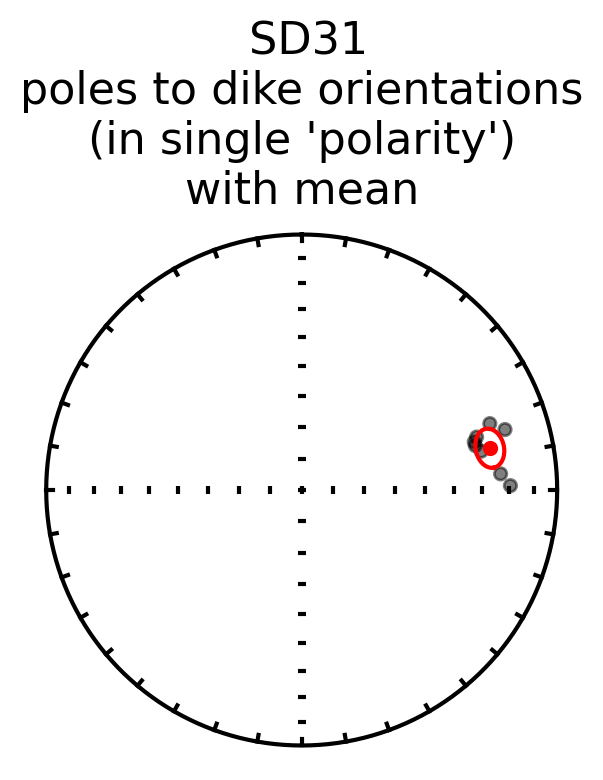

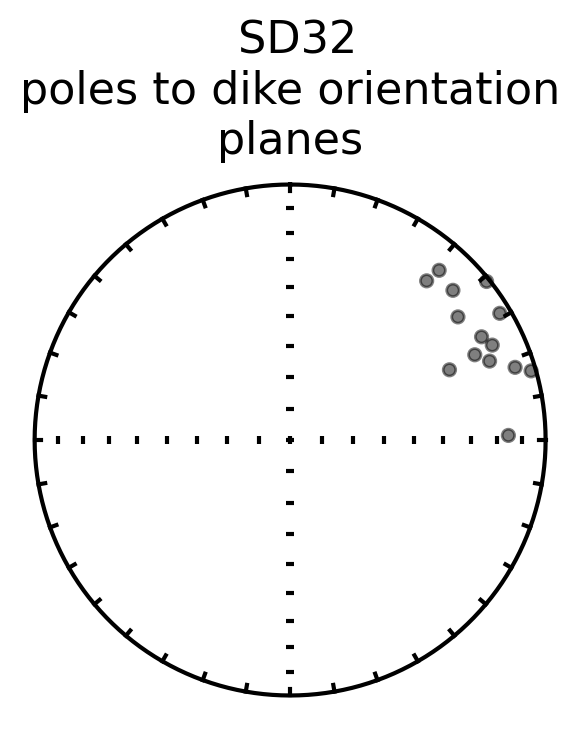

The mean dike plane pole is:
Dec: 61.0  Inc: 14.5
Number of directions in mean (n): 14
Angular radius of 95% confidence (a_95): 7.6
Precision parameter (k) estimate: 28.1


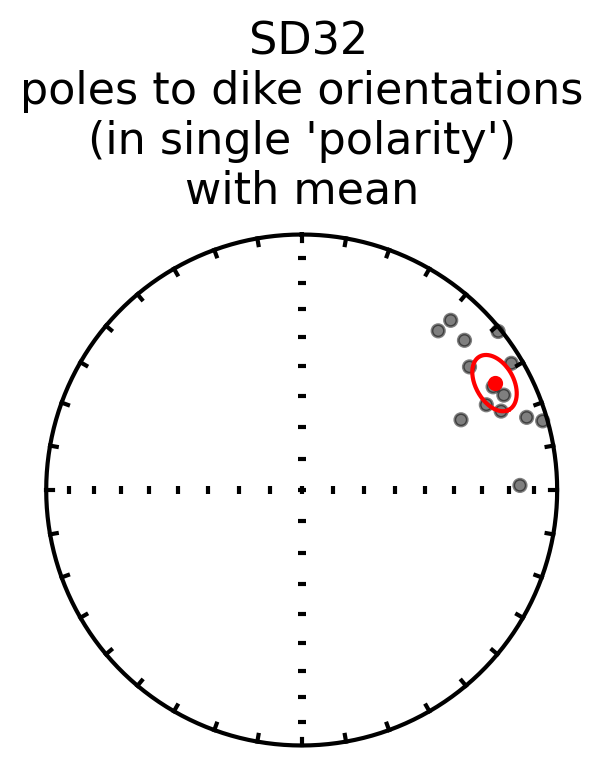

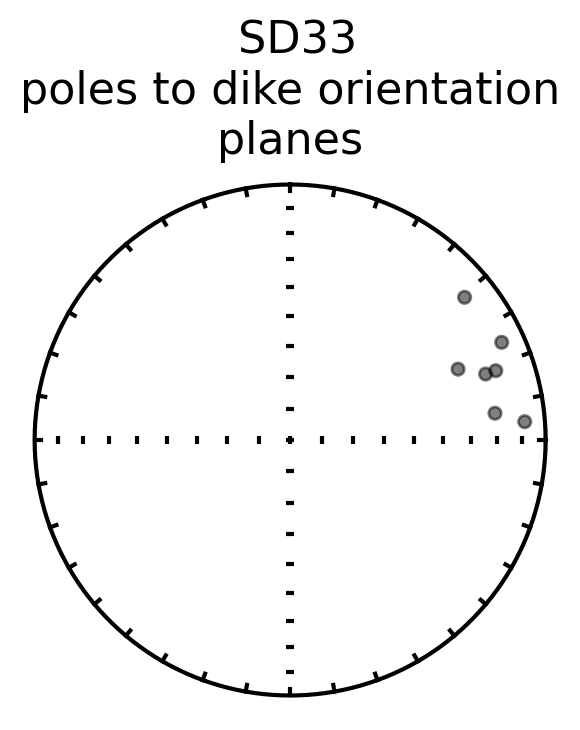

The mean dike plane pole is:
Dec: 70.6  Inc: 17.1
Number of directions in mean (n): 7
Angular radius of 95% confidence (a_95): 10.0
Precision parameter (k) estimate: 37.3


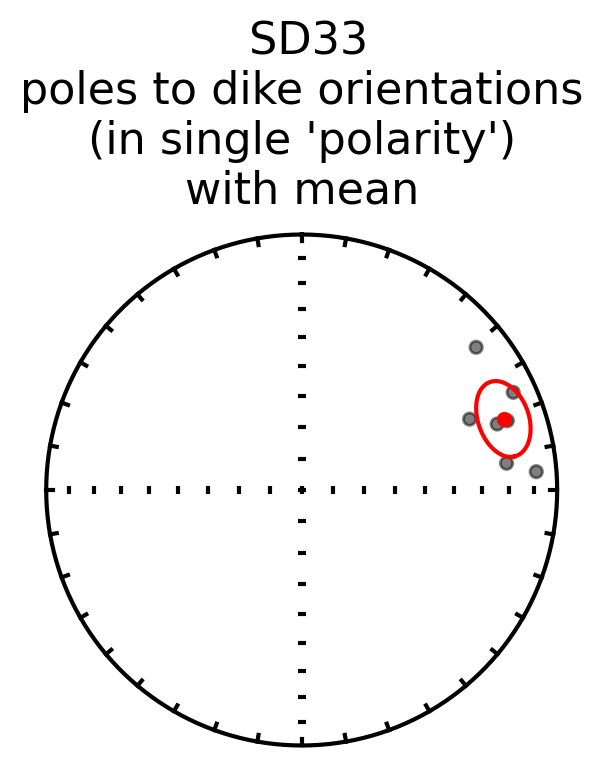

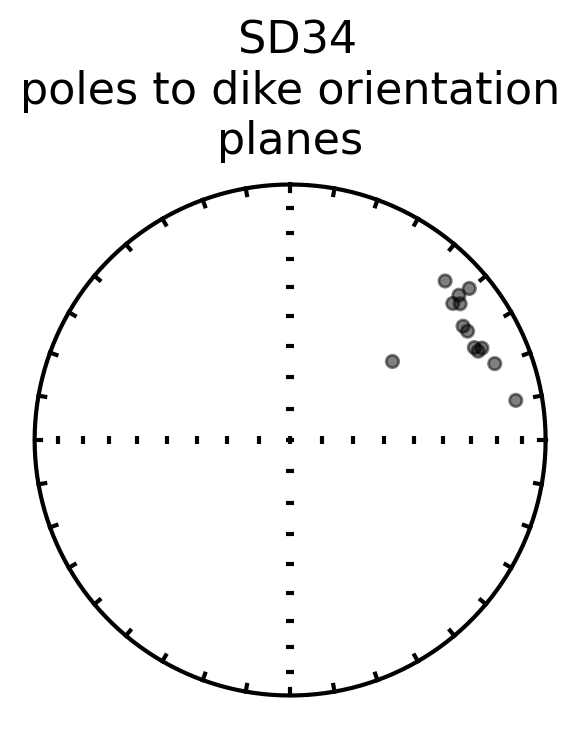

The mean dike plane pole is:
Dec: 58.1  Inc: 18.9
Number of directions in mean (n): 13
Angular radius of 95% confidence (a_95): 7.0
Precision parameter (k) estimate: 36.5


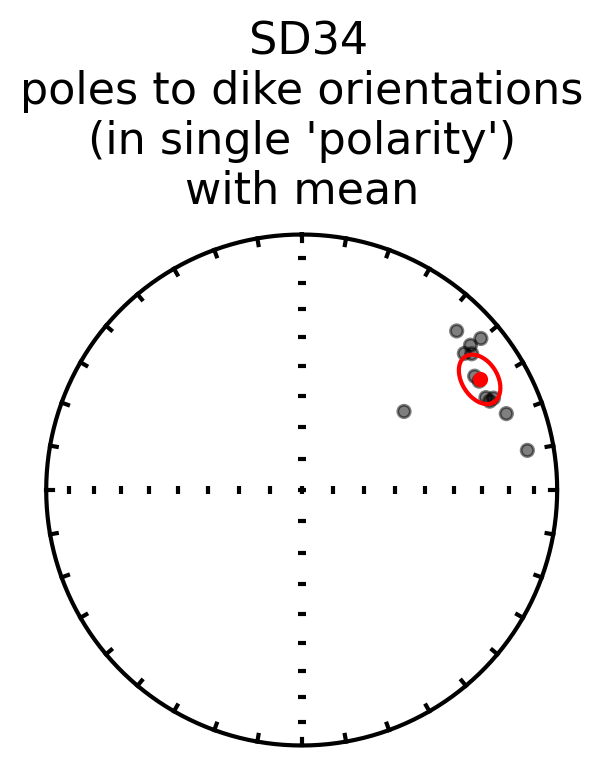

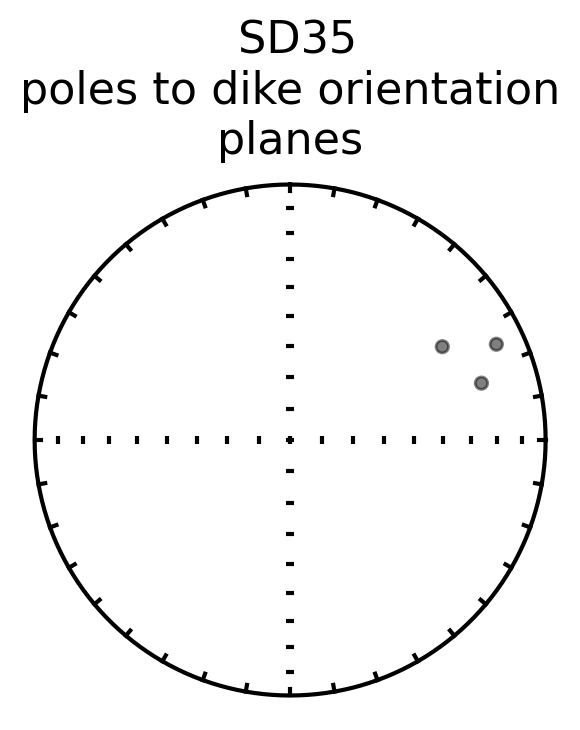

The mean dike plane pole is:
Dec: 65.8  Inc: 22.0
Number of directions in mean (n): 3
Angular radius of 95% confidence (a_95): 17.9
Precision parameter (k) estimate: 48.5


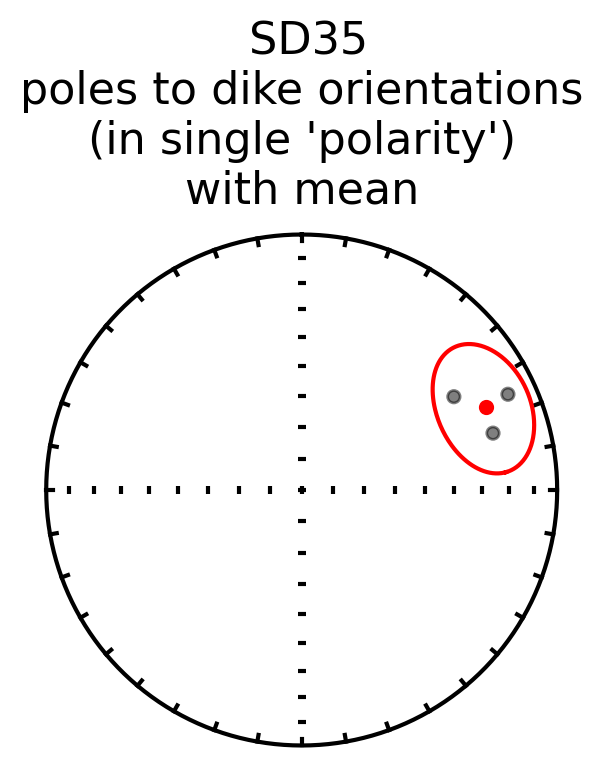

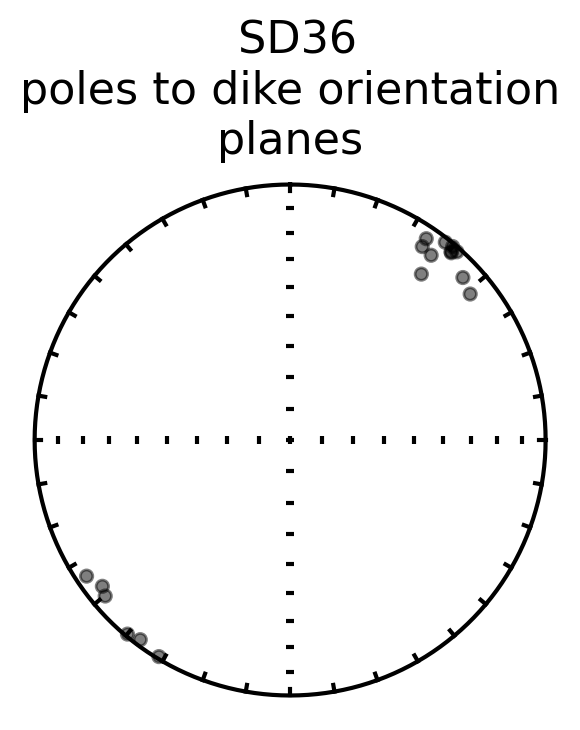

The mean dike plane pole is:
Dec: 41.7  Inc: 3.0
Number of directions in mean (n): 17
Angular radius of 95% confidence (a_95): 4.3
Precision parameter (k) estimate: 69.8


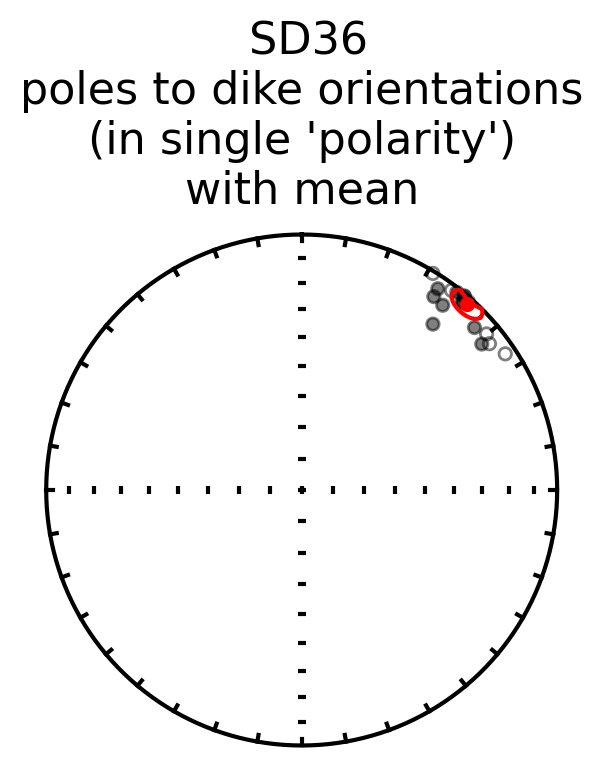

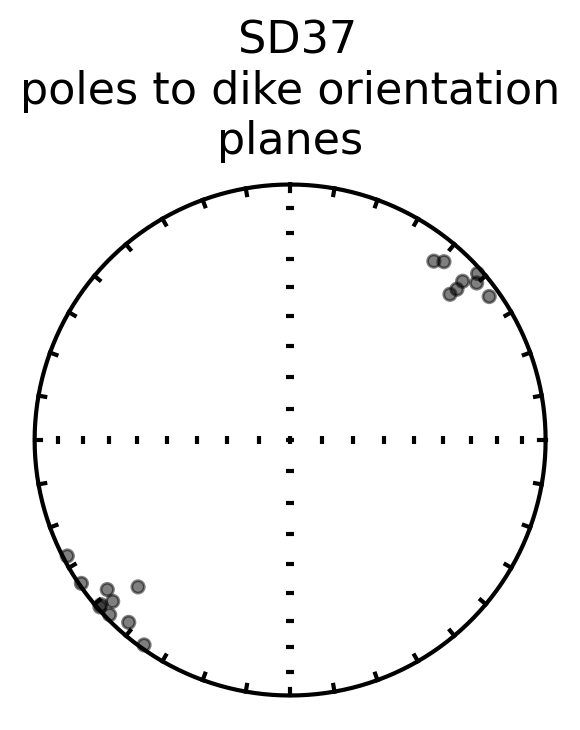

The mean dike plane pole is:
Dec: 47.7  Inc: 1.2
Number of directions in mean (n): 18
Angular radius of 95% confidence (a_95): 4.5
Precision parameter (k) estimate: 58.9


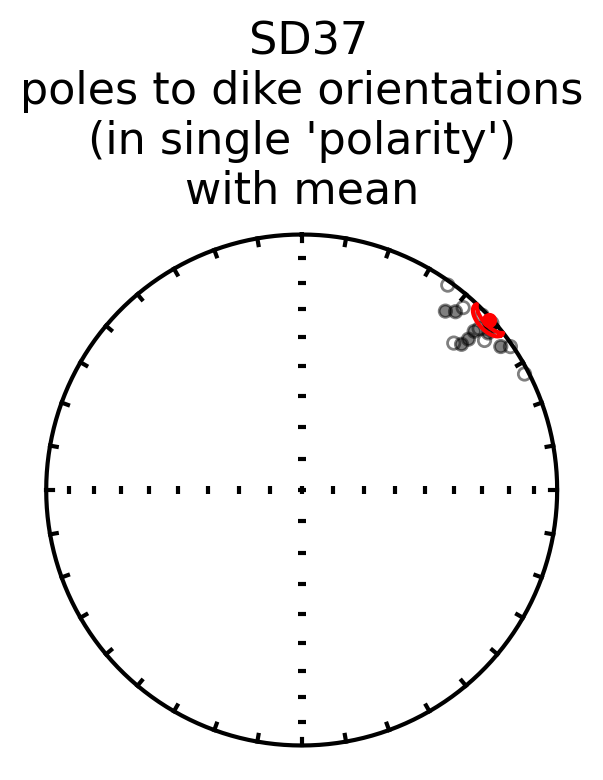

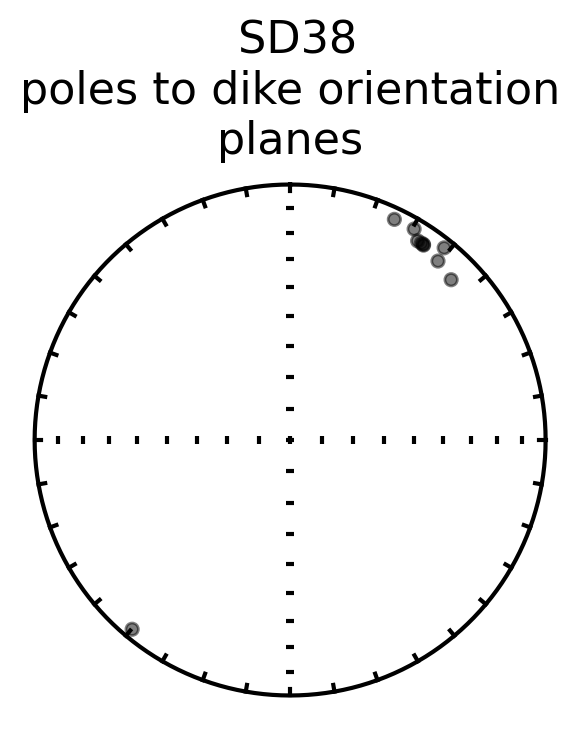

The mean dike plane pole is:
Dec: 35.4  Inc: 6.5
Number of directions in mean (n): 10
Angular radius of 95% confidence (a_95): 4.2
Precision parameter (k) estimate: 130.4


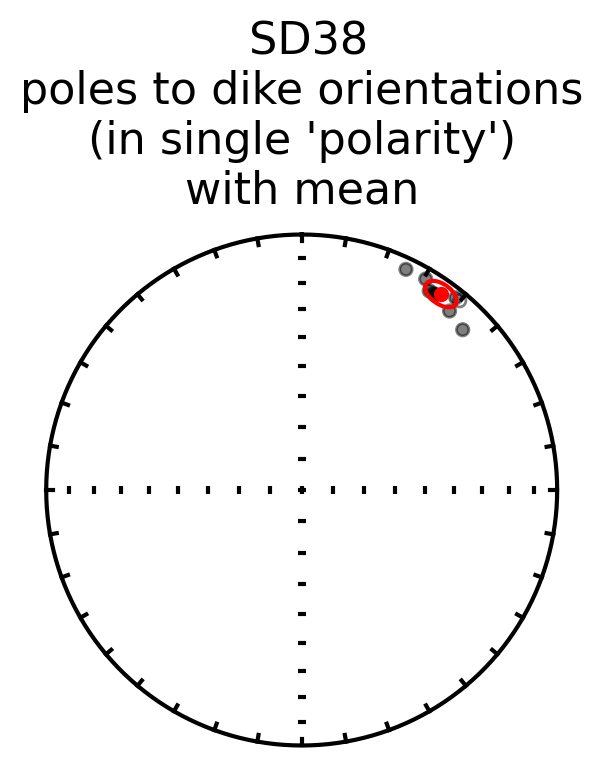

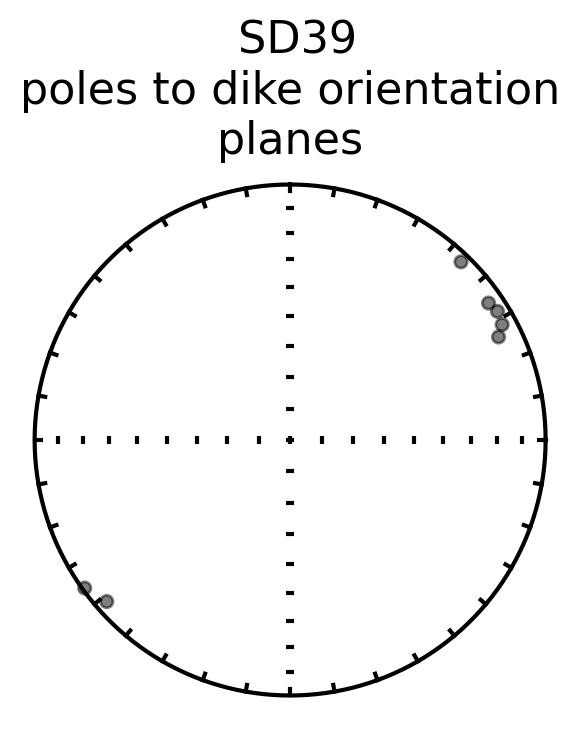

The mean dike plane pole is:
Dec: 55.0  Inc: 3.6
Number of directions in mean (n): 7
Angular radius of 95% confidence (a_95): 6.4
Precision parameter (k) estimate: 89.7


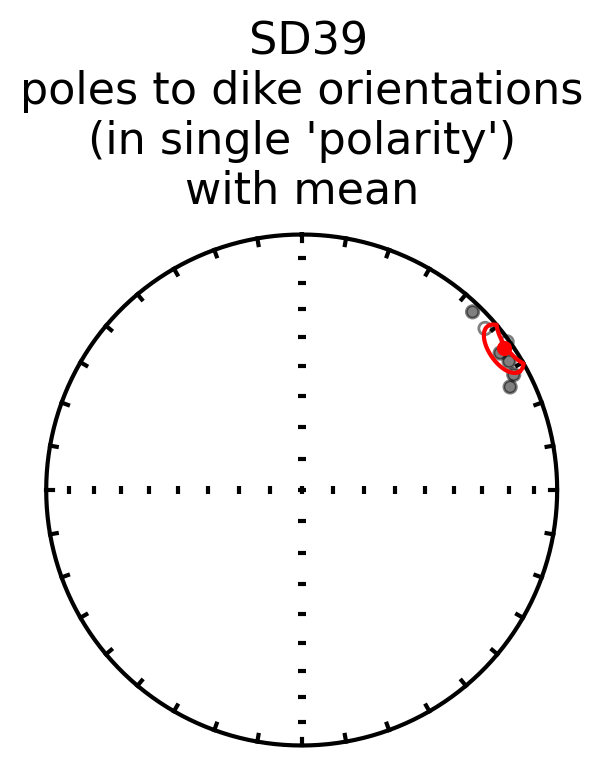

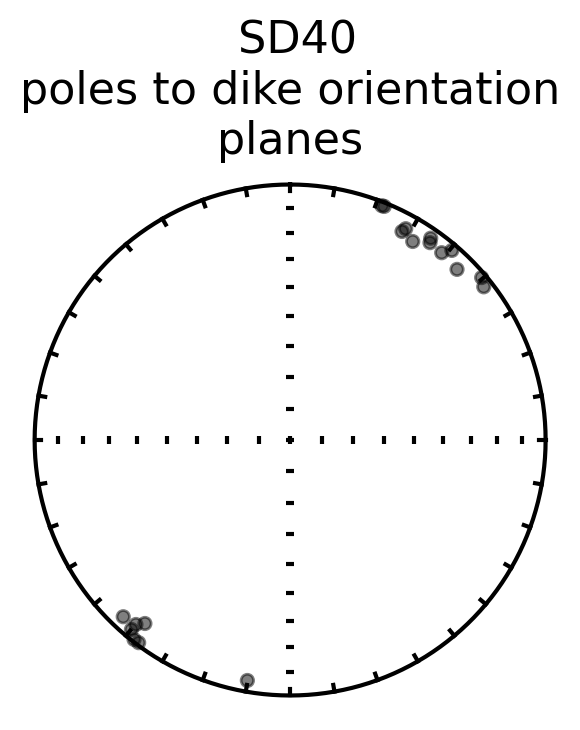

The mean dike plane pole is:
Dec: 35.5  Inc: 1.5
Number of directions in mean (n): 19
Angular radius of 95% confidence (a_95): 4.8
Precision parameter (k) estimate: 50.3


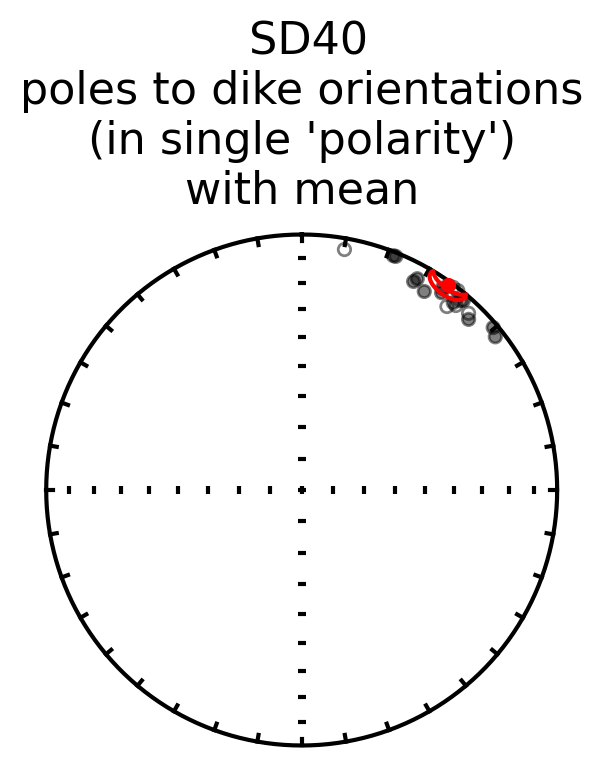

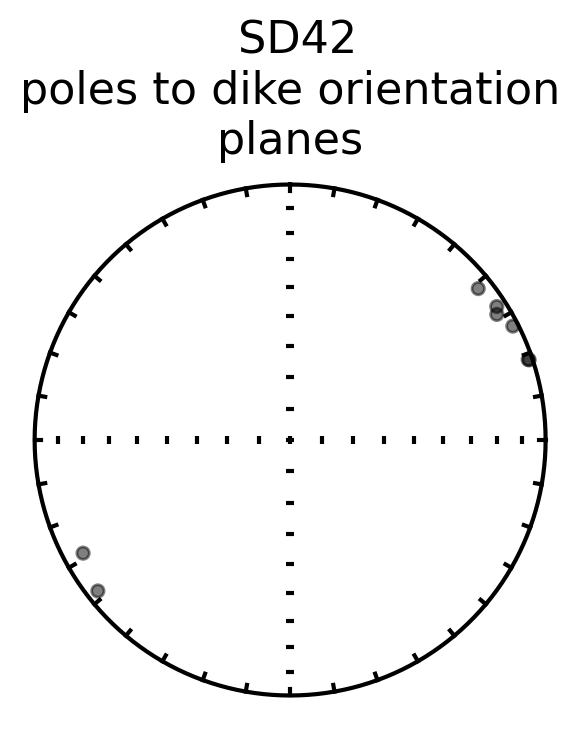

The mean dike plane pole is:
Dec: 60.7  Inc: 1.1
Number of directions in mean (n): 8
Angular radius of 95% confidence (a_95): 6.4
Precision parameter (k) estimate: 76.1


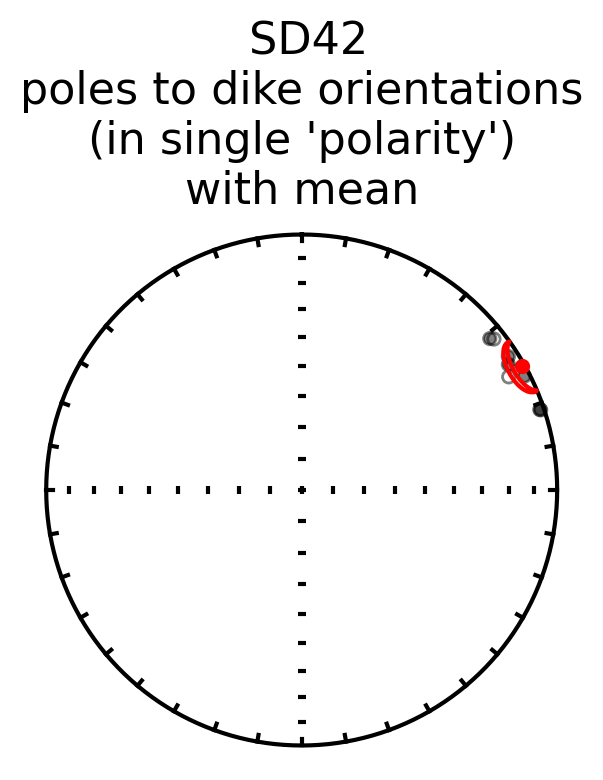

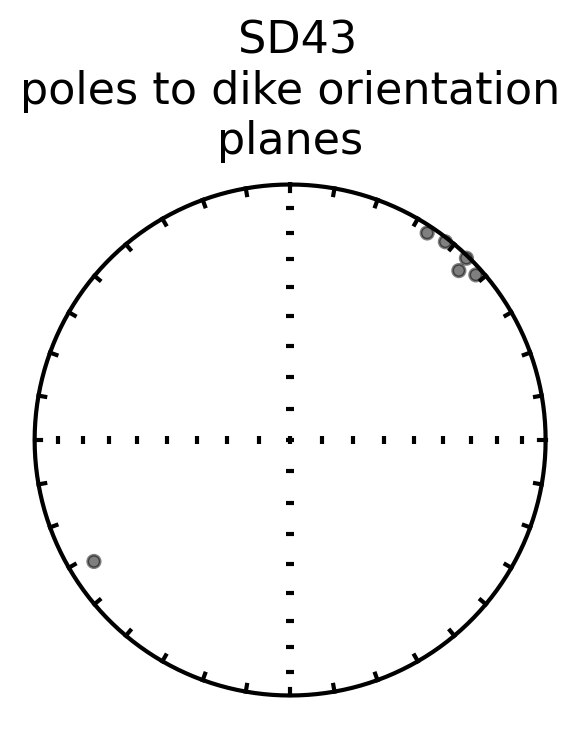

The mean dike plane pole is:
Dec: 44.5  Inc: 0.9
Number of directions in mean (n): 6
Angular radius of 95% confidence (a_95): 8.7
Precision parameter (k) estimate: 60.5


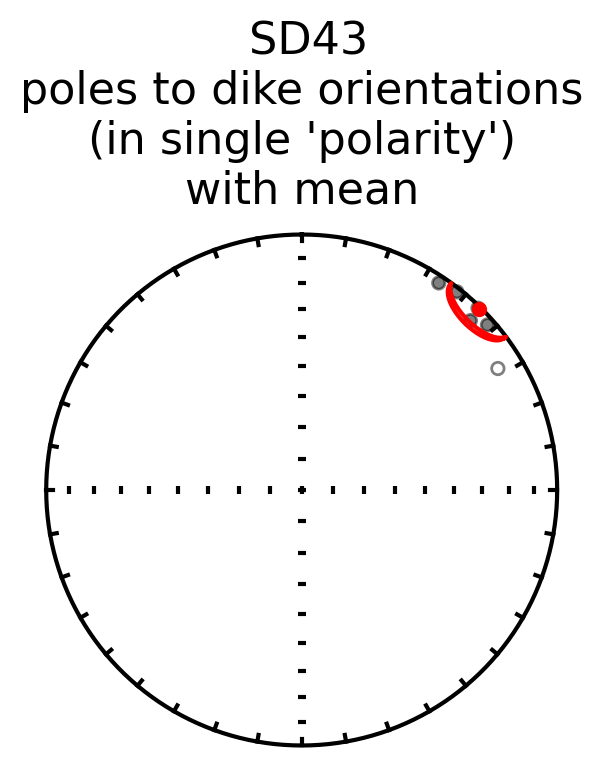

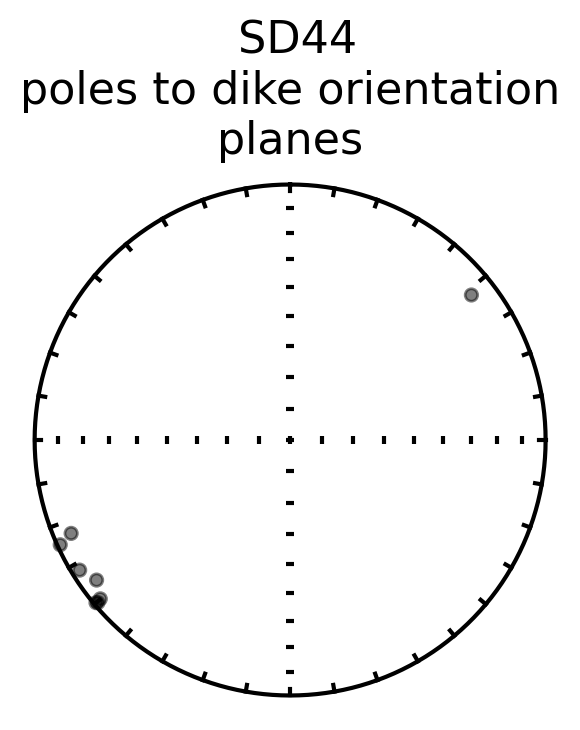

The mean dike plane pole is:
Dec: 235.7  Inc: 2.0
Number of directions in mean (n): 8
Angular radius of 95% confidence (a_95): 6.1
Precision parameter (k) estimate: 82.8


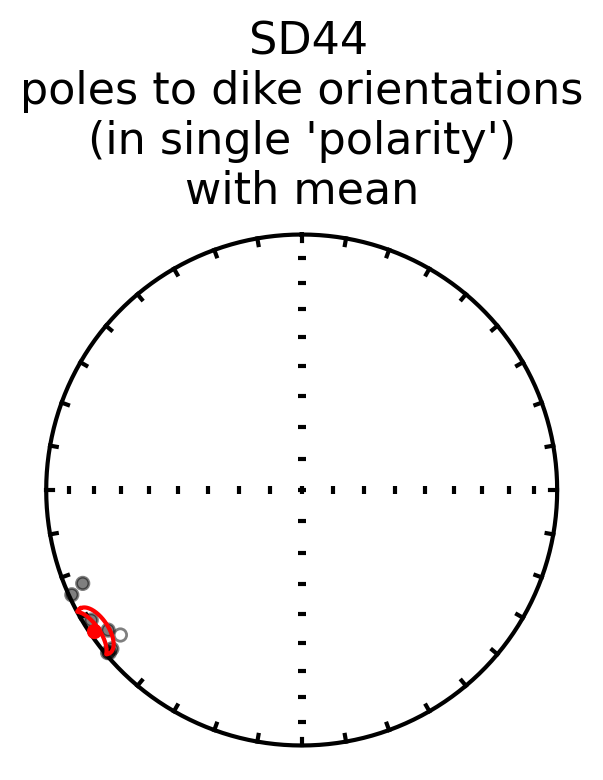

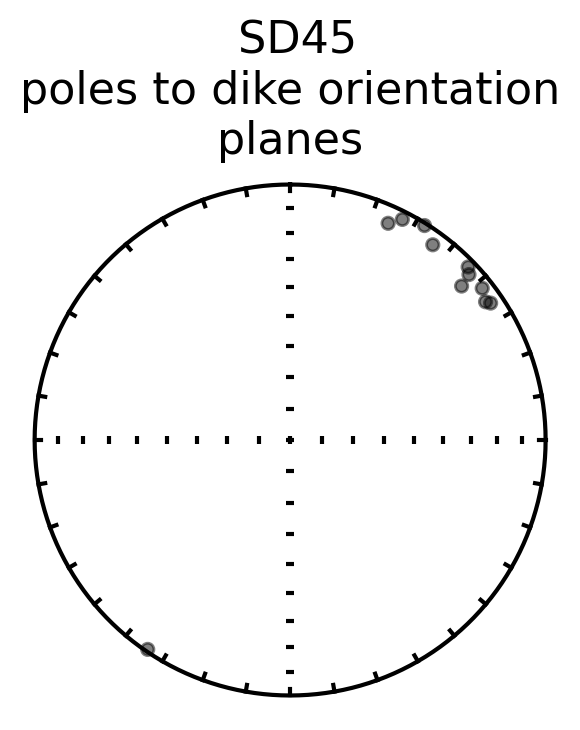

The mean dike plane pole is:
Dec: 41.5  Inc: 5.0
Number of directions in mean (n): 11
Angular radius of 95% confidence (a_95): 6.6
Precision parameter (k) estimate: 49.1


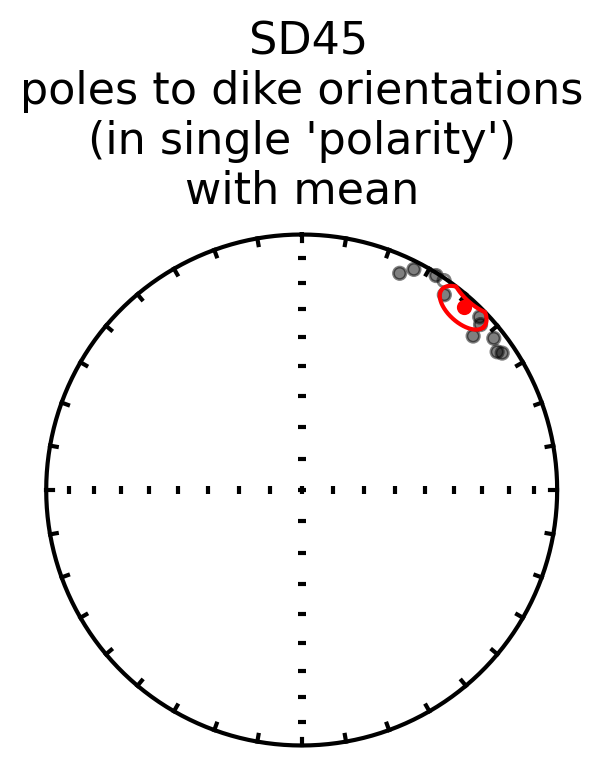

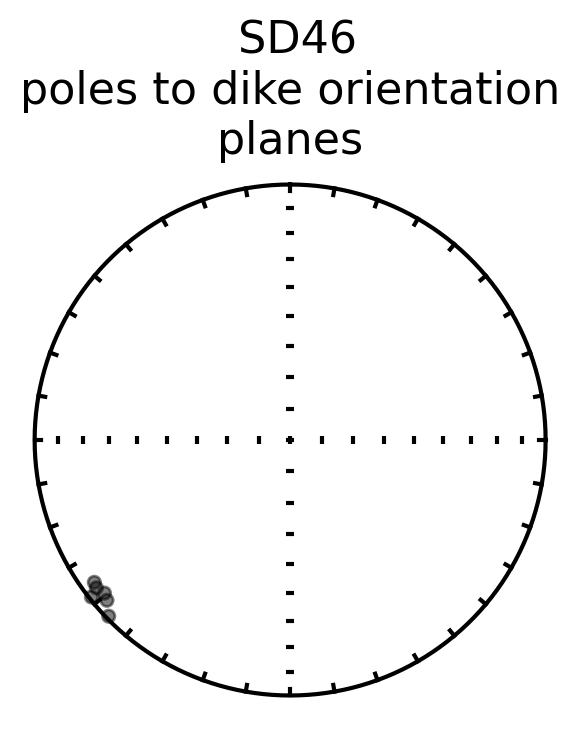

The mean dike plane pole is:
Dec: 230.6  Inc: 4.2
Number of directions in mean (n): 6
Angular radius of 95% confidence (a_95): 3.1
Precision parameter (k) estimate: 455.6


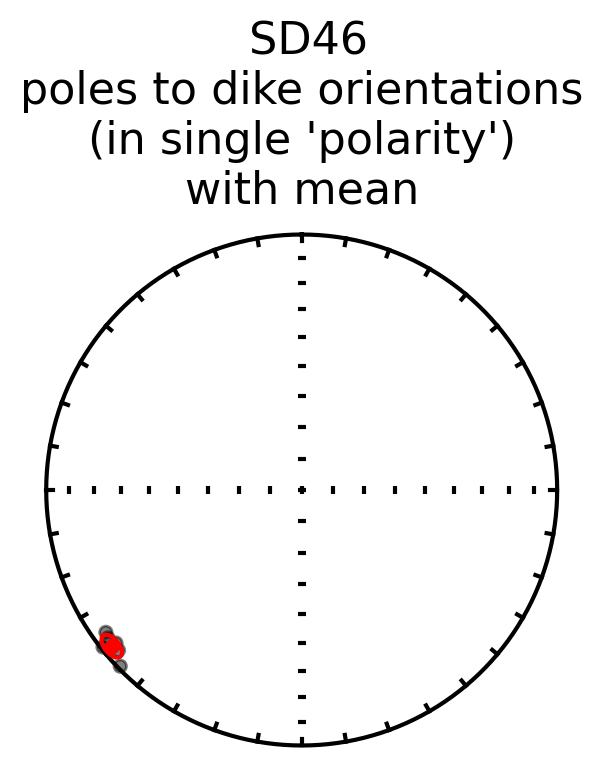

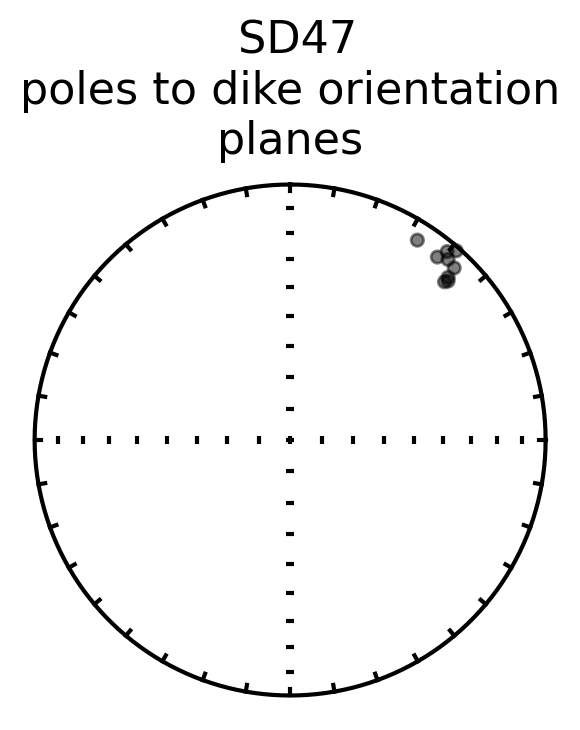

The mean dike plane pole is:
Dec: 41.2  Inc: 8.6
Number of directions in mean (n): 9
Angular radius of 95% confidence (a_95): 3.6
Precision parameter (k) estimate: 203.2


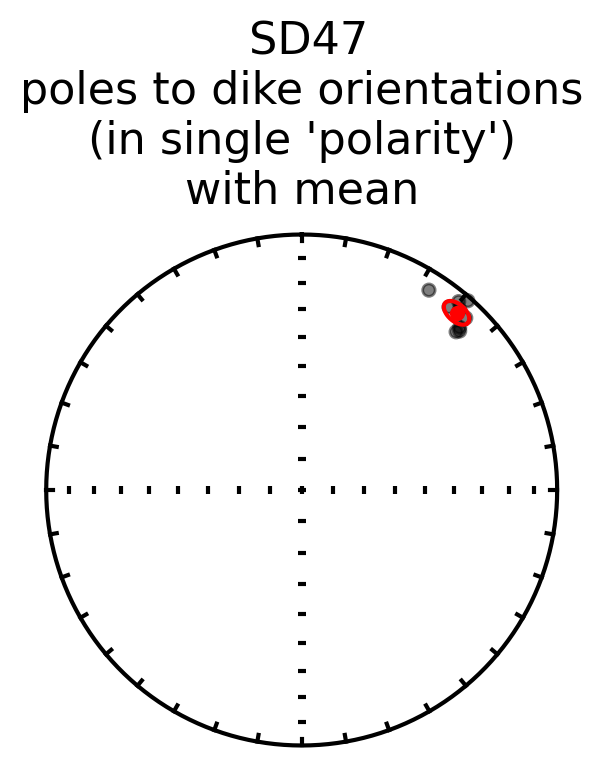

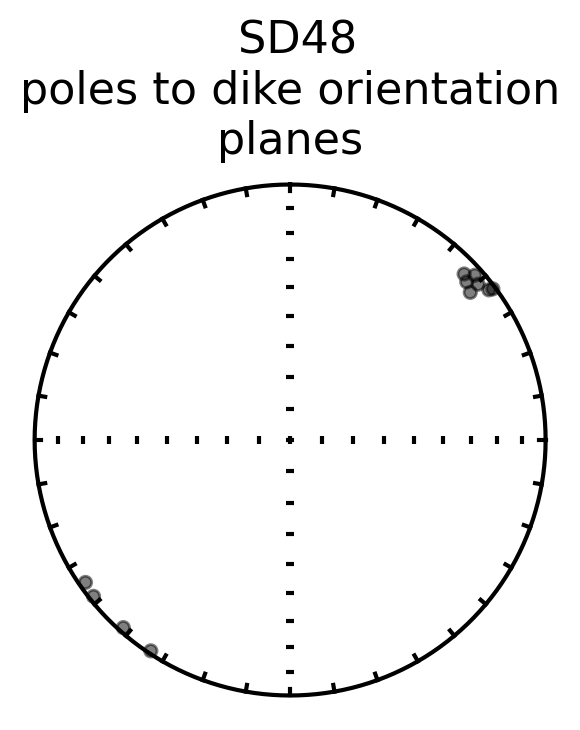

The mean dike plane pole is:
Dec: 48.4  Inc: 2.6
Number of directions in mean (n): 11
Angular radius of 95% confidence (a_95): 4.3
Precision parameter (k) estimate: 115.6


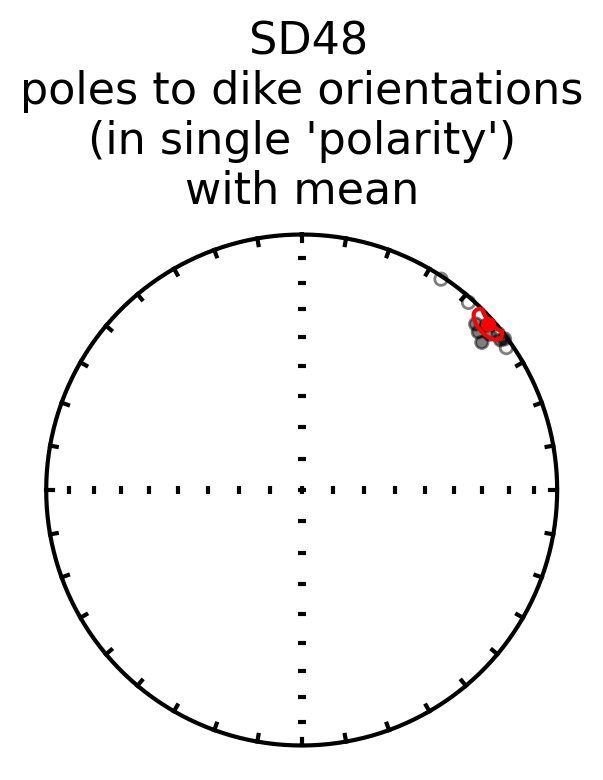

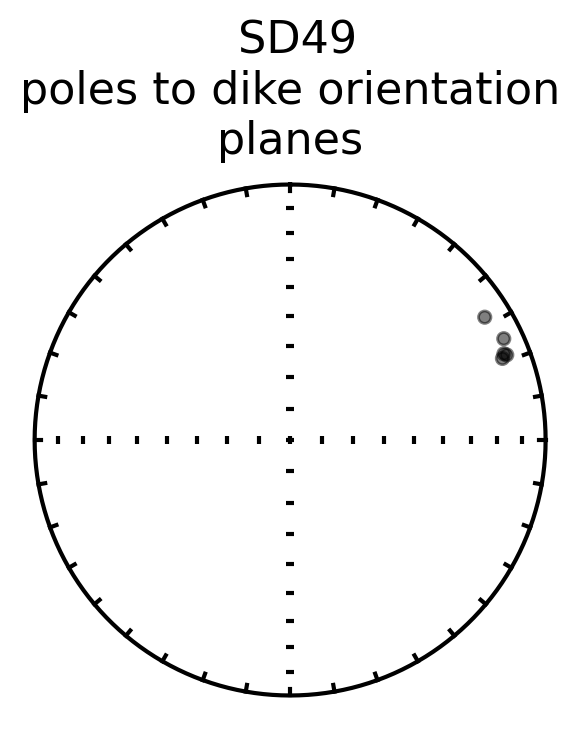

The mean dike plane pole is:
Dec: 65.6  Inc: 10.4
Number of directions in mean (n): 5
Angular radius of 95% confidence (a_95): 4.6
Precision parameter (k) estimate: 281.4


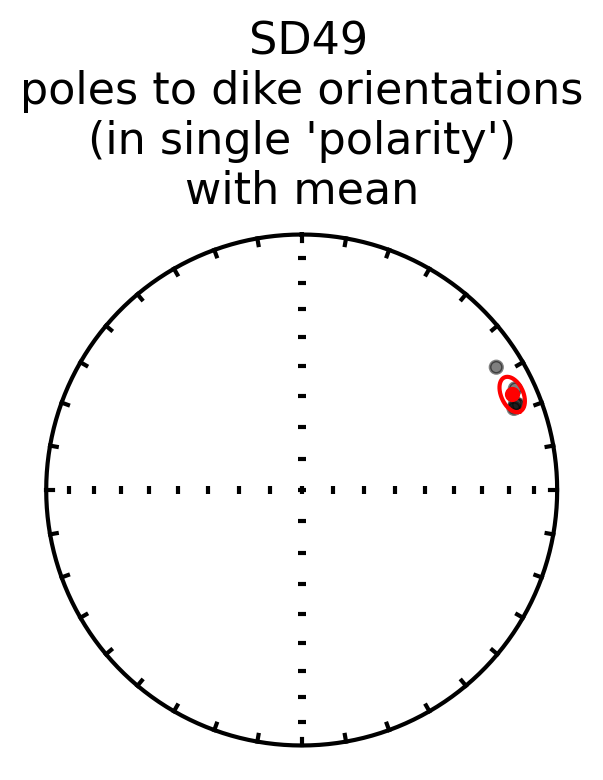

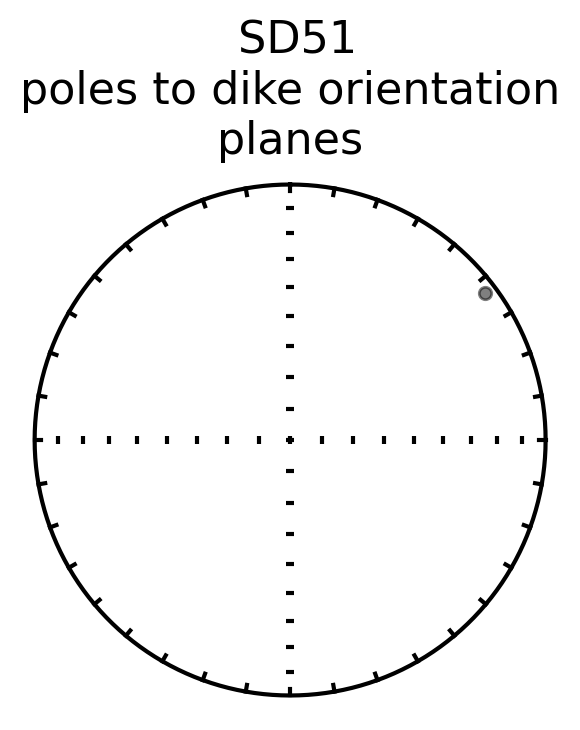

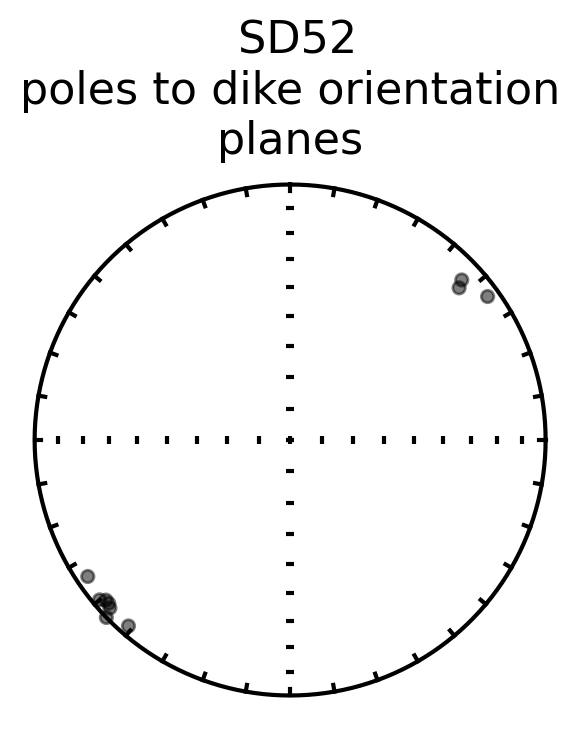

The mean dike plane pole is:
Dec: 228.6  Inc: 0.0
Number of directions in mean (n): 10
Angular radius of 95% confidence (a_95): 4.6
Precision parameter (k) estimate: 113.4


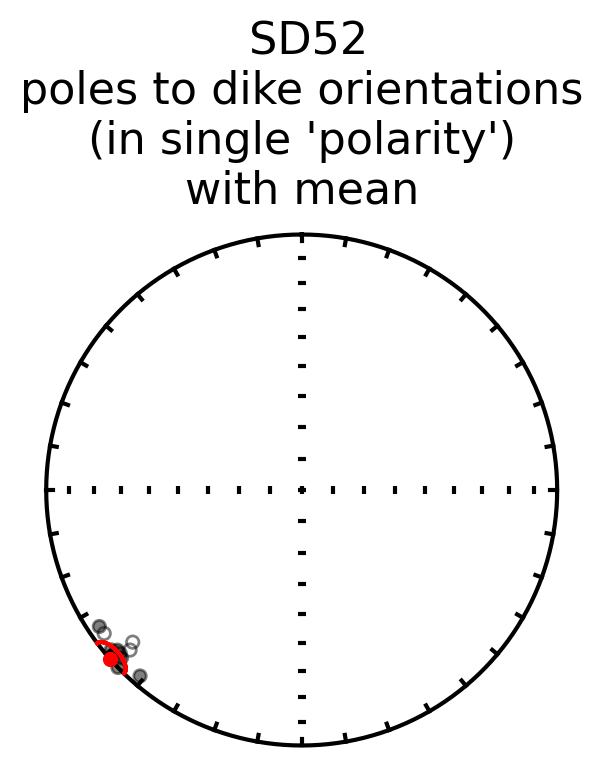

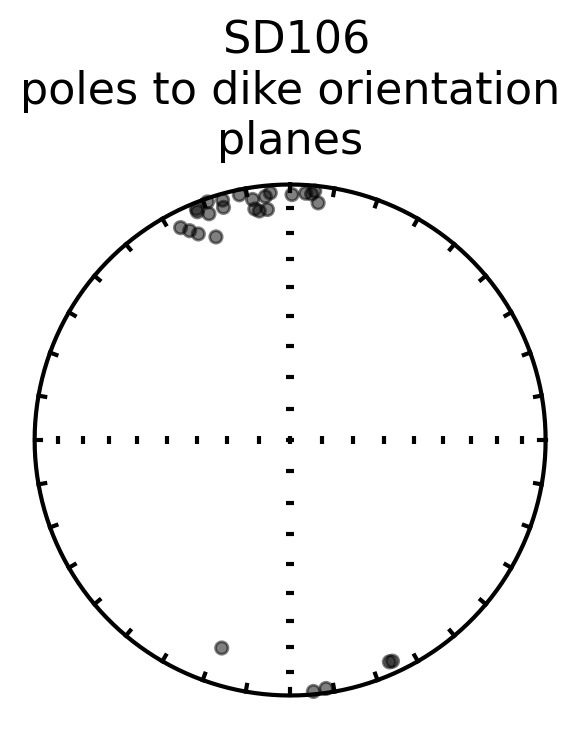

The mean dike plane pole is:
Dec: 349.3  Inc: 4.1
Number of directions in mean (n): 27
Angular radius of 95% confidence (a_95): 4.7
Precision parameter (k) estimate: 36.5


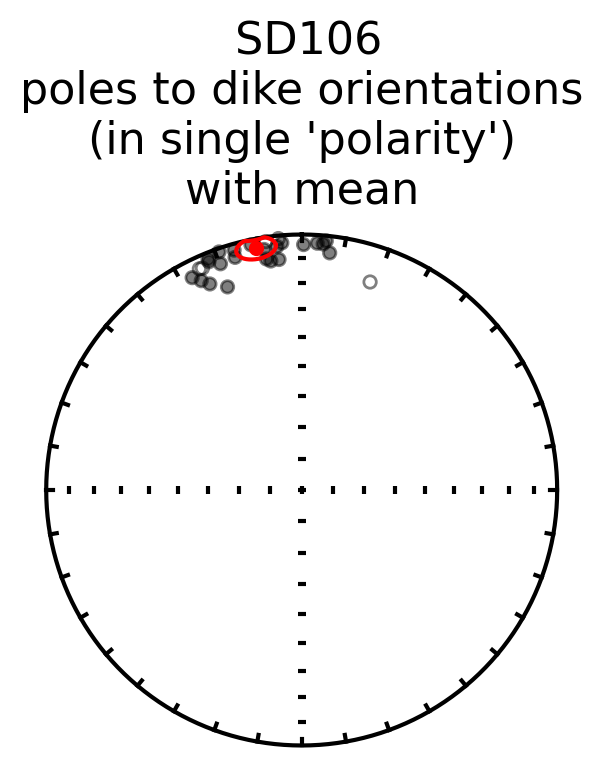

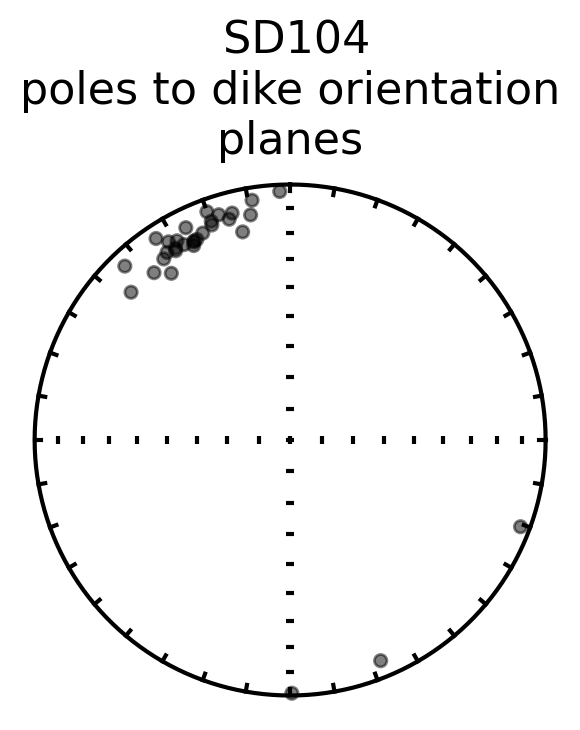

The mean dike plane pole is:
Dec: 334.2  Inc: 10.6
Number of directions in mean (n): 31
Angular radius of 95% confidence (a_95): 4.8
Precision parameter (k) estimate: 30.3


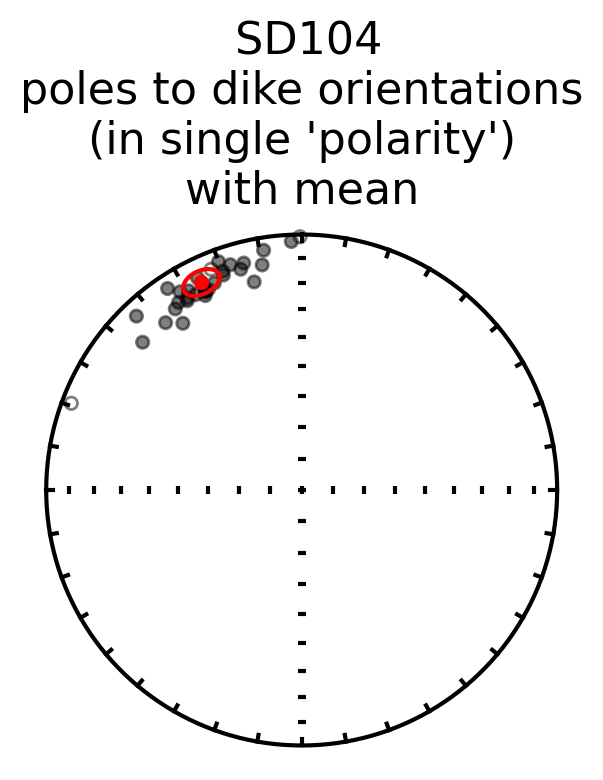

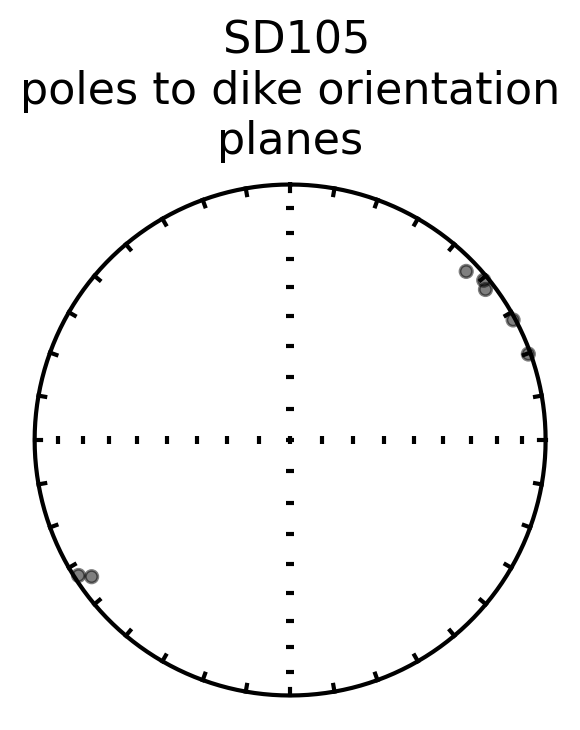

The mean dike plane pole is:
Dec: 56.3  Inc: 0.7
Number of directions in mean (n): 7
Angular radius of 95% confidence (a_95): 6.6
Precision parameter (k) estimate: 85.8


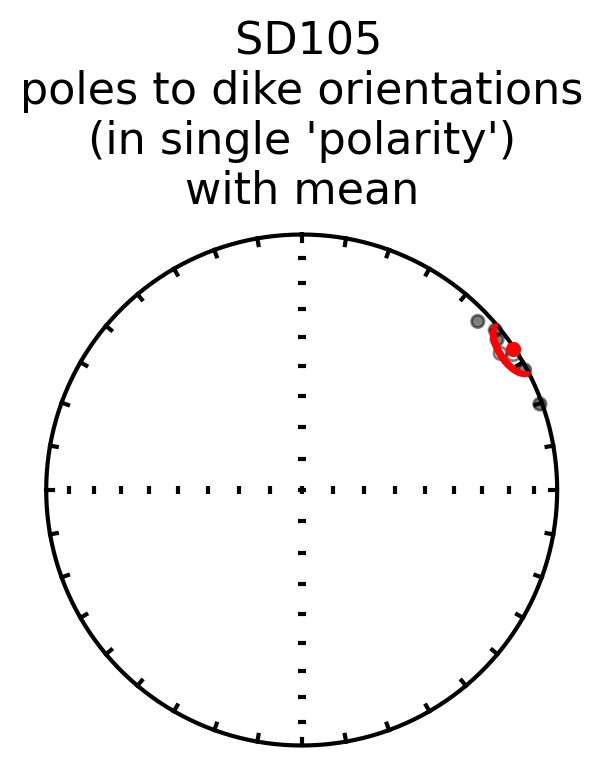

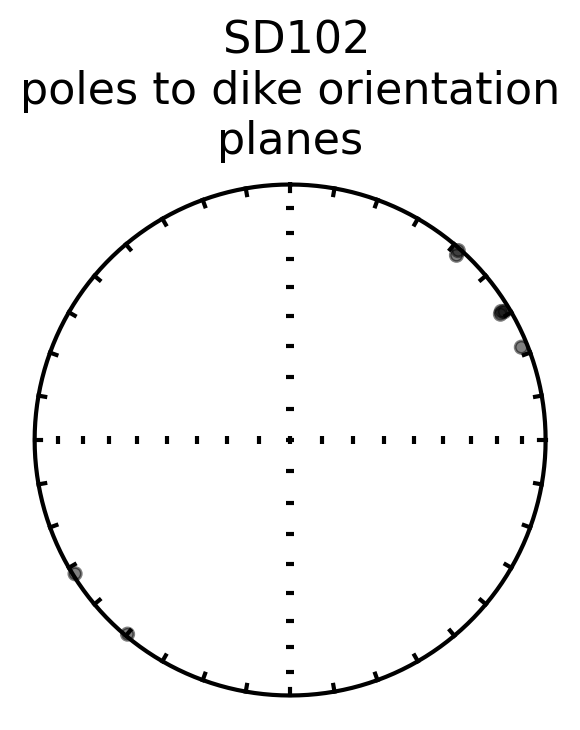

The mean dike plane pole is:
Dec: 53.3  Inc: 2.0
Number of directions in mean (n): 8
Angular radius of 95% confidence (a_95): 7.4
Precision parameter (k) estimate: 56.8


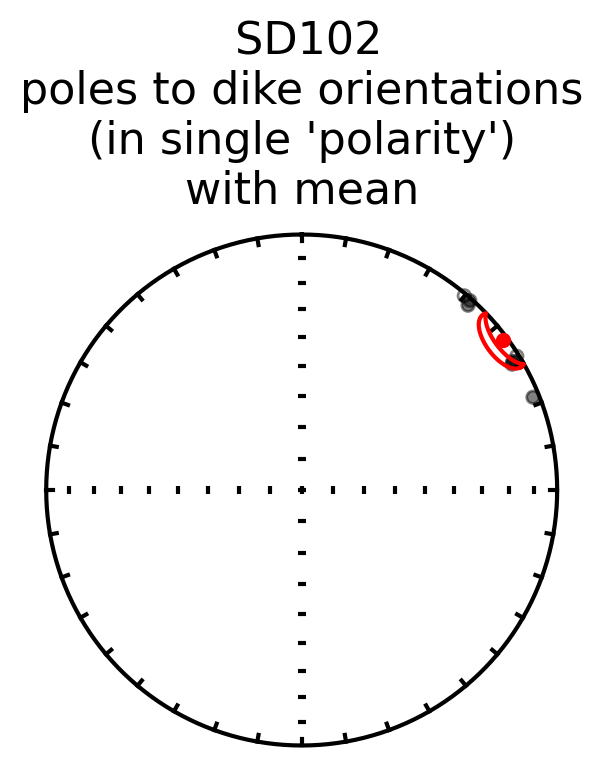

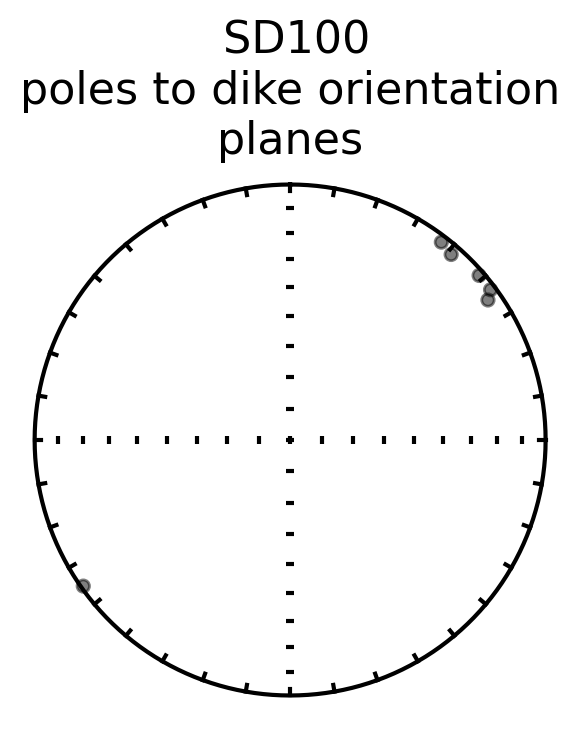

The mean dike plane pole is:
Dec: 48.3  Inc: 2.7
Number of directions in mean (n): 6
Angular radius of 95% confidence (a_95): 6.5
Precision parameter (k) estimate: 107.8


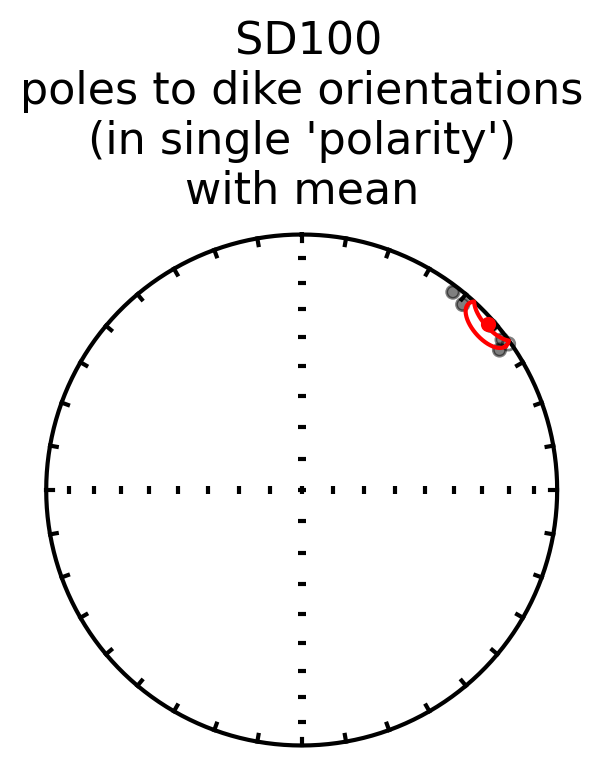

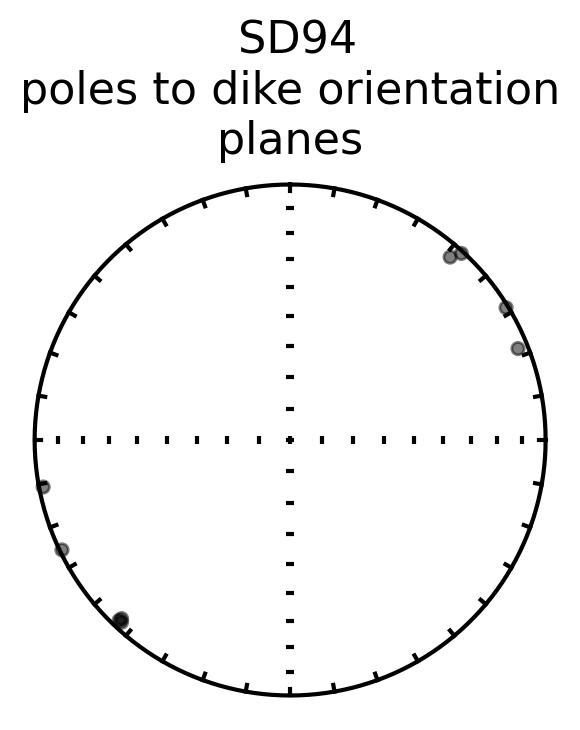

The mean dike plane pole is:
Dec: 233.6  Inc: 0.2
Number of directions in mean (n): 9
Angular radius of 95% confidence (a_95): 9.4
Precision parameter (k) estimate: 31.2


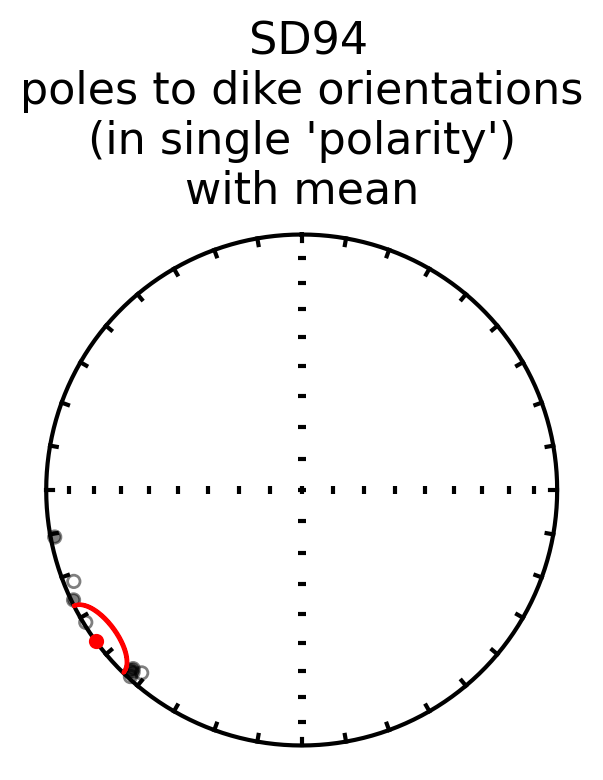

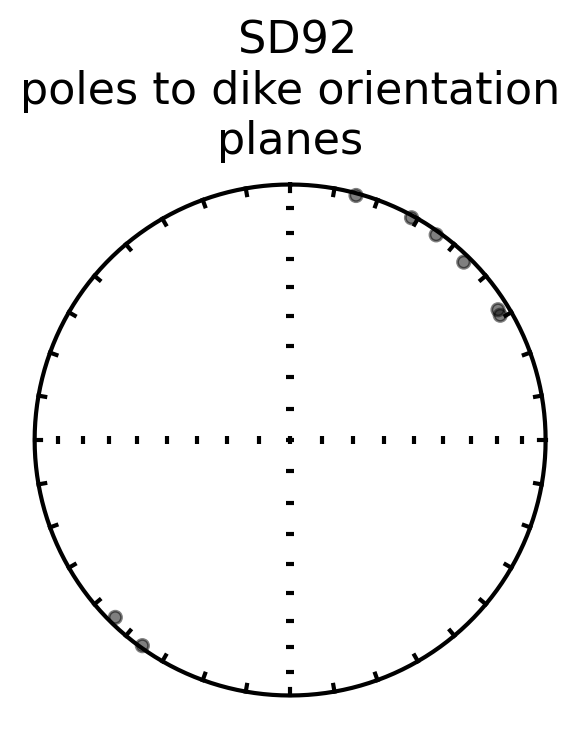

The mean dike plane pole is:
Dec: 40.1  Inc: 1.6
Number of directions in mean (n): 8
Angular radius of 95% confidence (a_95): 10.3
Precision parameter (k) estimate: 29.6


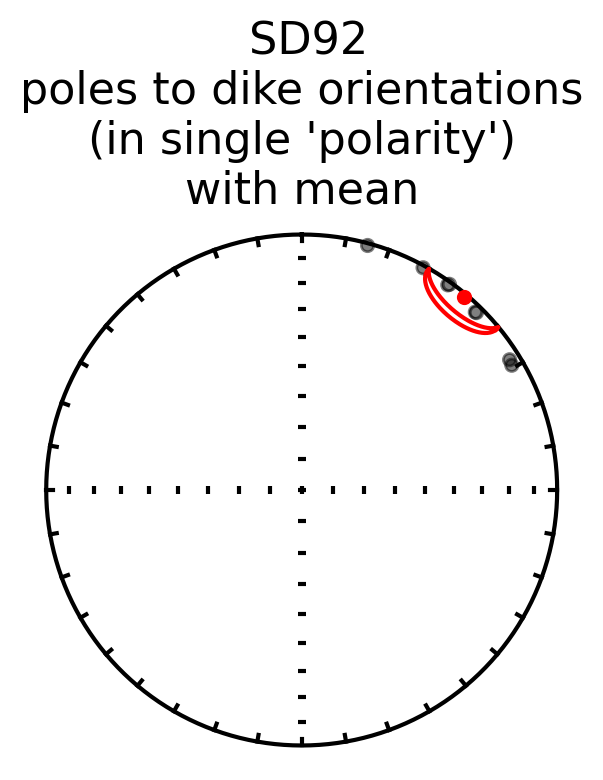

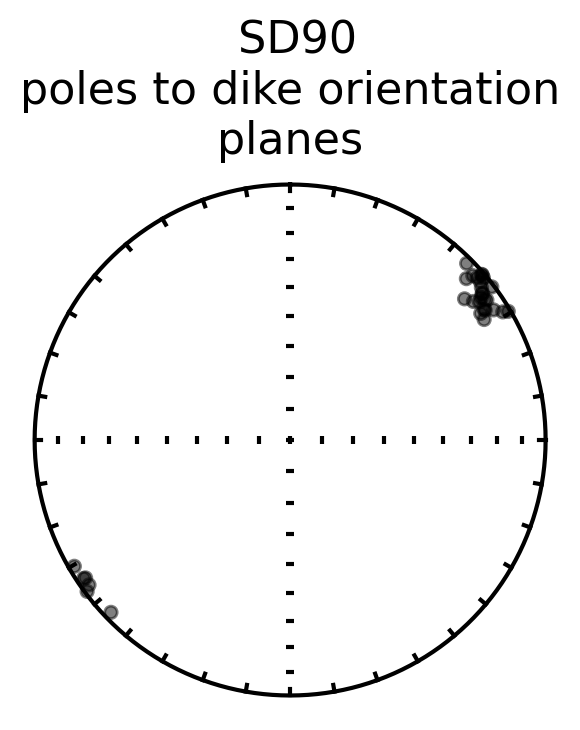

The mean dike plane pole is:
Dec: 53.1  Inc: 4.2
Number of directions in mean (n): 31
Angular radius of 95% confidence (a_95): 2.0
Precision parameter (k) estimate: 170.4


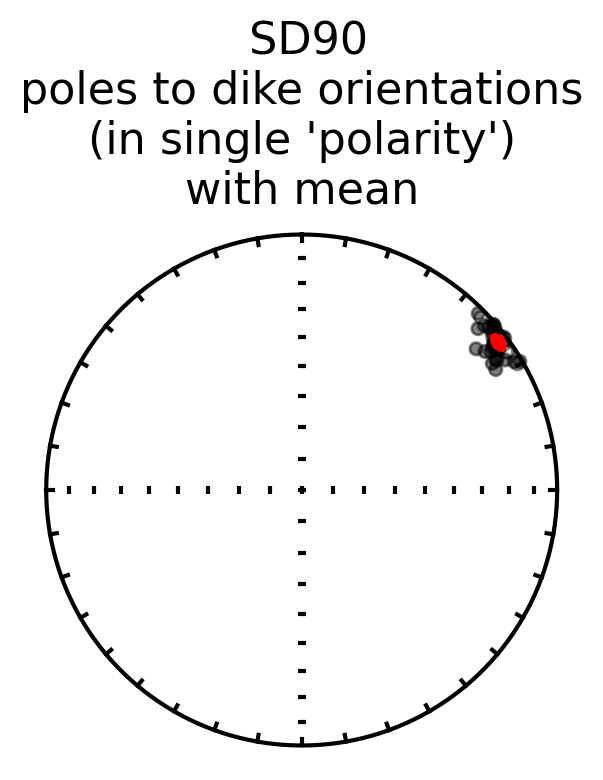

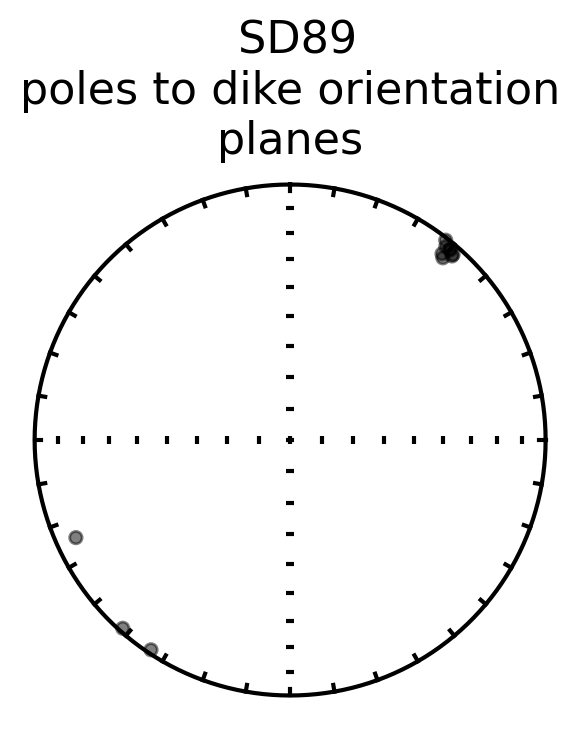

The mean dike plane pole is:
Dec: 41.7  Inc: 1.9
Number of directions in mean (n): 11
Angular radius of 95% confidence (a_95): 5.3
Precision parameter (k) estimate: 76.0


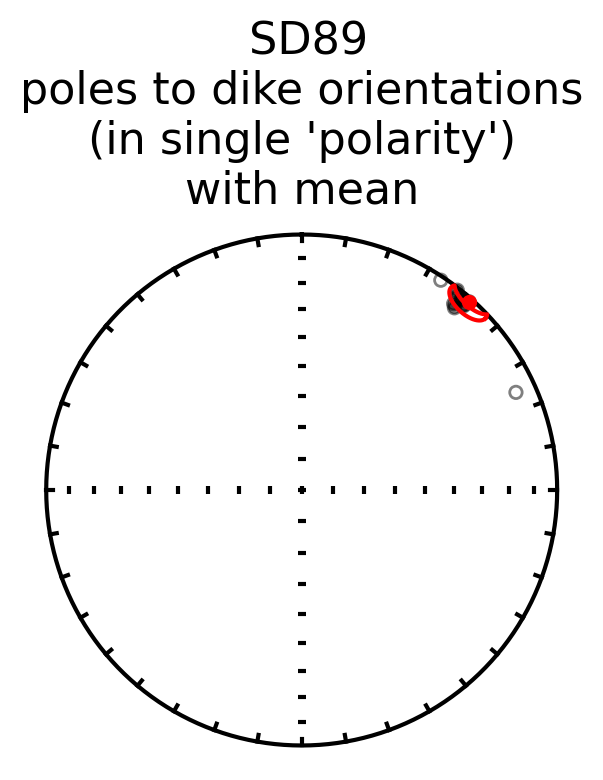

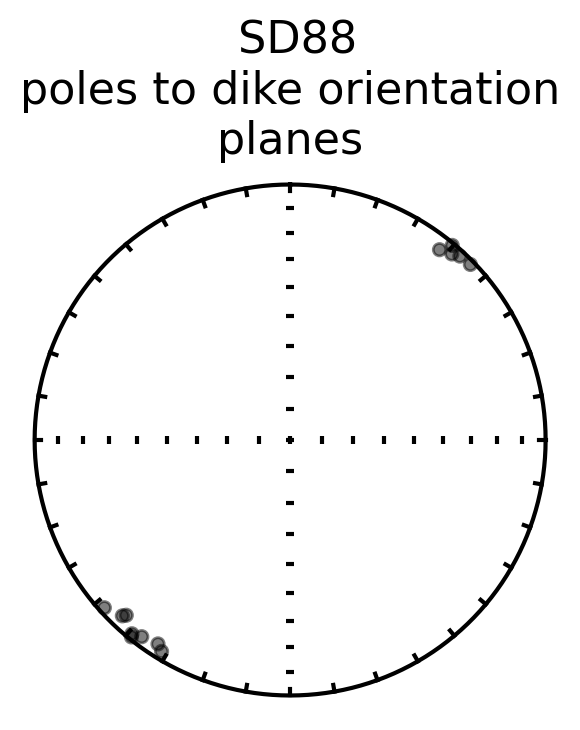

The mean dike plane pole is:
Dec: 220.1  Inc: 1.2
Number of directions in mean (n): 13
Angular radius of 95% confidence (a_95): 3.1
Precision parameter (k) estimate: 174.3


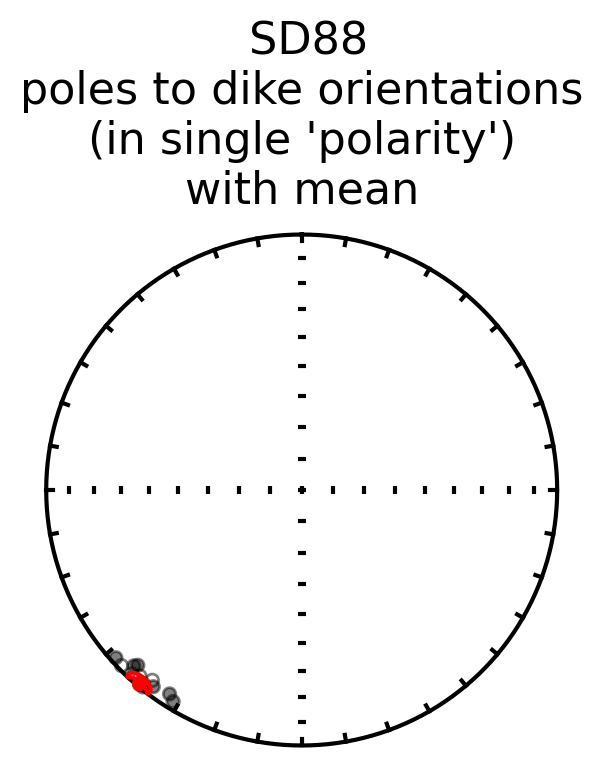

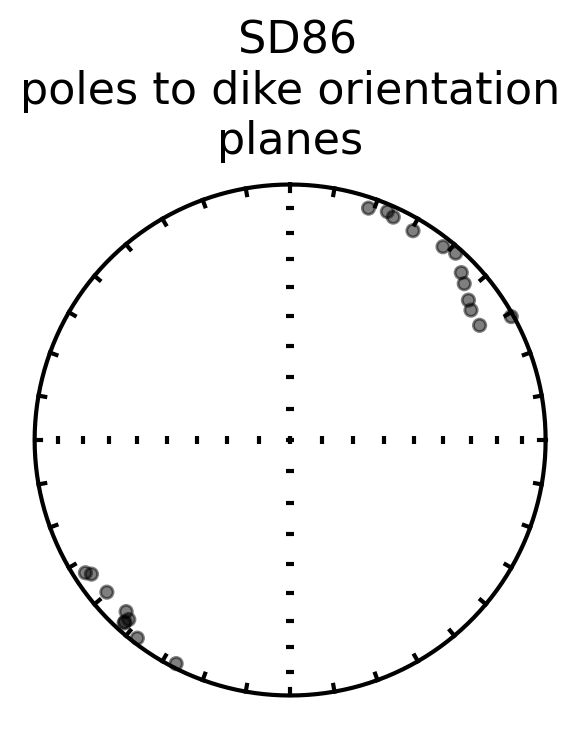

The mean dike plane pole is:
Dec: 42.6  Inc: 1.8
Number of directions in mean (n): 21
Angular radius of 95% confidence (a_95): 5.6
Precision parameter (k) estimate: 33.1


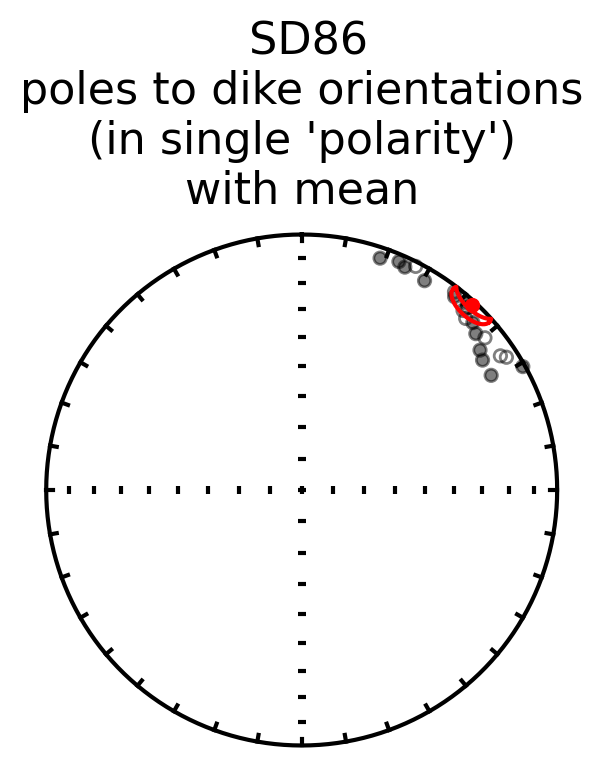

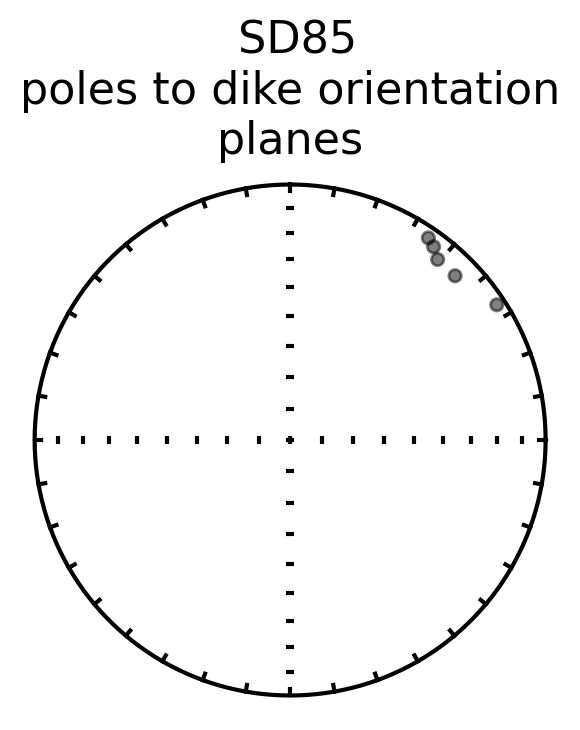

The mean dike plane pole is:
Dec: 42.4  Inc: 6.9
Number of directions in mean (n): 5
Angular radius of 95% confidence (a_95): 8.9
Precision parameter (k) estimate: 75.2


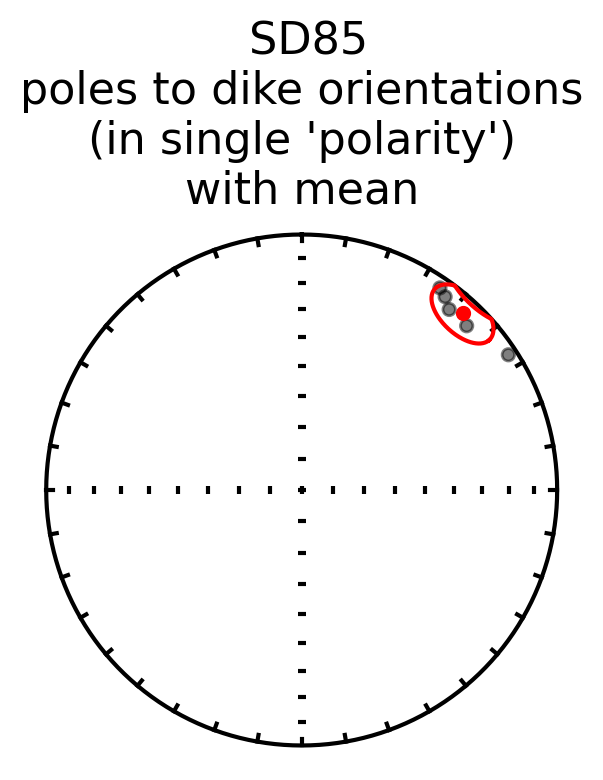

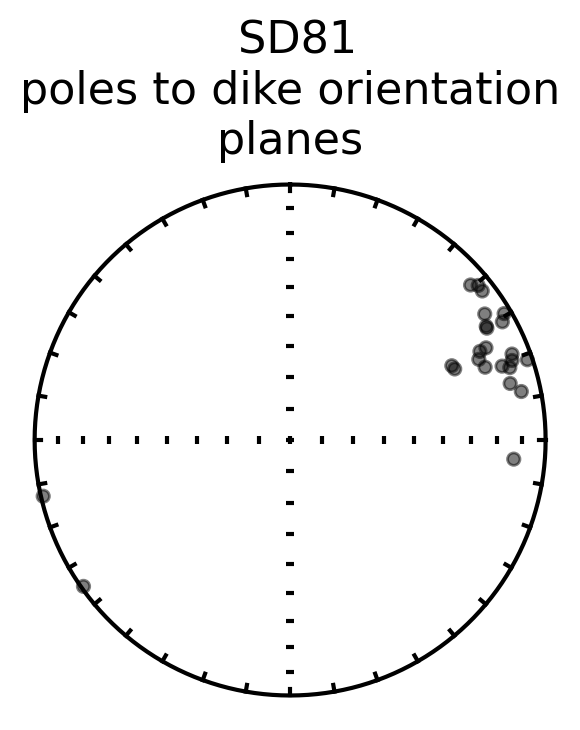

The mean dike plane pole is:
Dec: 65.8  Inc: 11.5
Number of directions in mean (n): 24
Angular radius of 95% confidence (a_95): 4.8
Precision parameter (k) estimate: 38.9


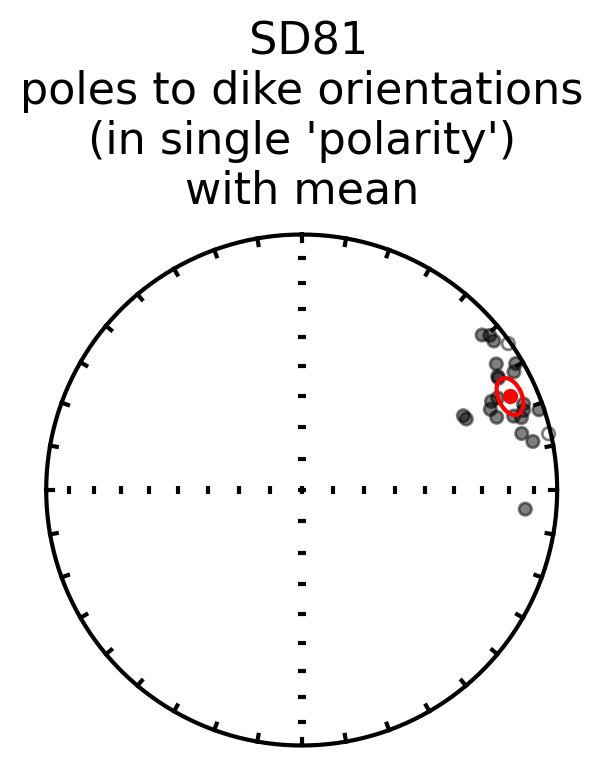

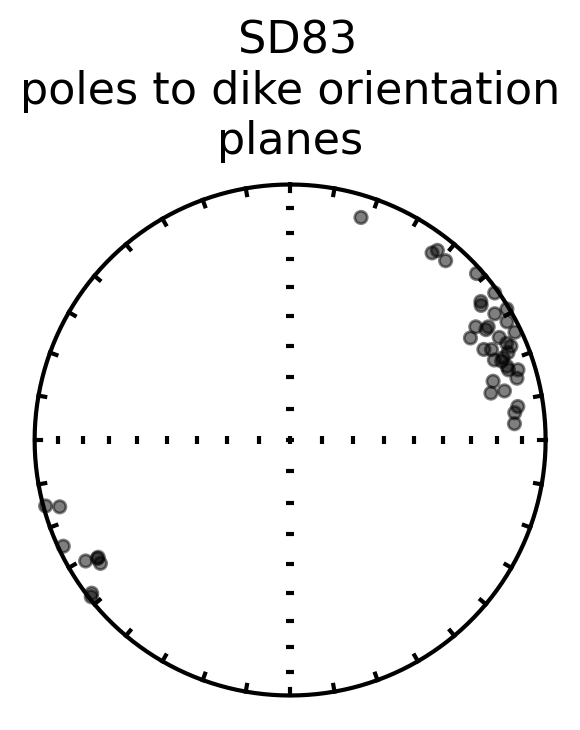

The mean dike plane pole is:
Dec: 62.6  Inc: 7.1
Number of directions in mean (n): 44
Angular radius of 95% confidence (a_95): 4.1
Precision parameter (k) estimate: 28.1


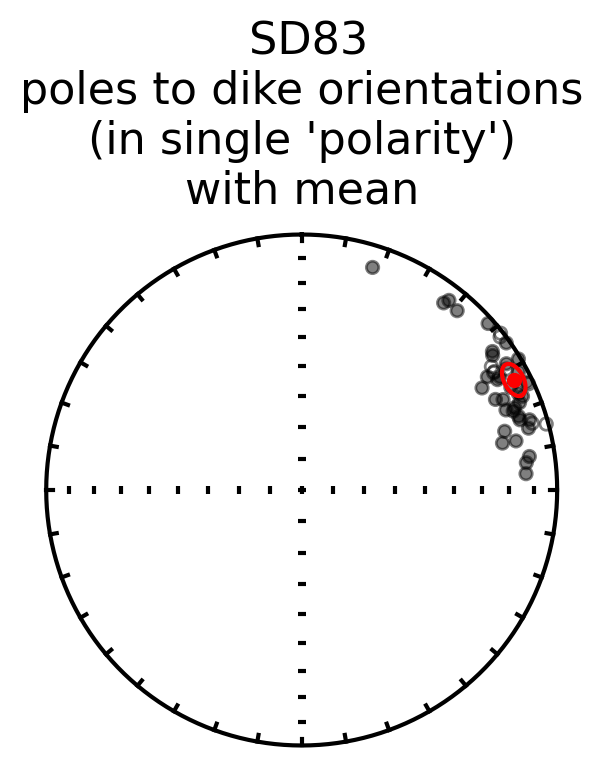

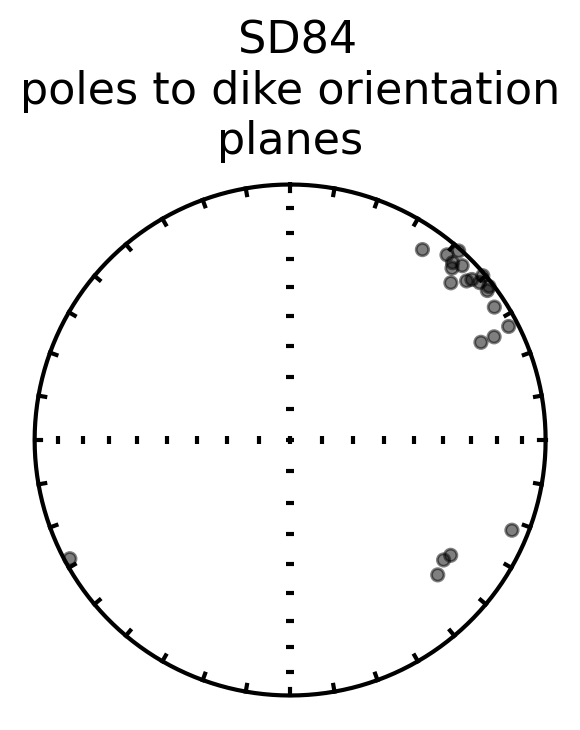

The mean dike plane pole is:
Dec: 60.9  Inc: 9.6
Number of directions in mean (n): 22
Angular radius of 95% confidence (a_95): 12.0
Precision parameter (k) estimate: 7.7


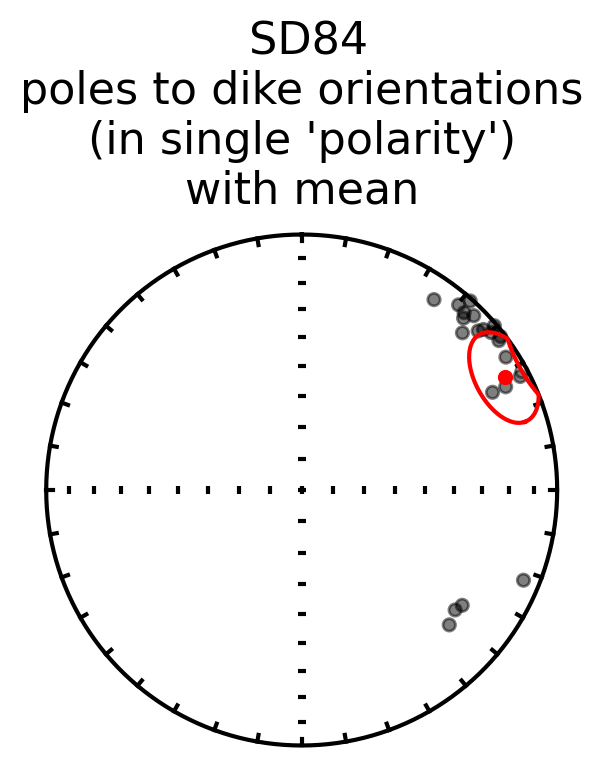

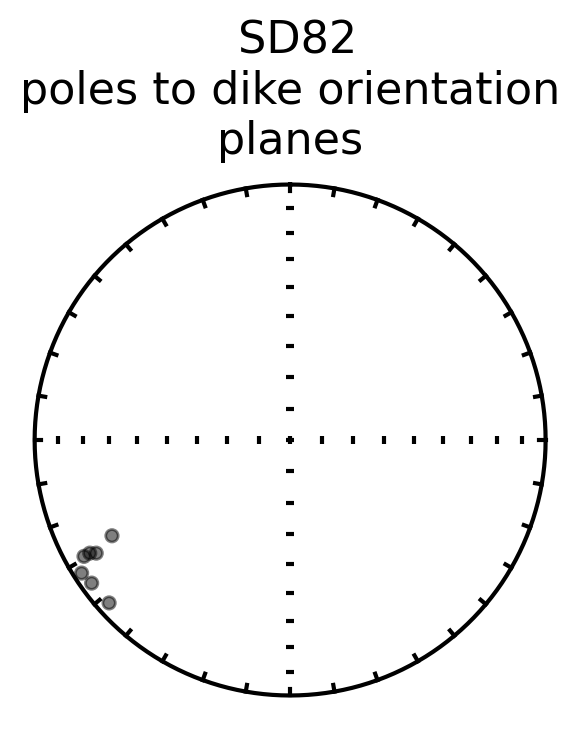

The mean dike plane pole is:
Dec: 237.4  Inc: 9.7
Number of directions in mean (n): 7
Angular radius of 95% confidence (a_95): 6.0
Precision parameter (k) estimate: 102.5


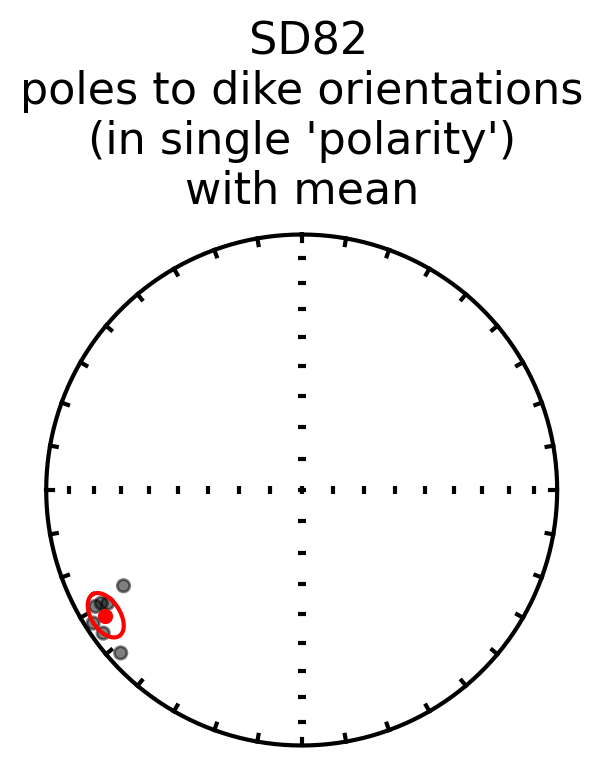

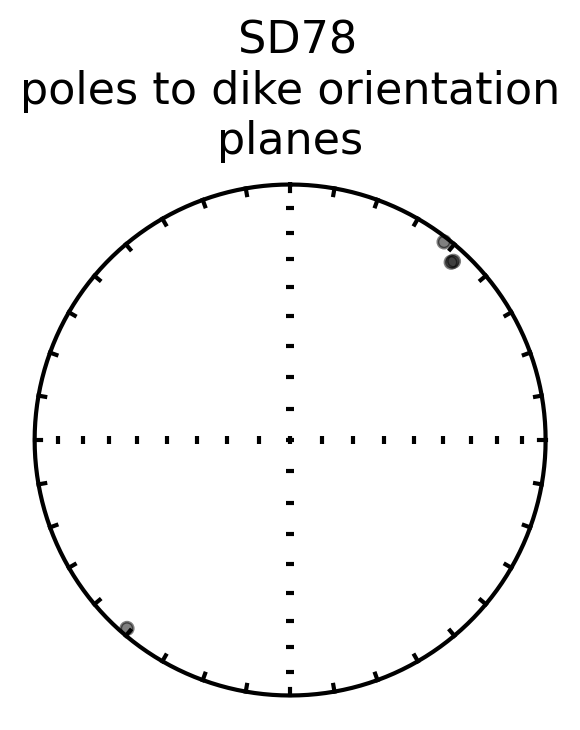

The mean dike plane pole is:
Dec: 40.8  Inc: 3.0
Number of directions in mean (n): 4
Angular radius of 95% confidence (a_95): 5.5
Precision parameter (k) estimate: 281.3


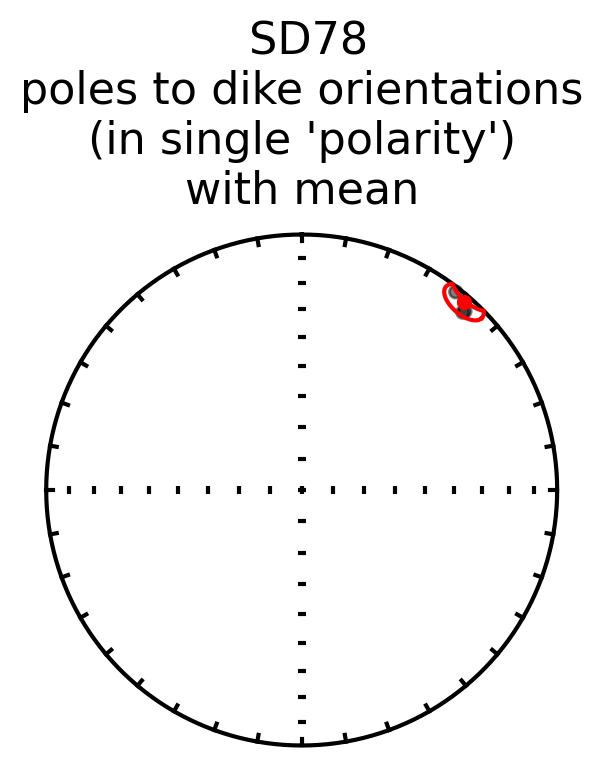

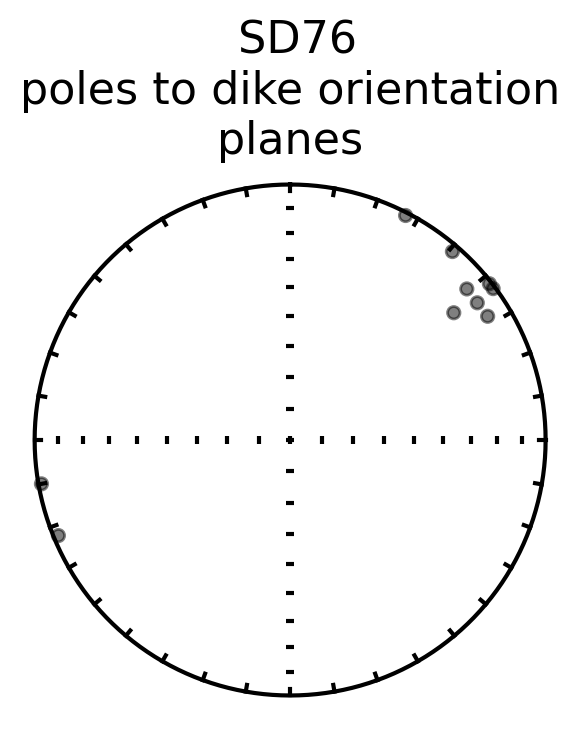

The mean dike plane pole is:
Dec: 53.4  Inc: 5.4
Number of directions in mean (n): 10
Angular radius of 95% confidence (a_95): 9.5
Precision parameter (k) estimate: 26.9


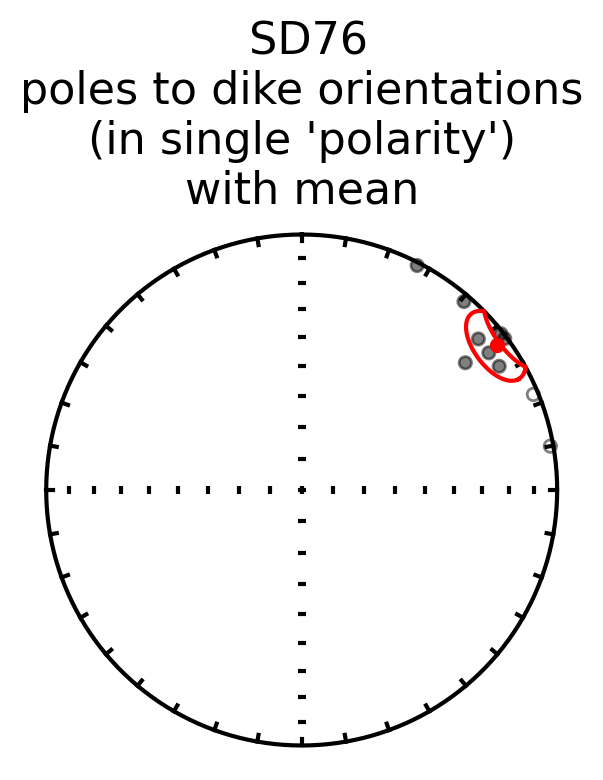

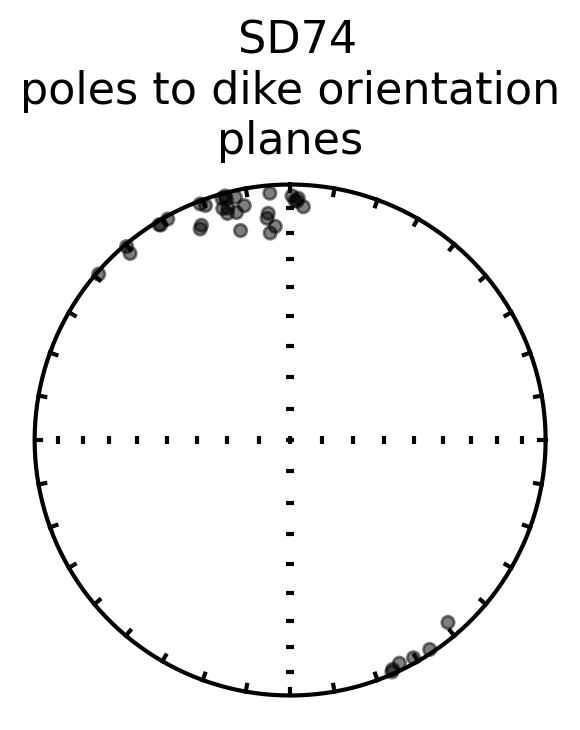

The mean dike plane pole is:
Dec: 342.0  Inc: 5.3
Number of directions in mean (n): 36
Angular radius of 95% confidence (a_95): 4.4
Precision parameter (k) estimate: 30.3


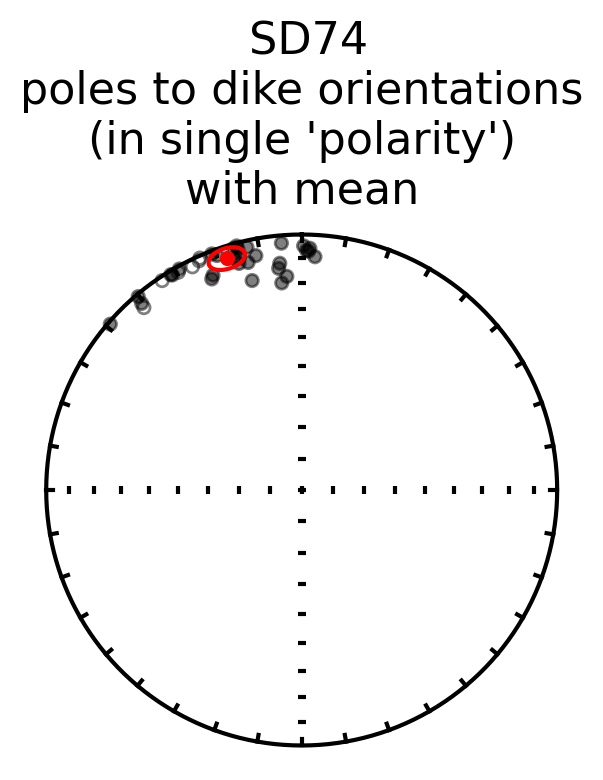

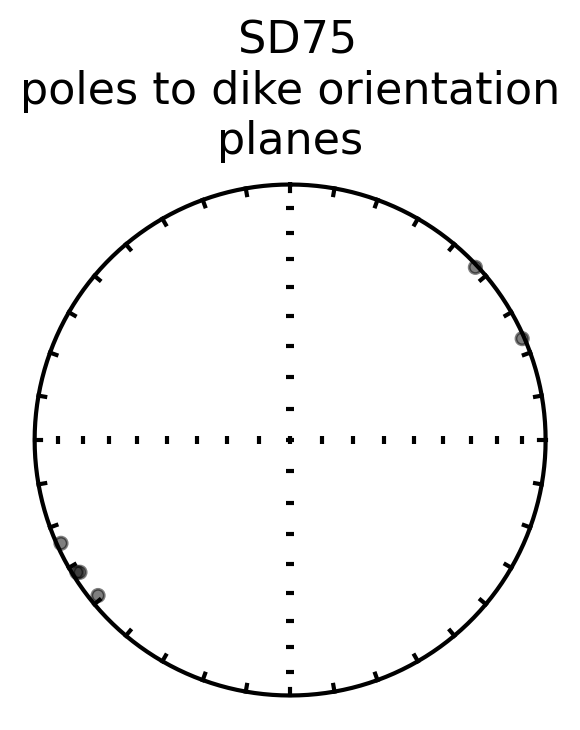

The mean dike plane pole is:
Dec: 237.7  Inc: 1.5
Number of directions in mean (n): 6
Angular radius of 95% confidence (a_95): 6.6
Precision parameter (k) estimate: 102.9


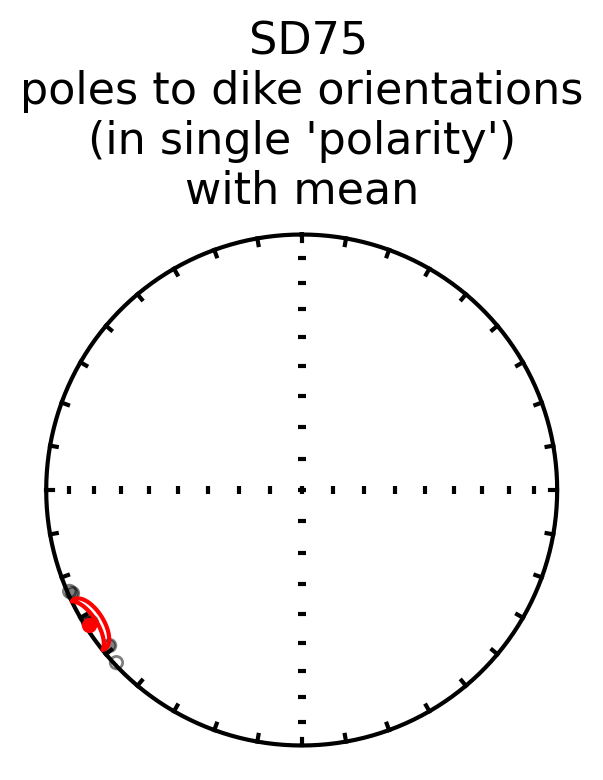

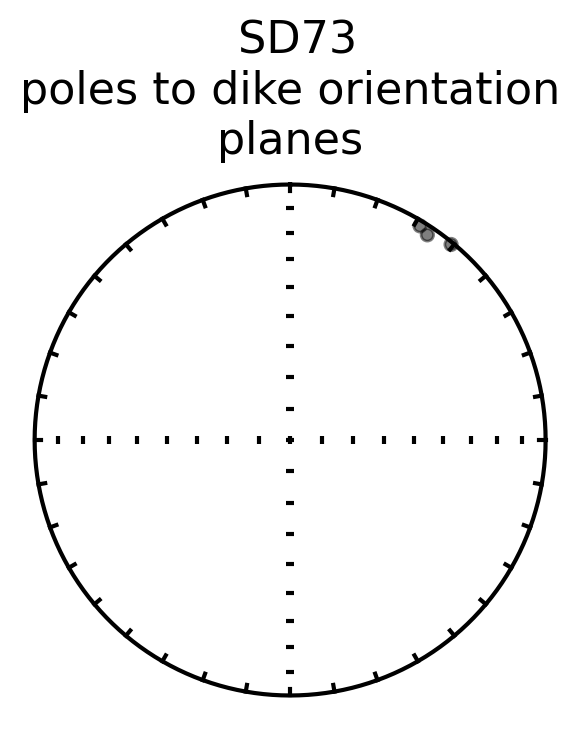

The mean dike plane pole is:
Dec: 34.8  Inc: 2.4
Number of directions in mean (n): 3
Angular radius of 95% confidence (a_95): 6.8
Precision parameter (k) estimate: 333.2


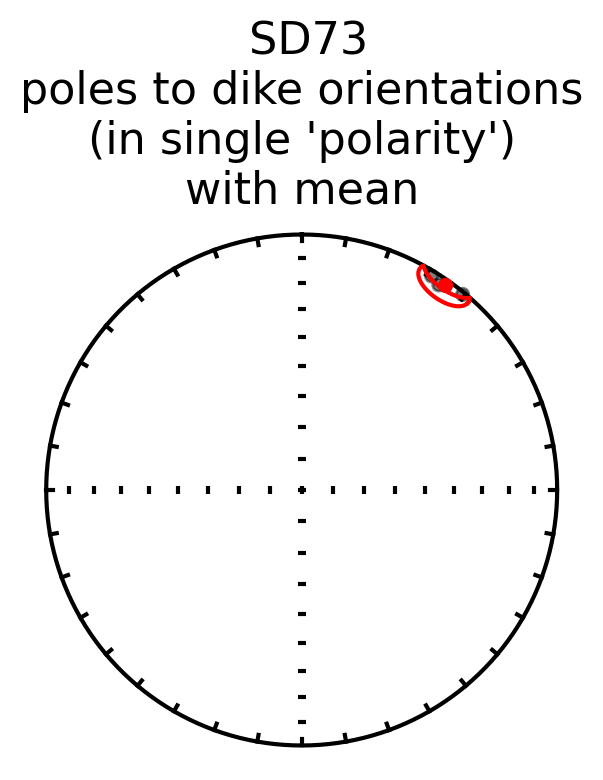

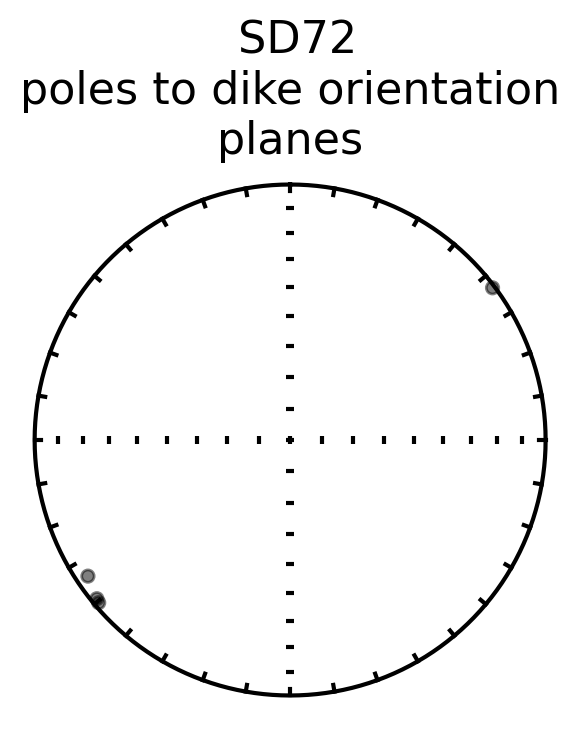

The mean dike plane pole is:
Dec: 232.3  Inc: 2.1
Number of directions in mean (n): 4
Angular radius of 95% confidence (a_95): 4.3
Precision parameter (k) estimate: 453.3


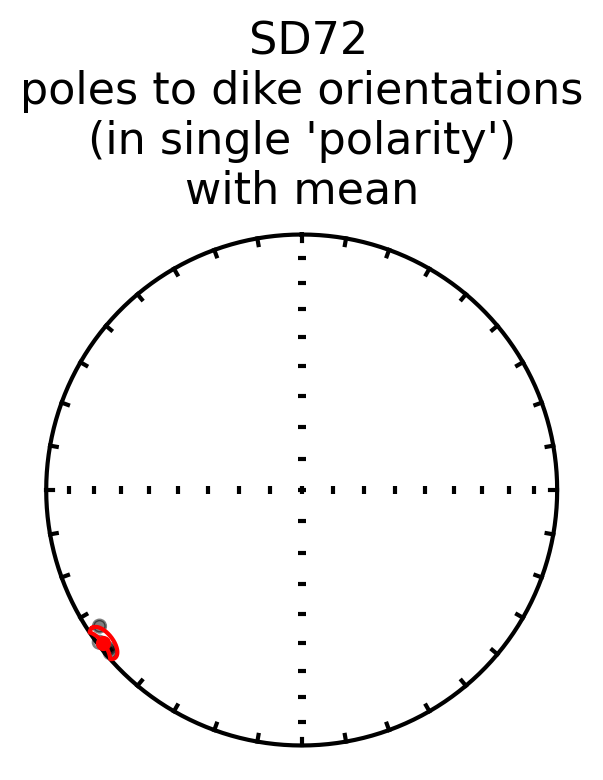

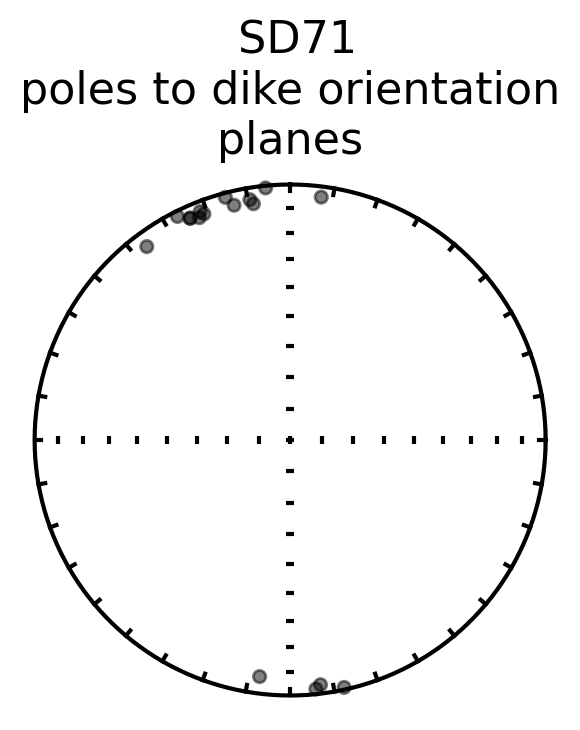

The mean dike plane pole is:
Dec: 345.9  Inc: 2.9
Number of directions in mean (n): 17
Angular radius of 95% confidence (a_95): 5.5
Precision parameter (k) estimate: 42.8


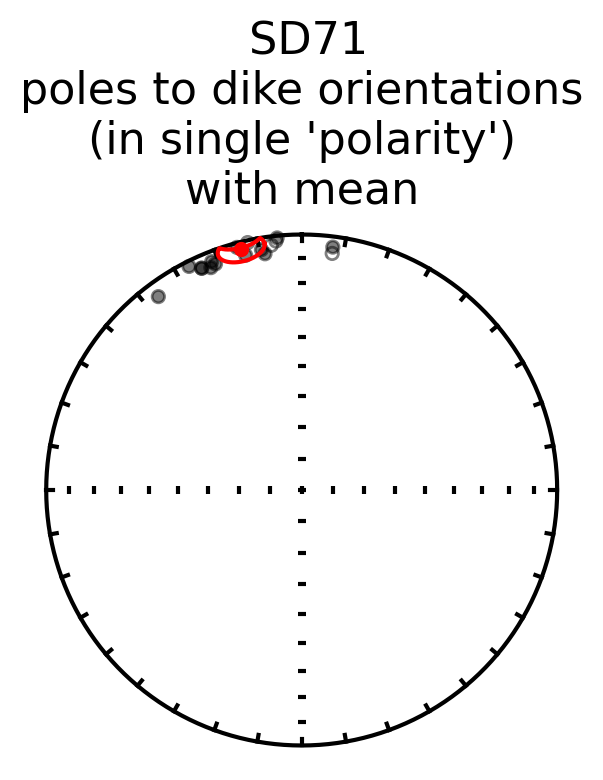

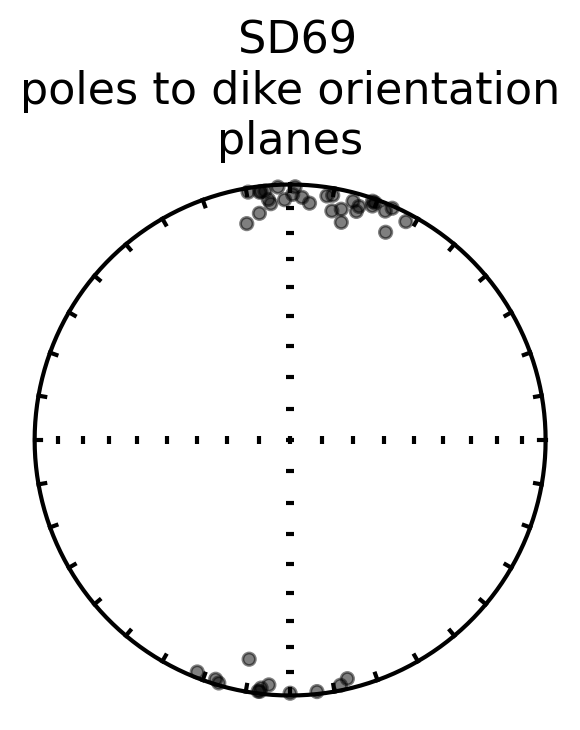

The mean dike plane pole is:
Dec: 6.5  Inc: 3.0
Number of directions in mean (n): 41
Angular radius of 95% confidence (a_95): 3.6
Precision parameter (k) estimate: 40.5


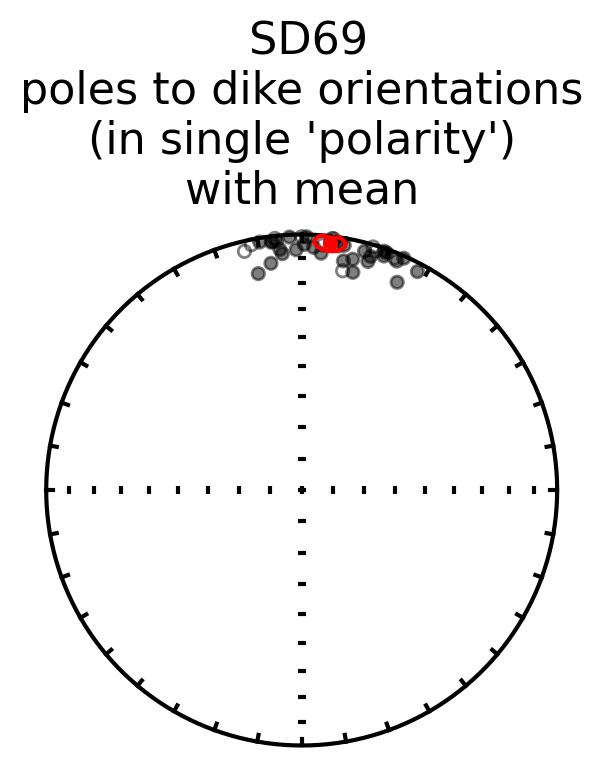

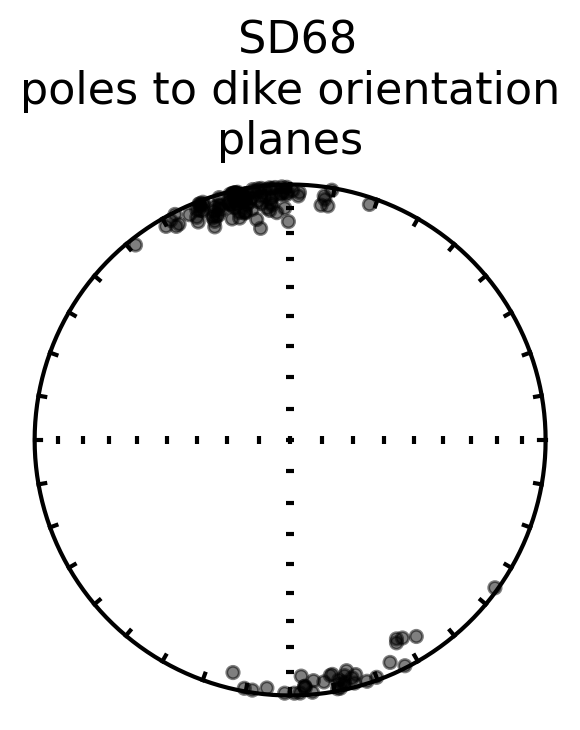

The mean dike plane pole is:
Dec: 348.9  Inc: 2.7
Number of directions in mean (n): 142
Angular radius of 95% confidence (a_95): 1.7
Precision parameter (k) estimate: 48.6


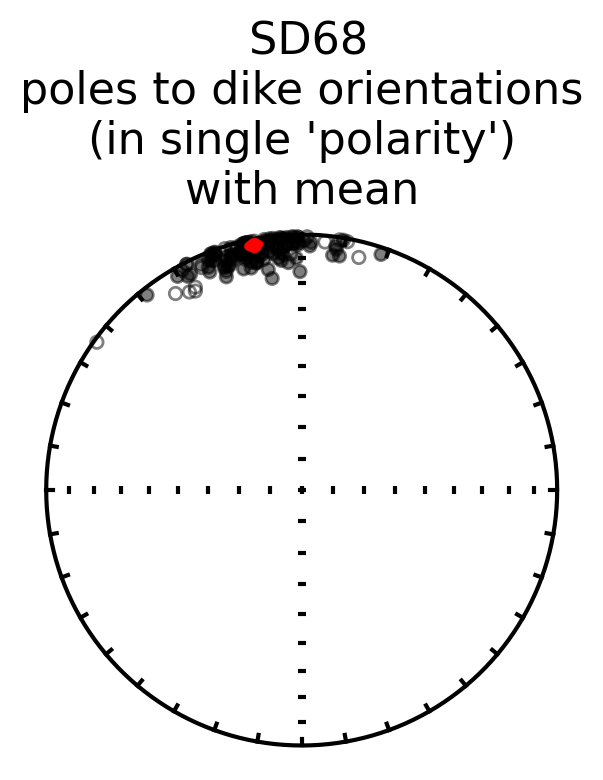

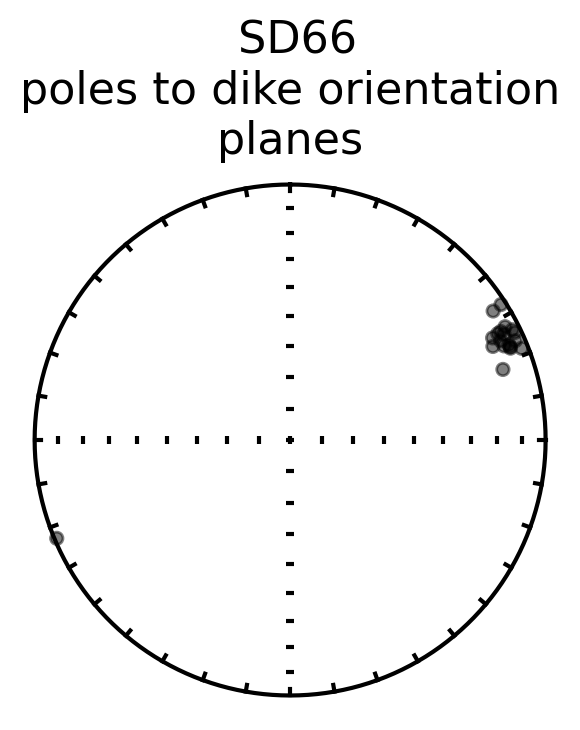

The mean dike plane pole is:
Dec: 64.6  Inc: 6.9
Number of directions in mean (n): 19
Angular radius of 95% confidence (a_95): 2.2
Precision parameter (k) estimate: 242.7


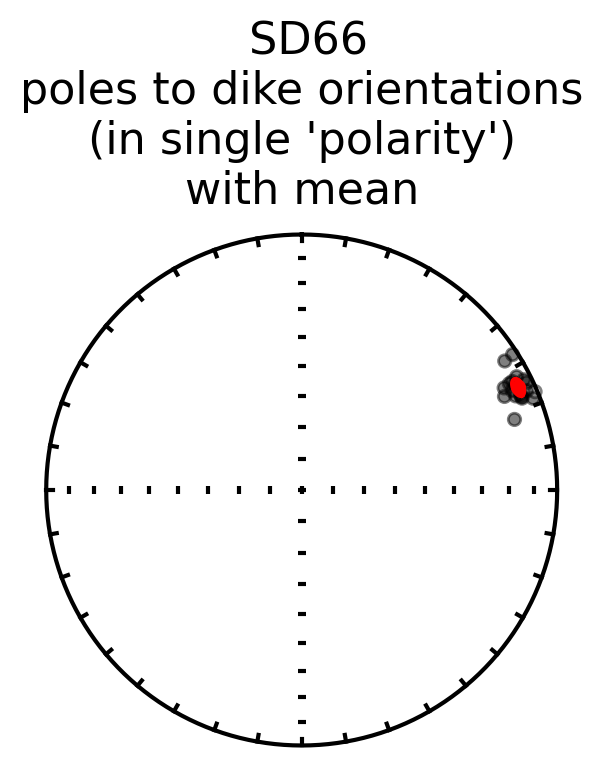

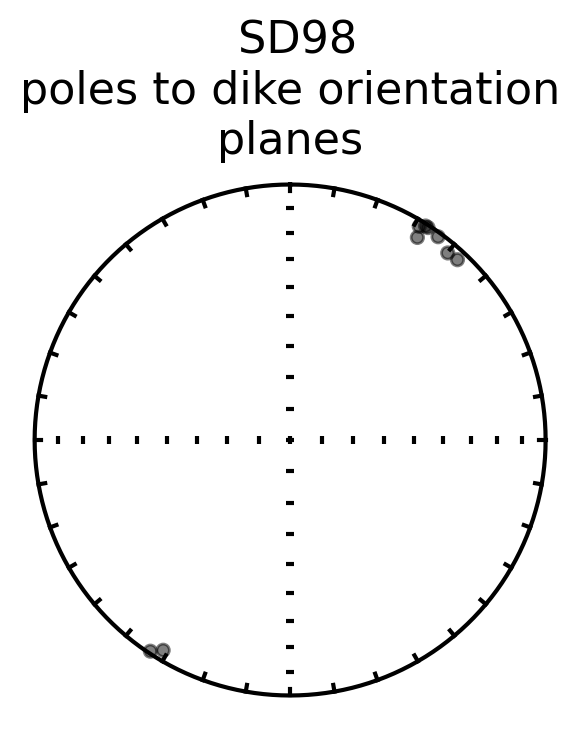

The mean dike plane pole is:
Dec: 34.7  Inc: 1.9
Number of directions in mean (n): 9
Angular radius of 95% confidence (a_95): 3.4
Precision parameter (k) estimate: 229.4


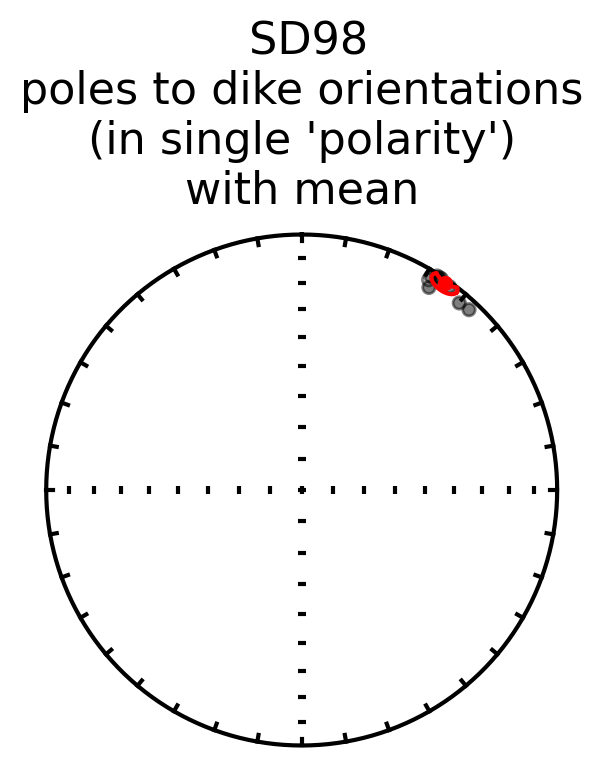

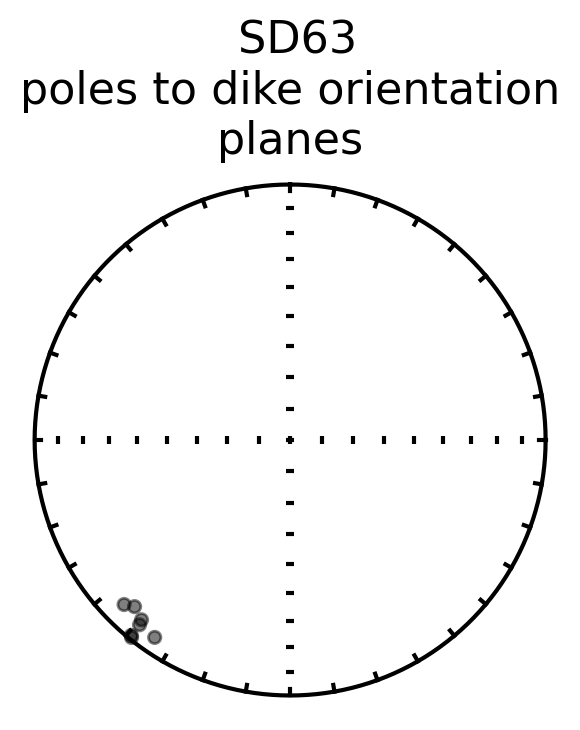

The mean dike plane pole is:
Dec: 219.9  Inc: 6.8
Number of directions in mean (n): 7
Angular radius of 95% confidence (a_95): 4.0
Precision parameter (k) estimate: 232.9


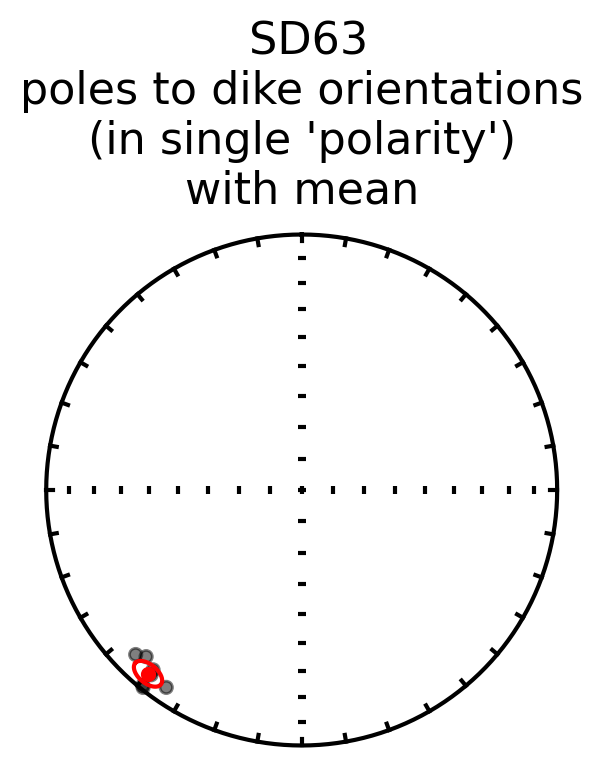

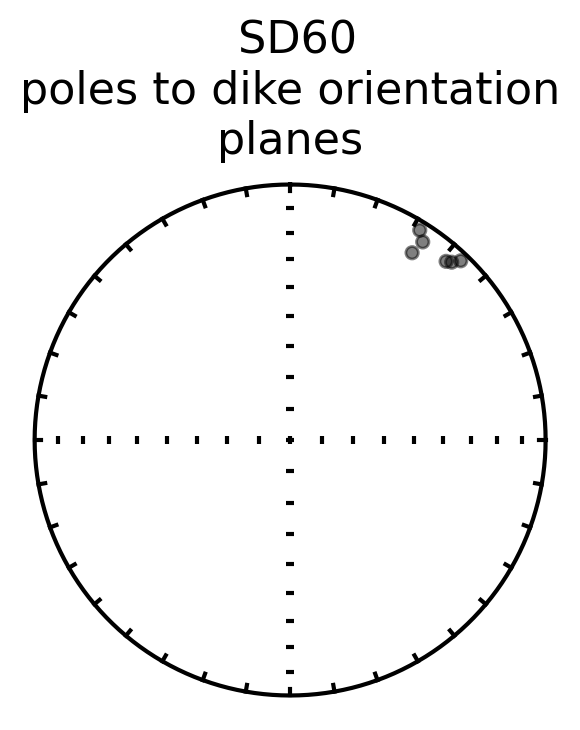

The mean dike plane pole is:
Dec: 37.6  Inc: 7.2
Number of directions in mean (n): 6
Angular radius of 95% confidence (a_95): 5.3
Precision parameter (k) estimate: 161.6


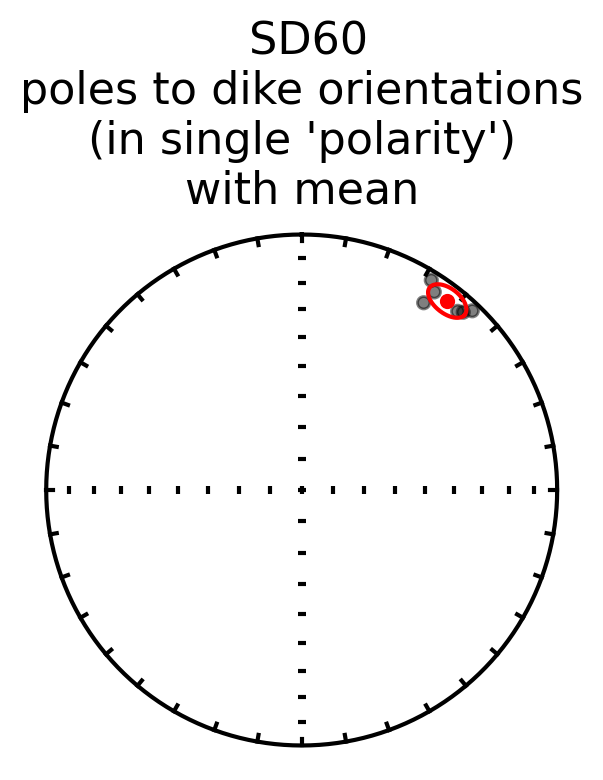

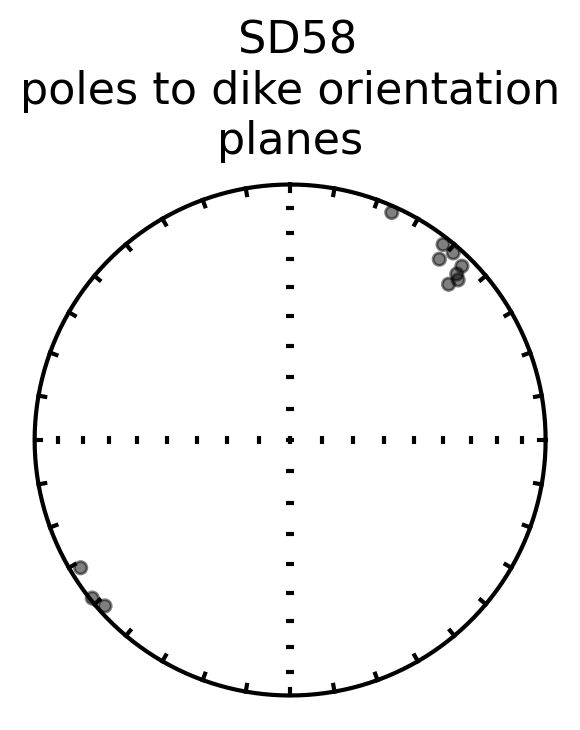

The mean dike plane pole is:
Dec: 43.9  Inc: 4.4
Number of directions in mean (n): 11
Angular radius of 95% confidence (a_95): 5.9
Precision parameter (k) estimate: 60.7


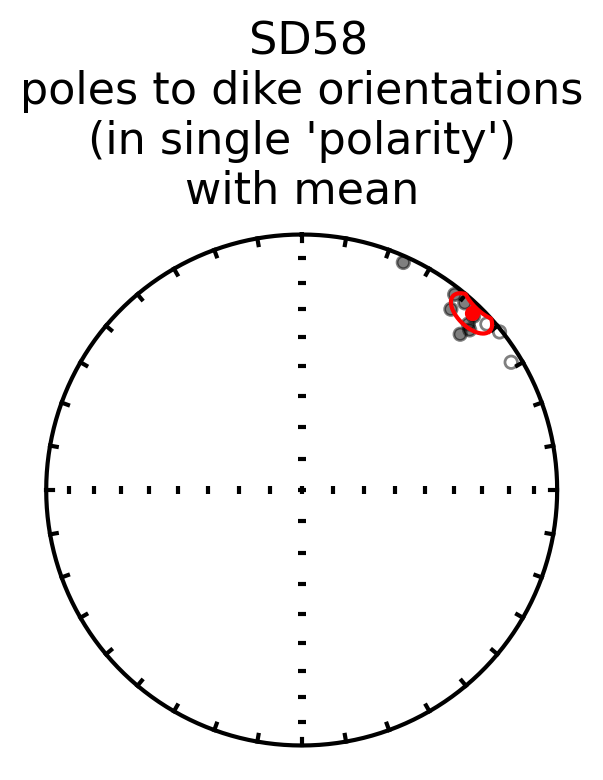

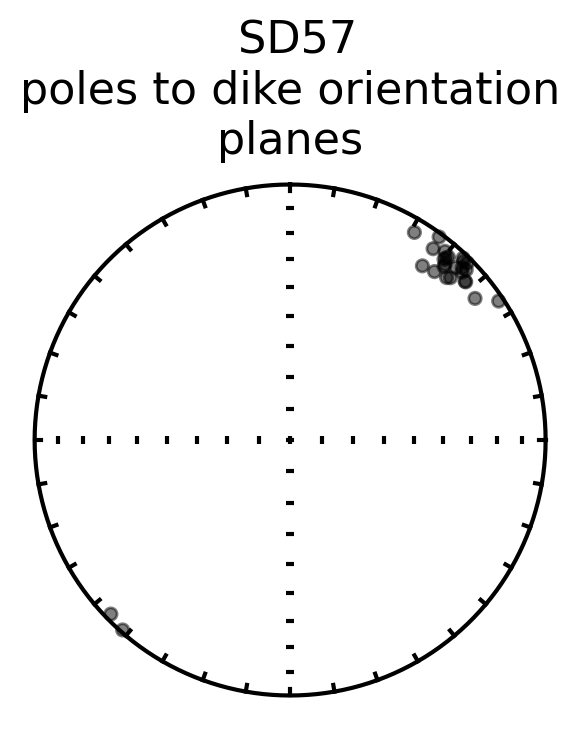

The mean dike plane pole is:
Dec: 43.1  Inc: 6.6
Number of directions in mean (n): 26
Angular radius of 95% confidence (a_95): 2.4
Precision parameter (k) estimate: 144.2


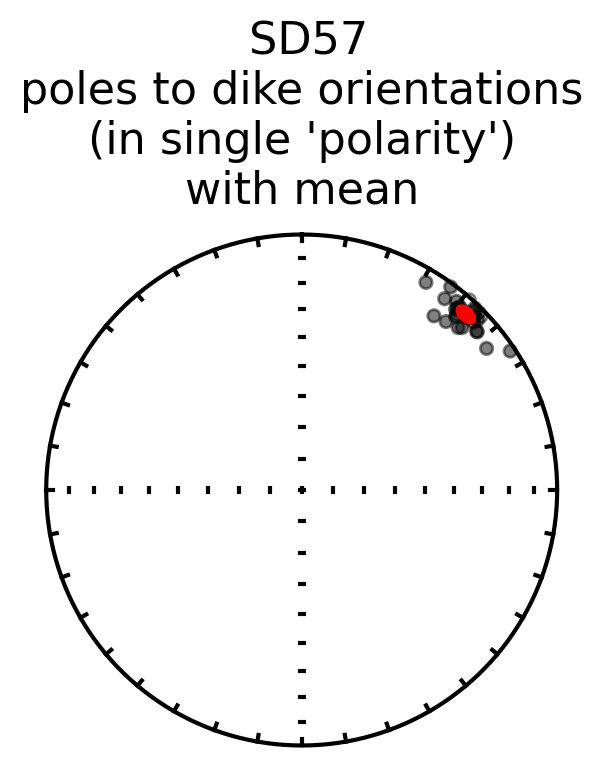

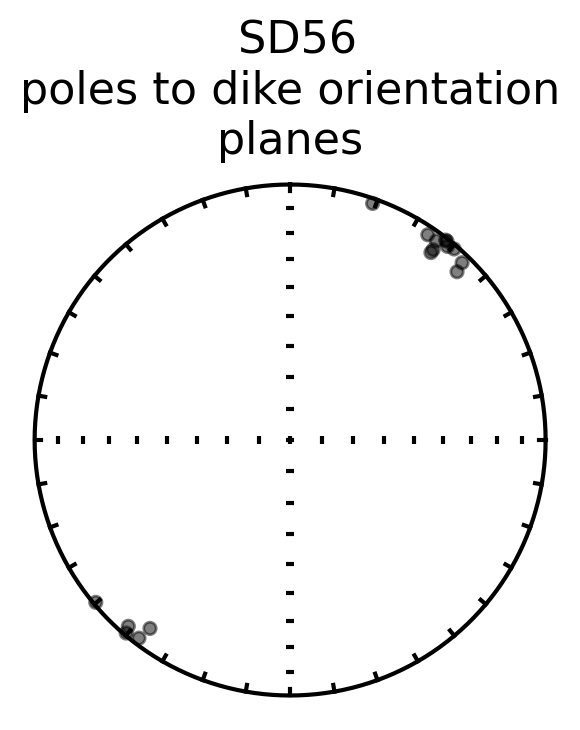

The mean dike plane pole is:
Dec: 38.4  Inc: 1.7
Number of directions in mean (n): 16
Angular radius of 95% confidence (a_95): 3.6
Precision parameter (k) estimate: 104.2


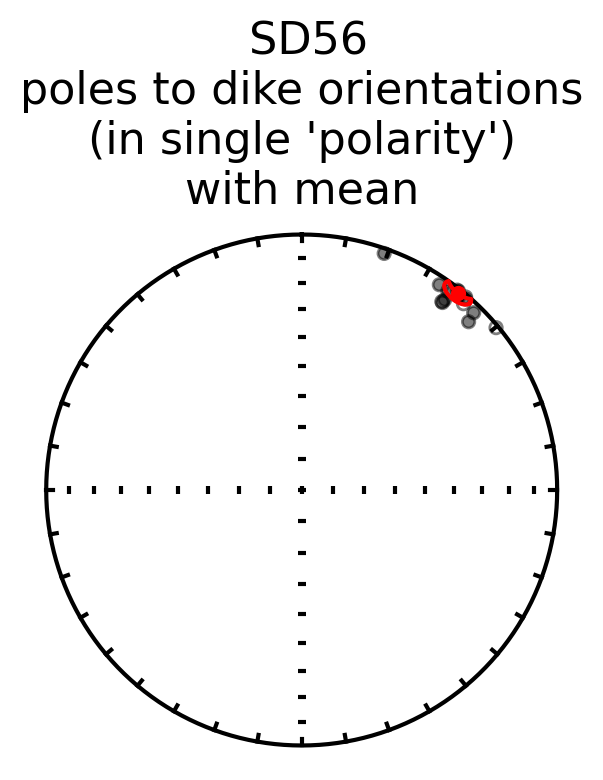

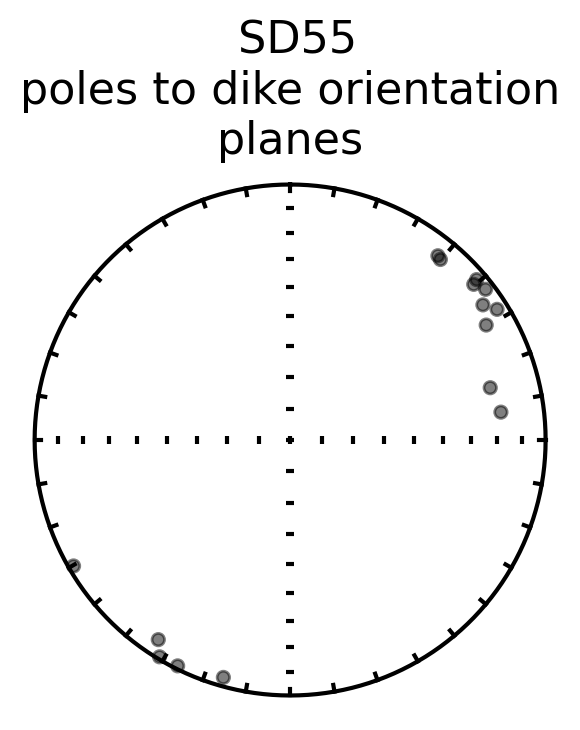

The mean dike plane pole is:
Dec: 48.2  Inc: 5.5
Number of directions in mean (n): 15
Angular radius of 95% confidence (a_95): 9.3
Precision parameter (k) estimate: 17.8


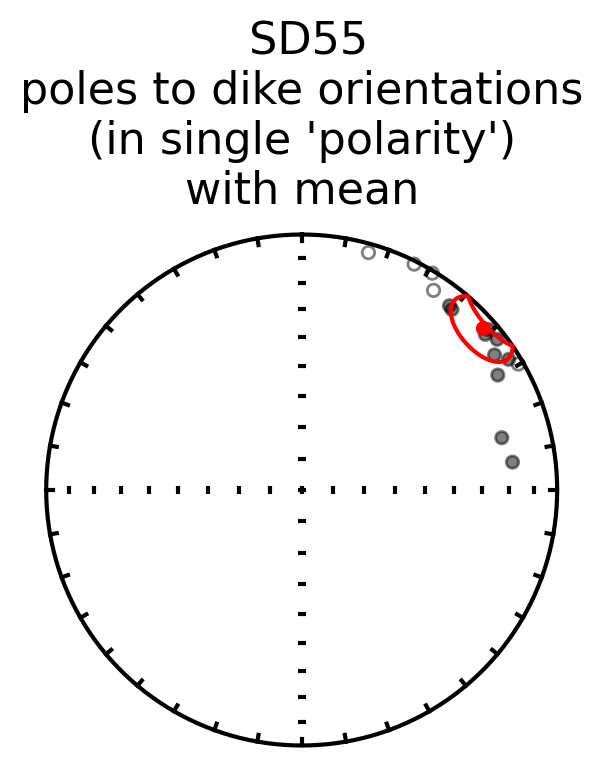

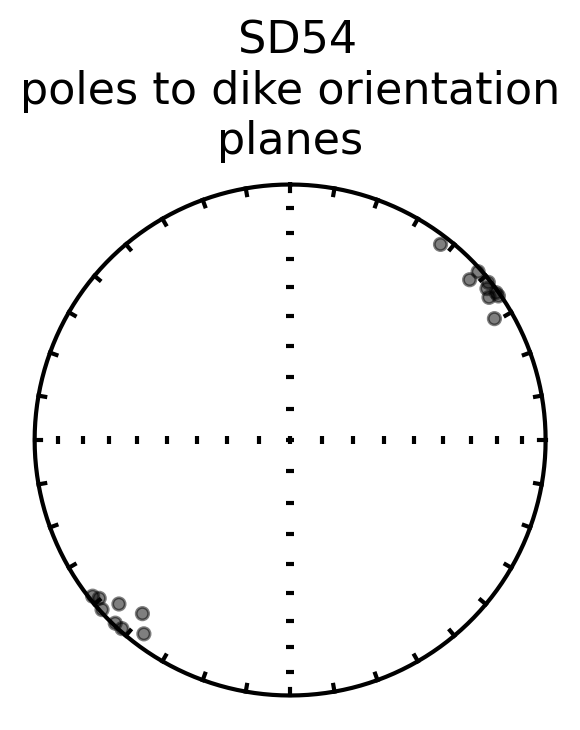

The mean dike plane pole is:
Dec: 228.3  Inc: 0.2
Number of directions in mean (n): 17
Angular radius of 95% confidence (a_95): 3.6
Precision parameter (k) estimate: 99.2


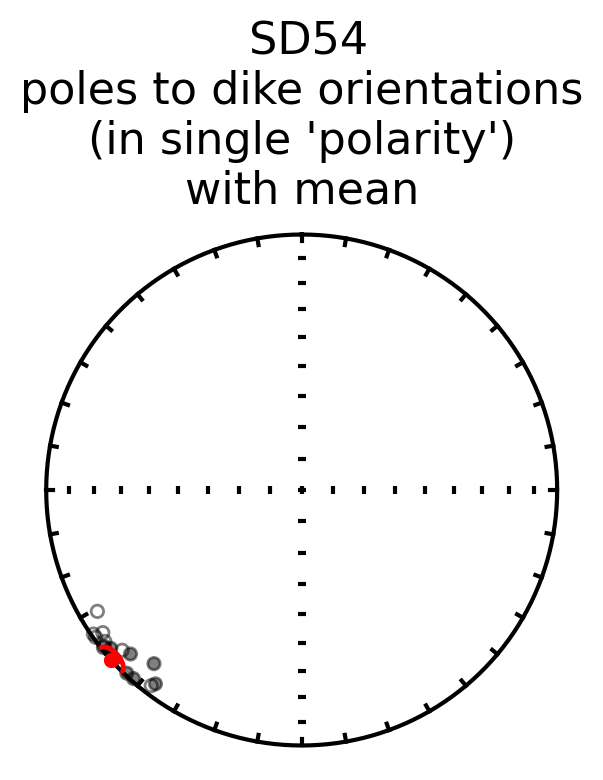

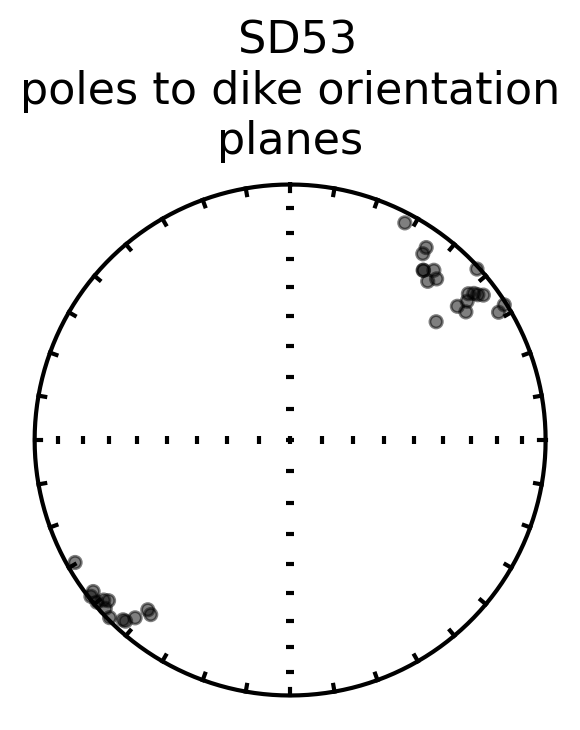

The mean dike plane pole is:
Dec: 46.5  Inc: 4.8
Number of directions in mean (n): 32
Angular radius of 95% confidence (a_95): 4.0
Precision parameter (k) estimate: 41.0


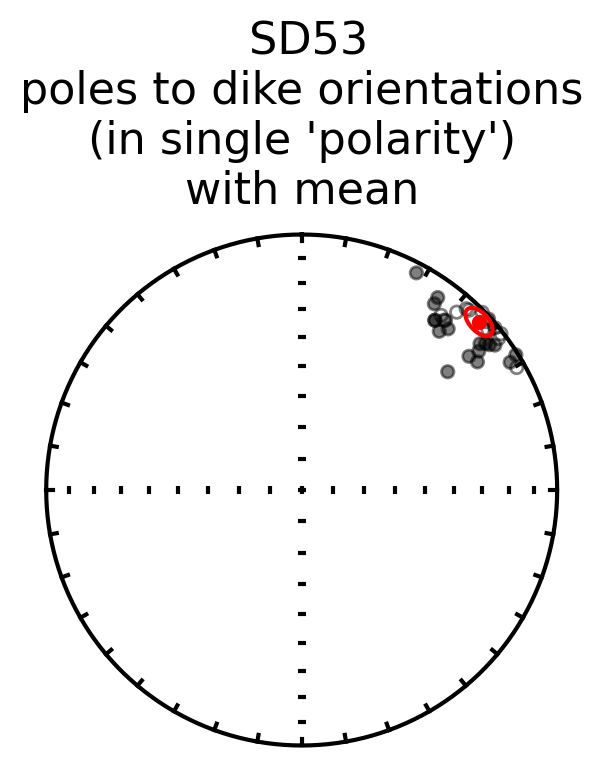

In [12]:
#need to build up dike dataframe with results
dike_plane_pole_means = pd.DataFrame()
dike_plane_pole_trend_list = []
dike_plane_pole_plunge_list = []
dike_strike_list = []
dike_dip_list = []
dike_alpha95_list = []
dike_n_list = []
dike_k_list = []

for dike in all_dike_planes[' rockUnit'].unique():
    dike_planes = all_dike_planes[(all_dike_planes[' rockUnit'] == dike)]
    dike_plane_pole_mean, dike_strike, dike_dip = calc_plot_dike_mean(dike, dike_planes['pole_trend'],dike_planes['pole_plunge'])
    dike_plane_pole_trend_list.append(dike_plane_pole_mean['dec'])
    dike_plane_pole_plunge_list.append(dike_plane_pole_mean['inc'])
    dike_strike_list.append(dike_strike)
    dike_dip_list.append(dike_dip)
    dike_alpha95_list.append(dike_plane_pole_mean['alpha95'])
    dike_n_list.append(dike_plane_pole_mean['n'])
    dike_k_list.append(dike_plane_pole_mean['k'])

dike_plane_pole_means['dike'] = all_dike_planes[' rockUnit'].unique()
dike_plane_pole_means['pole_trend'] = dike_plane_pole_trend_list
dike_plane_pole_means['pole_plunge'] = dike_plane_pole_plunge_list
dike_plane_pole_means['strike'] = dike_strike_list
dike_plane_pole_means['dip'] = dike_dip_list
dike_plane_pole_means['alpha95'] = dike_alpha95_list
dike_plane_pole_means['n'] = dike_n_list
dike_plane_pole_means['k'] = dike_k_list

In [13]:
# remove the leading space in the dike name that is an artefact of fieldmove csv export
dike_plane_pole_means['dike'] = dike_plane_pole_means['dike'].str.strip()
dike_plane_pole_means

,dike,pole_trend,pole_plunge,strike,dip,alpha95,n,k
0,SD01,74.114752,14.282921,164.114752,75.717079,7.200987,24,17.860598
1,SD02,241.144038,1.420821,331.144038,88.579179,7.332995,16,26.275805
2,SD03,69.564761,5.693408,159.564761,84.306592,6.938264,16,29.236859
3,SD04,74.385672,3.032081,164.385672,86.967919,4.412208,22,50.340495
4,SD05,37.283708,29.182009,127.283708,60.817991,3.045572,20,115.818265
5,SD06,252.297488,8.373166,342.297488,81.626834,8.566264,10,32.763024
6,SD07,48.677413,8.182579,138.677413,81.817421,6.243023,28,20.044182
7,SD08,263.780895,0.669343,353.780895,89.330657,3.414569,30,60.223508
8,SD09,67.911190,4.185529,157.911190,85.814471,7.407606,20,20.389494
9,SD10,209.177773,5.654707,299.177773,84.345293,4.949743,52,16.891763


In [14]:
print('number of dike plane measurements')
print(dike_plane_pole_means['n'].sum())

print('number of dikes measured:', len(dike_plane_pole_means))

number of dike plane measurements
1702
number of dikes measured: 85


In [15]:
dike_plane_pole_means['dike'].unique()

array(['SD01', 'SD02', 'SD03', 'SD04', 'SD05', 'SD06', 'SD07', 'SD08',
       'SD09', 'SD10', 'SD11', 'SD12', 'SD13', 'SD14', 'SD15', 'SD16',
       'SD17', 'SD18', 'SD19', 'SD20', 'SD21', 'SD22', 'SD23', 'SD24',
       'SD25', 'SD26', 'SD27', 'SD28', 'SD29', 'SD30', 'SD31', 'SD32',
       'SD33', 'SD34', 'SD35', 'SD36', 'SD37', 'SD38', 'SD39', 'SD40',
       'SD42', 'SD43', 'SD44', 'SD45', 'SD46', 'SD47', 'SD48', 'SD49',
       'SD51', 'SD52', 'SD106', 'SD104', 'SD105', 'SD102', 'SD100',
       'SD94', 'SD92', 'SD90', 'SD89', 'SD88', 'SD86', 'SD85', 'SD81',
       'SD83', 'SD84', 'SD82', 'SD78', 'SD76', 'SD74', 'SD75', 'SD73',
       'SD72', 'SD71', 'SD69', 'SD68', 'SD66', 'SD98', 'SD63', 'SD60',
       'SD58', 'SD57', 'SD56', 'SD55', 'SD54', 'SD53'], dtype=object)

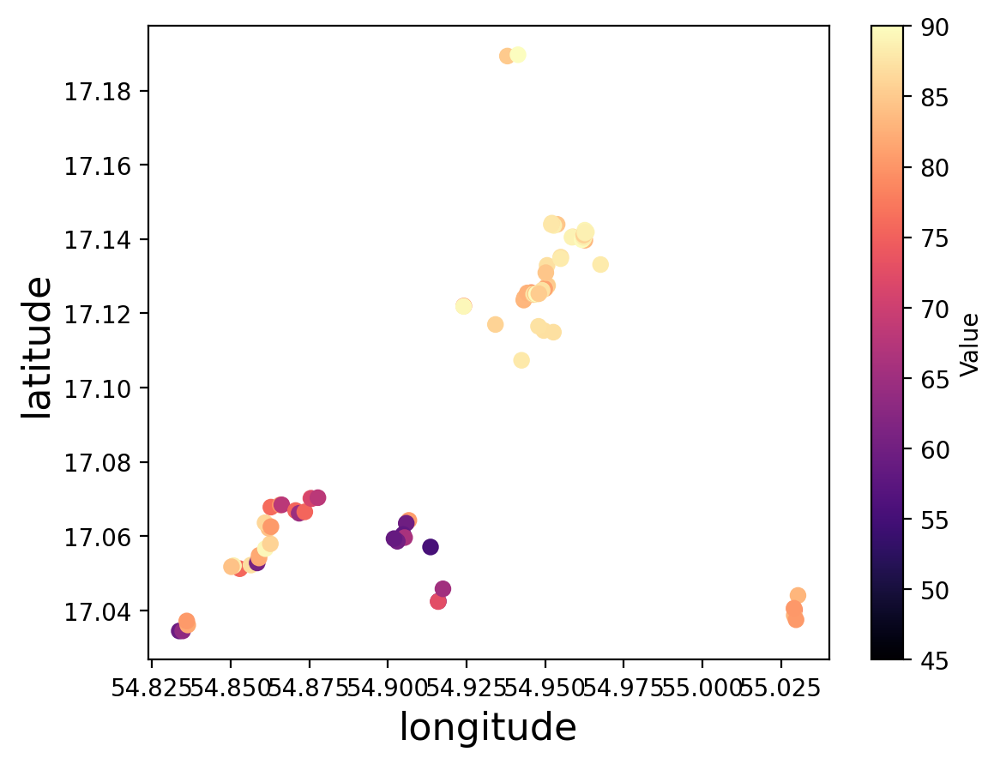

In [16]:
dikes = []
dike_lons = []
dike_lats = []

for unit in all_dike_planes[' rockUnit'].unique():
    dike_planes = all_dike_planes[all_dike_planes[' rockUnit']==unit]
    dikes.append(unit)
    
    dike_lat = dike_planes[' latitude'].mean()
    dike_lats.append(dike_lat)
    
    dike_lon = dike_planes[' longitude'].mean()
    dike_lons.append(dike_lon)
    
dike_locs_dict = {'dike': dikes, 'longitude': dike_lons, 'latitude': dike_lats}
dike_locations = pd.DataFrame(dike_locs_dict)    
dike_locations['dike'] = dike_locations['dike'].str.strip()

dike_orientations_locations = pd.merge(dike_plane_pole_means, dike_locations, left_on='dike', right_on='dike', how='left')

norm = mcolors.Normalize(vmin=45, vmax=90)
cmap = plt.get_cmap('magma')

sc = plt.scatter(dike_orientations_locations['longitude'], dike_orientations_locations['latitude'], 
                 c=dike_orientations_locations['dip'], cmap=cmap, norm=norm)
plt.xlabel('longitude', fontsize=16)
plt.ylabel('latitude', fontsize=16)
plt.colorbar(sc, label='Value')
plt.show()

In [17]:
dike_orientations_locations.head(1)

,dike,pole_trend,pole_plunge,strike,dip,alpha95,n,k,longitude,latitude
0,SD01,74.114752,14.282921,164.114752,75.717079,7.200987,24,17.860598,54.852878,17.051196


In [18]:
dike_orientations_locations.to_csv('./output/dike_orientations_locations.csv')

In [19]:
dike_orientations_locations['dike'].unique()

array(['SD01', 'SD02', 'SD03', 'SD04', 'SD05', 'SD06', 'SD07', 'SD08',
       'SD09', 'SD10', 'SD11', 'SD12', 'SD13', 'SD14', 'SD15', 'SD16',
       'SD17', 'SD18', 'SD19', 'SD20', 'SD21', 'SD22', 'SD23', 'SD24',
       'SD25', 'SD26', 'SD27', 'SD28', 'SD29', 'SD30', 'SD31', 'SD32',
       'SD33', 'SD34', 'SD35', 'SD36', 'SD37', 'SD38', 'SD39', 'SD40',
       'SD42', 'SD43', 'SD44', 'SD45', 'SD46', 'SD47', 'SD48', 'SD49',
       'SD51', 'SD52', 'SD106', 'SD104', 'SD105', 'SD102', 'SD100',
       'SD94', 'SD92', 'SD90', 'SD89', 'SD88', 'SD86', 'SD85', 'SD81',
       'SD83', 'SD84', 'SD82', 'SD78', 'SD76', 'SD74', 'SD75', 'SD73',
       'SD72', 'SD71', 'SD69', 'SD68', 'SD66', 'SD98', 'SD63', 'SD60',
       'SD58', 'SD57', 'SD56', 'SD55', 'SD54', 'SD53'], dtype=object)

## Plot all dike mean orientations


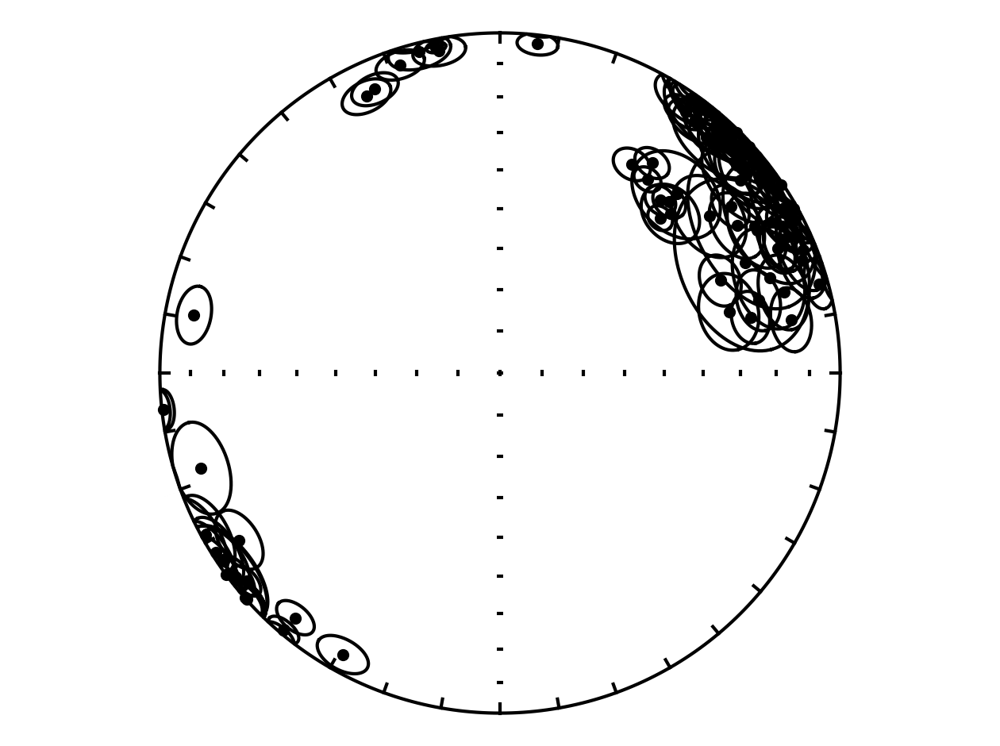

In [20]:
ipmag.plot_net()
for i in range(dike_orientations_locations.shape[0]):
    ipmag.plot_di_mean(dike_orientations_locations['pole_trend'][i],dike_orientations_locations['pole_plunge'][i],dike_orientations_locations['alpha95'][i],color='k')

In [21]:
E_W_dikes = ['SD68','SD69','SD71','SD74','SD106', 'SD104']
dike_orientation_E_W = dike_orientations_locations[dike_orientations_locations['dike'].isin(E_W_dikes)]
dike_orientation_E_W

,dike,pole_trend,pole_plunge,strike,dip,alpha95,n,k,longitude,latitude
50,SD106,349.303668,4.091581,439.303668,85.908419,4.662314,27,36.502452,54.934180,17.116981
51,SD104,334.198037,10.613427,424.198037,79.386573,4.768026,31,30.334378,54.924118,17.121953
68,SD74,342.043193,5.279340,432.043193,84.720660,4.410555,36,30.309671,54.953799,17.143955
72,SD71,345.907052,2.879520,435.907052,87.120480,5.512290,17,42.848655,54.952608,17.114909
73,SD69,6.510635,2.971238,96.510635,87.028762,3.551429,41,40.484191,54.949555,17.115353
74,SD68,348.878061,2.726345,438.878061,87.273655,1.714217,142,48.637444,54.947875,17.116482


In [22]:
pmag.doincfish(dike_orientation_E_W['pole_plunge'])

{'n': 6,
 'ginc': 4.760241744424607,
 'inc': 4.760241744424607,
 'k': 0,
 'upper_confidence_limit': 0,
 'lower_confidence_limit': 0,
 'csd': 0,
 'r': 0}

In [23]:
lat_SD102 = dike_orientations_locations.loc[dike_orientations_locations['dike'] == 'SD102', 'latitude'].values[0]

# Filter the dataframe
dike_orientation_NNW_Leger_region = dike_orientations_locations[
    (dike_orientations_locations['latitude'] >= lat_SD102) &
    (~dike_orientations_locations['dike'].isin(E_W_dikes))
]

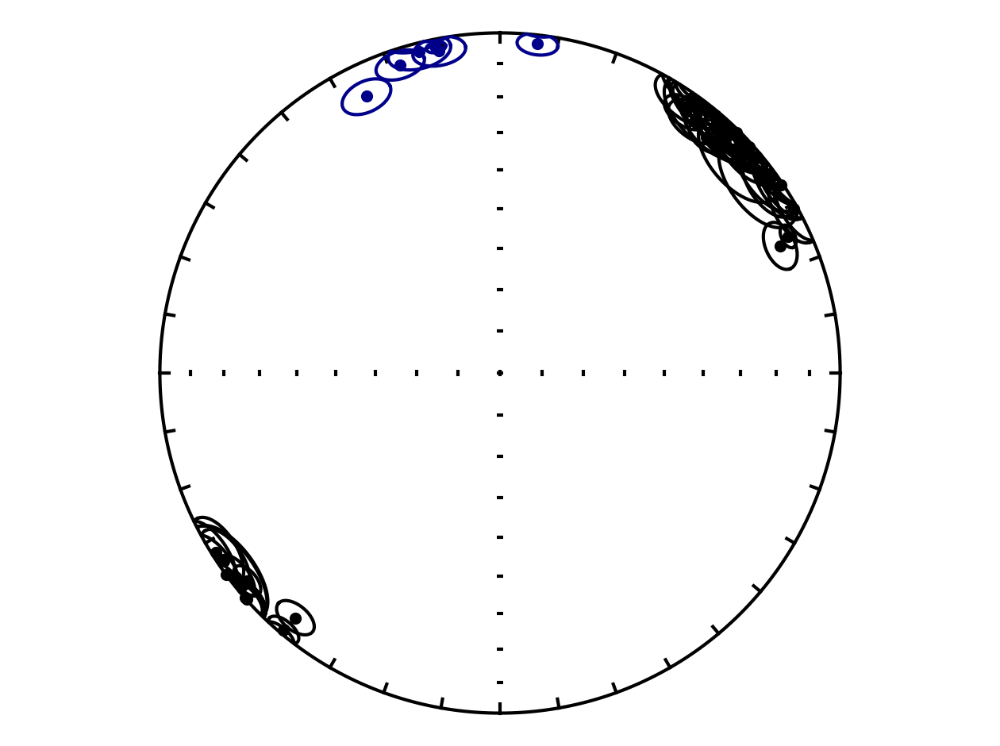

In [24]:
ipmag.plot_net()
for index, row in dike_orientation_NNW_Leger_region.iterrows():
    ipmag.plot_di_mean(row['pole_trend'],
                       row['pole_plunge'],
                       row['alpha95'],
                       color='k', label='NNW-SSE dikes (Leger region)')
    
for index, row in dike_orientation_E_W.iterrows():
    ipmag.plot_di_mean(row['pole_trend'],
                       row['pole_plunge'],
                       row['alpha95'],
                       color='darkblue', label='E-W dikes (Leger region)')

## Mesozoic-Cenozoic bedding

In [25]:
Mesozoic_Cenozoic_bedding = Nick_planes_2024[Nick_planes_2024[' rockUnit'] == ' Mesozoic sedimentary rocks']
Mesozoic_Cenozoic_bedding_Leger = Mesozoic_Cenozoic_bedding[Mesozoic_Cenozoic_bedding[' latitude'] >= lat_SD102]
Mesozoic_Cenozoic_bedding_Leger = calc_pole_from_plane(Mesozoic_Cenozoic_bedding_Leger)
Mesozoic_Cenozoic_bedding_Leger.columns.unique()

Index(['localityId', ' localityName', ' dataId', ' x', ' y', ' latitude',
       ' longitude', ' zone', ' altitude', ' horiz_precision',
       ' vert_precision', ' planeType', ' dip', ' dipAzimuth', ' strike',
       ' declination', ' unitId', ' timedate', ' notes', ' rockUnit',
       'pole_trend', 'pole_plunge'],
      dtype='object')

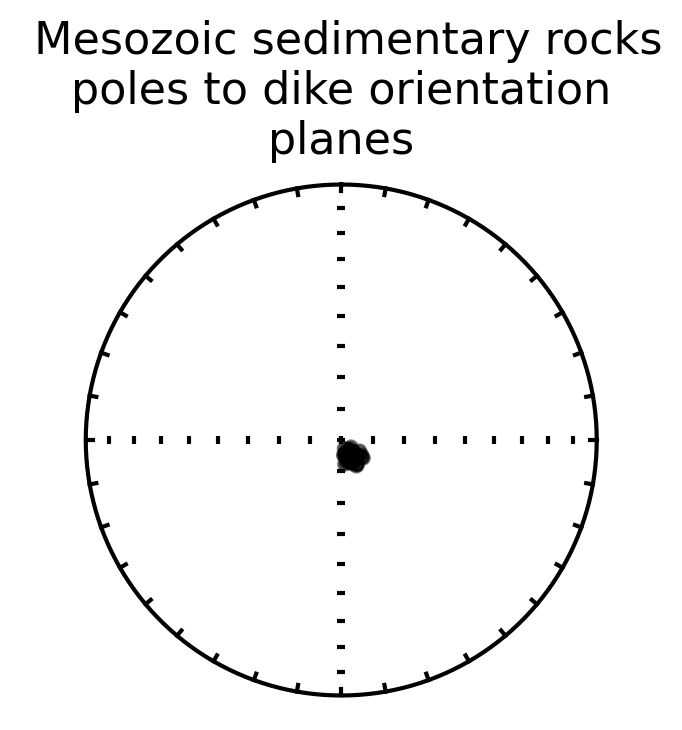

The mean dike plane pole is:
Dec: 149.2  Inc: 83.9
Number of directions in mean (n): 56
Angular radius of 95% confidence (a_95): 0.5
Precision parameter (k) estimate: 1521.4


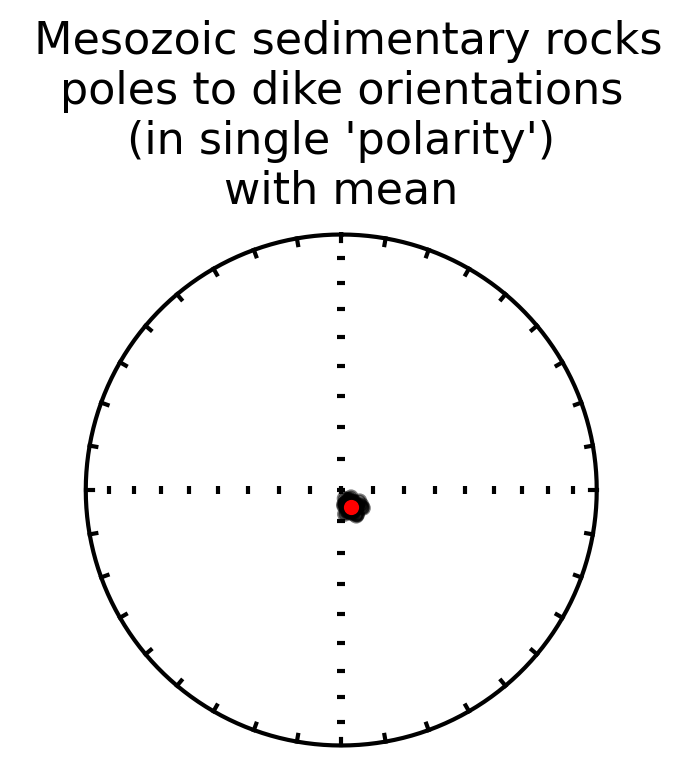

In [26]:
MC_pole_mean, MC_strike, MC_dip = calc_plot_dike_mean(' Mesozoic sedimentary rocks', 
                                                      Mesozoic_Cenozoic_bedding_Leger['pole_trend'], 
                                                      Mesozoic_Cenozoic_bedding_Leger['pole_plunge'])

In [27]:
print(MC_strike, MC_dip)

239.1842319099947 6.111498087450599


In [28]:
ipmag.fisher_mean(Mesozoic_Cenozoic_bedding_Leger[' longitude'].tolist(), 
                  Mesozoic_Cenozoic_bedding_Leger[' latitude'].tolist())

{'dec': 54.947734265503115,
 'inc': 17.211285305211543,
 'n': 56,
 'r': 55.99999990439532,
 'k': 575285625.268385,
 'alpha95': 0.0007921252812088748,
 'csd': 0.003377094843494996}

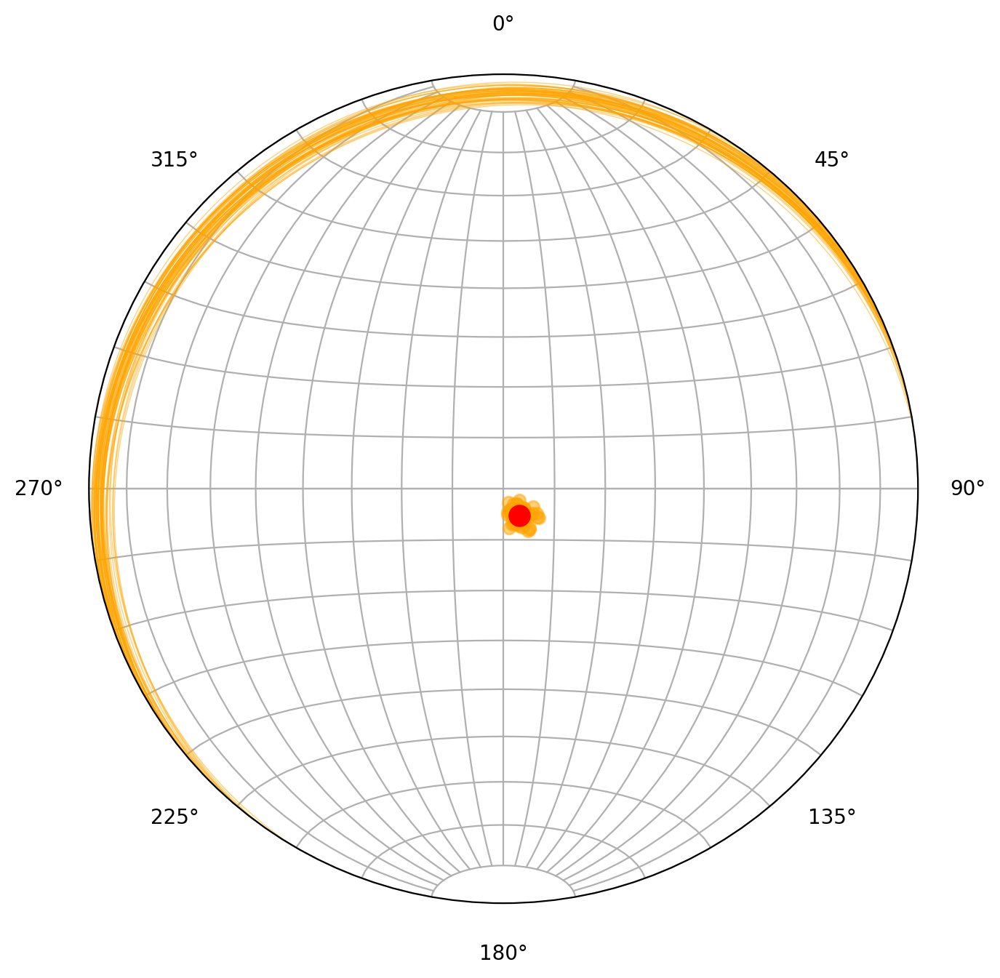

In [29]:
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='stereonet')

ax.plane(Mesozoic_Cenozoic_bedding_Leger[' strike'], Mesozoic_Cenozoic_bedding_Leger[' dip'], color='orange', linewidth=.5, alpha=0.5)
ax.pole(Mesozoic_Cenozoic_bedding_Leger[' strike'], Mesozoic_Cenozoic_bedding_Leger[' dip'], color='orange', alpha=0.5)
ax.pole(MC_strike, MC_dip, color='red', markersize=10)
ax.grid()
plt.tight_layout()
plt.show()

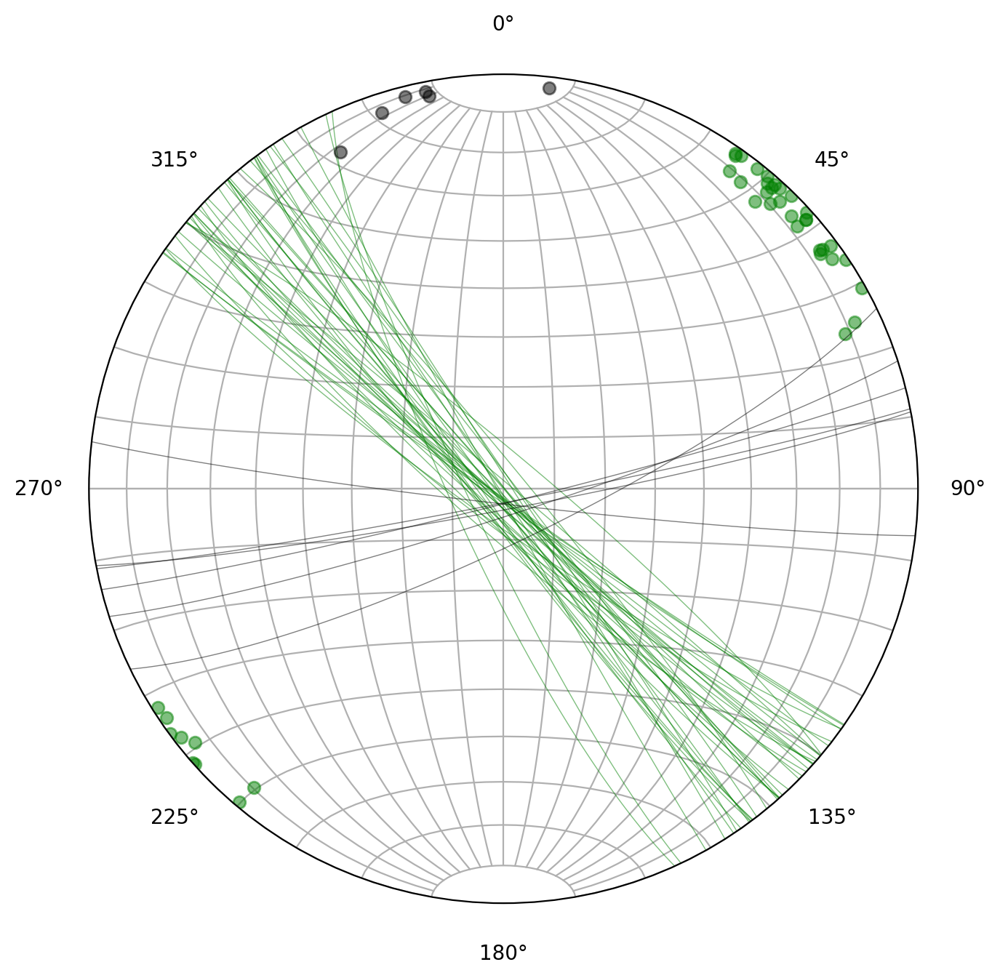

In [30]:
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='stereonet')

ax.plane(dike_orientation_NNW_Leger_region['strike'], dike_orientation_NNW_Leger_region['dip'], color='green', linewidth=.5, alpha=0.5)
ax.pole(dike_orientation_NNW_Leger_region['strike'], dike_orientation_NNW_Leger_region['dip'], color='green', alpha=0.5)
ax.plane(dike_orientation_E_W['strike'], dike_orientation_E_W['dip'], color='black', linewidth=.5, alpha=0.5)
ax.pole(dike_orientation_E_W['strike'], dike_orientation_E_W['dip'], color='black', alpha=0.5)
ax.grid()
plt.tight_layout()
plt.show()

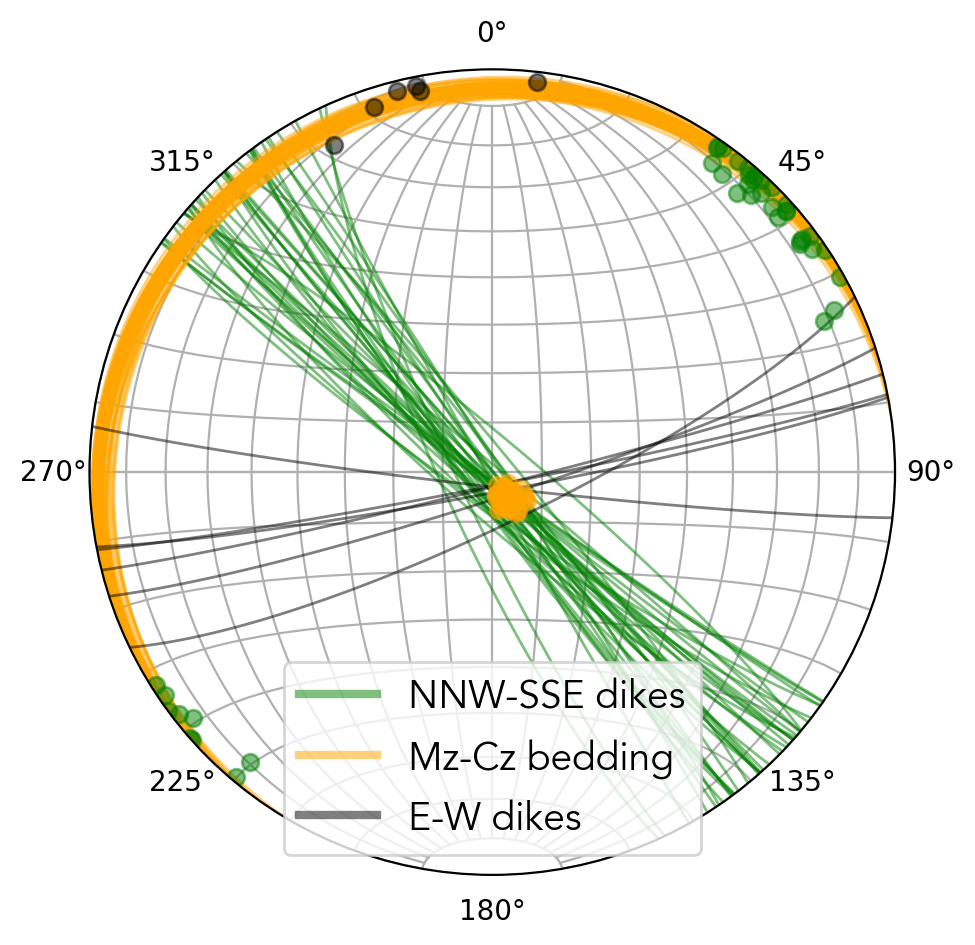

In [31]:
fig = plt.figure(figsize=(4, 4))
ax = fig.add_subplot(111, projection='stereonet')

ax.plane(dike_orientation_NNW_Leger_region['strike'], dike_orientation_NNW_Leger_region['dip'], color='green', linewidth=1, alpha=0.5)
ax.plane(Mesozoic_Cenozoic_bedding_Leger[' strike'], Mesozoic_Cenozoic_bedding_Leger[' dip'], color='orange', linewidth=1, alpha=0.5)
ax.plane(dike_orientation_E_W['strike'], dike_orientation_E_W['dip'], color='black', linewidth=1, alpha=0.5)
ax.pole(dike_orientation_NNW_Leger_region['strike'], dike_orientation_NNW_Leger_region['dip'], color='green', alpha=0.5)
ax.pole(dike_orientation_E_W['strike'], dike_orientation_E_W['dip'], color='black', alpha=0.5)
ax.pole(Mesozoic_Cenozoic_bedding_Leger[' strike'], Mesozoic_Cenozoic_bedding_Leger[' dip'], color='orange', alpha=0.5)
ax.grid()

legend_elements = [
    Line2D([0], [0], color='green', lw=3, alpha=0.5, label='NNW-SSE dikes'),
    Line2D([0], [0], color='orange', lw=3, alpha=0.5, label='Mz-Cz bedding'),
    Line2D([0], [0], color='black', lw=3, alpha=0.5, label='E-W dikes')
]

ax.legend(handles=legend_elements, loc='lower center', prop={'family': 'Avenir', 'size': 14})

plt.tight_layout(pad=-0.1)
plt.savefig('./output/orientation_stereonet.pdf',bbox_inches='tight')
plt.show()

In [33]:
import folium
import matplotlib as mpl 

esri_satellite = folium.TileLayer(
    tiles="https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
    attr="Esri",
    name="Esri Satellite",
    overlay=False,
    control=True
)

# Create a basic map
m = folium.Map(location=[dike_orientations_locations['latitude'].mean(), dike_orientations_locations['longitude'].mean()], 
               zoom_start=10, control_scale=True)
esri_satellite.add_to(m)

# Using matplotlib's viridis colormap
min_dip = dike_orientations_locations['dip'].min()
max_dip = dike_orientations_locations['dip'].max()
cm = mpl.cm.get_cmap('viridis')

def col_map(val):
    normalized = (val - min_dip) / (max_dip - min_dip)  # Normalize value to [0, 1]
    rgba = cm(normalized)  # Get rgba value from colormap
    return mpl.colors.rgb2hex(rgba)  # Using the correct import here

colormap = folium.LinearColormap(colors=[col_map(min_dip), col_map(max_dip)], 
                                 index=[min_dip, max_dip], vmin=min_dip, vmax=max_dip)
colormap.caption = "Dip Value"

m.add_child(colormap)



# Add points to the map using the colormap to determine colors
for _, row in dike_orientations_locations.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=5,
        color=colormap(row['dip']),
        fill=True,
        fill_opacity=0.6,
        tooltip=f'Dike: {row["dike"]}, Dip: {row["dip"]}'
    ).add_to(m)

m
